# Bank Marketing Data

## The Lifecycle In A Data Science Projects


### 1. Data Gathering
1. Problem Identification/problem understanding
2.	Data collection
3.	Train Val Test split
4.	Just look at the data/try to get a sense of the data/Understand the data
5.	Data cleaning

### 2.EDA

6.	Univariate Analysis
7.	Bi-variate Analysis
8.	Explore Numerical features
9.	Explore Categorical features

### 3.Feature Engineering

10.	Handing Missing values
11.	Handling Outliers
12. Feature transformation
13. Categorical Feature Encoding
14.	Feature scaling
15.	Imbalanced dataset

### 4.Model building

### 5.Feature Selection
16.	Feature Importance
17.	Feature Selection

### 6.Model Evaluation

### 7.Model Saving

### 8.Model Deployment

### 1.Problem Identification/problem understanding

#### Here the problem/challenge is to predict whether a customer will signup for term deposit or not given the relevent parameters

### 2.Data collection

#### This dataset is taken from UCI Machine Learning Repository
https://archive.ics.uci.edu/ml/datasets/Bank+Marketing

In [1]:
## Importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.utils import shuffle

# to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# setting the plot style 
# plt.style.use('ggplot')
sns.set_style('darkgrid')

# To display all the columns of the dataframe
pd.pandas.set_option('display.max_columns',None)

### 3.Train Test split

#### It's a very good practice to split the data into train test sets as soon as you get the data to avoid overfitting of the model and data leakage.

#### Remember that you want to use the test set only at the very end of your project, once you have a classifier that you are ready to launch

In [2]:
# Load the data

df = pd.read_csv('../Data/Bank_Marketing_Data_Set/bank-additional.csv')

In [3]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,30,blue-collar,married,basic.9y,no,yes,no,cellular,may,fri,487,2,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no
1,39,services,single,high.school,no,no,no,telephone,may,fri,346,4,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
2,25,services,married,high.school,no,yes,no,telephone,jun,wed,227,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,no
3,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,17,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no
4,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,58,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4114,30,admin.,married,basic.6y,no,yes,yes,cellular,jul,thu,53,1,999,0,nonexistent,1.4,93.918,-42.7,4.958,5228.1,no
4115,39,admin.,married,high.school,no,yes,no,telephone,jul,fri,219,1,999,0,nonexistent,1.4,93.918,-42.7,4.959,5228.1,no
4116,27,student,single,high.school,no,no,no,cellular,may,mon,64,2,999,1,failure,-1.8,92.893,-46.2,1.354,5099.1,no
4117,58,admin.,married,high.school,no,no,no,cellular,aug,fri,528,1,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,no


In [4]:
df.shape

(4119, 21)

In [5]:
# Renaming the 'y' feature to 'target' for the ease

df.rename(columns = {'y':'target'}, inplace = True)

In [6]:
df['target'] = df['target'].map({'no':0,'yes':1})

In [7]:
df['target'].value_counts()

0    3668
1     451
Name: target, dtype: int64

In [8]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,30,blue-collar,married,basic.9y,no,yes,no,cellular,may,fri,487,2,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,0
1,39,services,single,high.school,no,no,no,telephone,may,fri,346,4,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,0
2,25,services,married,high.school,no,yes,no,telephone,jun,wed,227,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,0
3,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,17,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,0
4,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,58,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4114,30,admin.,married,basic.6y,no,yes,yes,cellular,jul,thu,53,1,999,0,nonexistent,1.4,93.918,-42.7,4.958,5228.1,0
4115,39,admin.,married,high.school,no,yes,no,telephone,jul,fri,219,1,999,0,nonexistent,1.4,93.918,-42.7,4.959,5228.1,0
4116,27,student,single,high.school,no,no,no,cellular,may,mon,64,2,999,1,failure,-1.8,92.893,-46.2,1.354,5099.1,0
4117,58,admin.,married,high.school,no,no,no,cellular,aug,fri,528,1,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,0


In [9]:
# sampling 100 instances from the original dataset for each testing, validation sets and the rest will be traing set

test_df = df.sample(n=500,random_state=5)
new_df = df.drop(test_df.index)
val_df = new_df.sample(n=500,random_state=5)
train_df = new_df.drop(val_df.index)

In [10]:
# resetting the index of train, val and test datasets

train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

In [11]:
train_df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,25,services,married,high.school,no,yes,no,telephone,jun,wed,227,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,0
1,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,17,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,0
2,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,58,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,0
3,32,services,single,university.degree,no,no,no,cellular,sep,thu,128,3,999,2,failure,-1.1,94.199,-37.5,0.884,4963.6,0
4,32,admin.,single,university.degree,no,yes,no,cellular,sep,mon,290,4,999,0,nonexistent,-1.1,94.199,-37.5,0.879,4963.6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3114,31,technician,single,professional.course,no,yes,no,cellular,nov,thu,155,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
3115,30,admin.,married,basic.6y,no,yes,yes,cellular,jul,thu,53,1,999,0,nonexistent,1.4,93.918,-42.7,4.958,5228.1,0
3116,39,admin.,married,high.school,no,yes,no,telephone,jul,fri,219,1,999,0,nonexistent,1.4,93.918,-42.7,4.959,5228.1,0
3117,27,student,single,high.school,no,no,no,cellular,may,mon,64,2,999,1,failure,-1.8,92.893,-46.2,1.354,5099.1,0


In [12]:
val_df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,55,unemployed,married,university.degree,no,yes,no,cellular,nov,thu,303,2,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
1,50,blue-collar,single,basic.9y,unknown,yes,yes,telephone,may,thu,184,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,0
2,42,admin.,married,university.degree,no,no,no,cellular,nov,mon,226,2,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,0
3,41,blue-collar,married,basic.4y,no,yes,yes,cellular,may,wed,389,2,999,0,nonexistent,-1.8,92.893,-46.2,1.334,5099.1,0
4,50,blue-collar,married,basic.6y,no,yes,no,cellular,may,mon,293,3,3,1,success,-1.8,92.893,-46.2,1.354,5099.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,35,self-employed,unknown,university.degree,no,no,no,cellular,nov,thu,221,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
496,51,blue-collar,married,basic.6y,no,no,no,cellular,aug,fri,393,1,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,0
497,44,management,married,basic.9y,no,yes,no,cellular,aug,wed,260,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,0
498,52,self-employed,single,professional.course,no,no,yes,cellular,nov,thu,139,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0


In [13]:
test_df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,38,admin.,married,high.school,no,unknown,unknown,cellular,nov,thu,309,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
1,34,management,single,high.school,no,yes,no,cellular,nov,wed,175,1,999,0,nonexistent,-0.1,93.200,-42.0,4.120,5195.8,0
2,53,admin.,single,unknown,unknown,no,no,cellular,jul,tue,183,1,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,0
3,44,admin.,married,university.degree,no,no,no,cellular,aug,wed,96,2,4,1,success,-2.9,92.201,-31.4,0.879,5076.2,0
4,42,blue-collar,married,basic.4y,no,no,no,telephone,jun,tue,110,4,999,0,nonexistent,1.4,94.465,-41.8,4.864,5228.1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,33,admin.,divorced,university.degree,no,no,no,cellular,aug,thu,49,1,999,0,nonexistent,1.4,93.444,-36.1,4.962,5228.1,0
496,31,technician,married,professional.course,no,yes,no,cellular,jul,wed,225,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,0
497,25,admin.,single,university.degree,no,no,no,cellular,jul,fri,835,1,999,0,nonexistent,1.4,93.918,-42.7,4.957,5228.1,0
498,39,blue-collar,married,basic.6y,unknown,no,yes,cellular,jul,thu,122,1,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,0


### 4.Explore the data/try to get a sense of the data

In [14]:
# prints the first 5 rows/records

train_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,25,services,married,high.school,no,yes,no,telephone,jun,wed,227,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,0
1,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,17,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,0
2,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,58,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,0
3,32,services,single,university.degree,no,no,no,cellular,sep,thu,128,3,999,2,failure,-1.1,94.199,-37.5,0.884,4963.6,0
4,32,admin.,single,university.degree,no,yes,no,cellular,sep,mon,290,4,999,0,nonexistent,-1.1,94.199,-37.5,0.879,4963.6,0


In [15]:
# prints the shape of the dataframe (rows, columns)

train_df.shape

(3119, 21)

In [16]:
# Prints the no.of rows, no.of colunmns, and each columns datatype and the no.of non-null values in each column

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3119 entries, 0 to 3118
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             3119 non-null   int64  
 1   job             3119 non-null   object 
 2   marital         3119 non-null   object 
 3   education       3119 non-null   object 
 4   default         3119 non-null   object 
 5   housing         3119 non-null   object 
 6   loan            3119 non-null   object 
 7   contact         3119 non-null   object 
 8   month           3119 non-null   object 
 9   day_of_week     3119 non-null   object 
 10  duration        3119 non-null   int64  
 11  campaign        3119 non-null   int64  
 12  pdays           3119 non-null   int64  
 13  previous        3119 non-null   int64  
 14  poutcome        3119 non-null   object 
 15  emp.var.rate    3119 non-null   float64
 16  cons.price.idx  3119 non-null   float64
 17  cons.conf.idx   3119 non-null   f

#### Note : Its a very good practice to understand what each column represents / means by reading documents provided my subject matter expert or discusing with the domain expert if not do some reaserch. So that we can have an idea of how important each column/feature is and how to deal with it moving forward

#### -- Here we don't have much info. we just have to understand by observing each columns data

1.  - age (numeric)
2.  - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3.  - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4.  - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5.  - default: has credit in default? (categorical: 'no','yes','unknown')
6.  - housing: has housing loan? (categorical: 'no','yes','unknown')
7.  - loan: has personal loan? (categorical: 'no','yes','unknown')
#### related with the last contact of the current campaign:
8.  - contact: contact communication type (categorical: 'cellular','telephone')
9.  - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10.  - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11.  - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
#### other attributes:
12.  - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13.  - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14.  - previous: number of contacts performed before this campaign and for this client (numeric)
15.  - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
#### social and economic context attributes
16.  - emp.var.rate: employment variation rate - quarterly indicator (numeric)
#### An employment rate refers to the employment-to-population ratio or, more specifically, the proportion of working-age persons employed in an economy
17.  - cons.price.idx: consumer price index - monthly indicator (numeric)
#### The Consumer Price Index (CPI) measures the change in prices paid by consumers for goods and services
18.  - cons.conf.idx: consumer confidence index - monthly indicator (numeric)
#### The Consumer Confidence Index reports how consumers feel about the current situation of the economy and about where they feel it is headed.
19.  - euribor3m: euribor 3 month rate - daily indicator (numeric)
#### the basic rate of interest used in lending between banks on the European Union interbank market and also used as a reference for setting the interest rate on other loans.
20.  - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):
21.  - y - has the client subscribed a term deposit? (binary: 'yes','no')

#### -- And this data set is having 21 no.of features (including "target" ) and we must try to understand what each feature means so that it will be helpfull for us to do the better feature selection

In [17]:
#prints the list of collumns, yes its not exactly a list but Index type

train_df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'target'],
      dtype='object')

In [18]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
age,0,0.0
campaign,0,0.0
nr.employed,0,0.0
euribor3m,0,0.0
cons.conf.idx,0,0.0
cons.price.idx,0,0.0
emp.var.rate,0,0.0
poutcome,0,0.0
previous,0,0.0
pdays,0,0.0


In [19]:
train_df.nunique()

age                65
job                12
marital             4
education           7
default             3
housing             3
loan                3
contact             2
month              10
day_of_week         5
duration          754
campaign           23
pdays              20
previous            7
poutcome            3
emp.var.rate       10
cons.price.idx     26
cons.conf.idx      26
euribor3m         218
nr.employed        11
target              2
dtype: int64

### Observations :

1. From above we can see that the datatypes are represented properly and also no null values 
2. its small dataset only of size 4119, we sampled 500 for testing
3. we have large dataset in the same repo. if you want you can try with that - 'bank-additional-full.csv'

## EDA Exploratory Data Analysis

1. EDA can be leveraged to check for outliers, patterns, and trends in the given data.
2. EDA helps to find meaningful patterns in data.
3. EDA provides in-depth insights into the data sets to solve our business problems.
4. EDA gives a clue to impute missing values in the dataset 

In [20]:
# Extracting numerical column names

numerical_features = train_df.select_dtypes(include=np.number).columns
print(numerical_features)
print(len(numerical_features))

Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed',
       'target'],
      dtype='object')
11


In [21]:
# Extracting categorical features

categorical_features = train_df.select_dtypes(include='object').columns
print(categorical_features)
print(len(categorical_features))

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome'],
      dtype='object')
10


In [22]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
age,0,0.0
campaign,0,0.0
nr.employed,0,0.0
euribor3m,0,0.0
cons.conf.idx,0,0.0
cons.price.idx,0,0.0
emp.var.rate,0,0.0
poutcome,0,0.0
previous,0,0.0
pdays,0,0.0


In [23]:
zeros_count = {}
for col in train_df.columns:
    if col == 'Outcome':
        continue
    count = (train_df[col] == 0).sum()
    zeros_count[col]=count
    df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = df_zeros['zeros']/len(train_df)*100
df_zeros.sort_values(by=['zeros'],ascending=False)

,zeros,Percent
target,2773,88.906701
previous,2657,85.187560
pdays,2,0.064123
duration,1,0.032062
default,0,0.000000
marital,0,0.000000
nr.employed,0,0.000000
euribor3m,0,0.000000
cons.conf.idx,0,0.000000
cons.price.idx,0,0.000000


In [24]:
train_df['pdays'].value_counts()

999    2998
3        43
6        27
4        11
7         9
10        5
5         4
2         4
12        3
0         2
16        2
15        2
18        2
1         1
11        1
19        1
17        1
21        1
13        1
14        1
Name: pdays, dtype: int64

In [25]:
train_df.loc[train_df['pdays']==0]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
800,48,admin.,married,university.degree,no,yes,yes,cellular,aug,wed,288,1,0,3,success,-1.7,94.027,-38.3,0.9,4991.6,1
2391,44,services,divorced,basic.6y,no,yes,no,cellular,aug,wed,153,3,0,1,success,-1.7,94.027,-38.3,0.9,4991.6,1


In [26]:
train_df.loc[train_df['duration']==0]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
1482,39,admin.,married,high.school,no,yes,no,telephone,may,tue,0,4,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0


In [27]:
# pdays: number of days that passed by after the client was last contacted from a previous campaign 
# (numeric; 999 means client was not previously contacted)

### Statistics summary
#### Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In [28]:
# statistical summary of the data (only for Numerical features)

train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,3119.0,40.104841,10.263787,18.000,32.000,38.000,47.000,86.000
duration,3119.0,256.741904,257.293309,0.000,103.000,181.000,316.000,3643.000
campaign,3119.0,2.506893,2.476419,1.000,1.000,2.000,3.000,29.000
pdays,3119.0,960.470664,191.817511,0.000,999.000,999.000,999.000,999.000
previous,3119.0,0.192369,0.538027,0.000,0.000,0.000,0.000,6.000
emp.var.rate,3119.0,0.074671,1.567882,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,3119.0,93.579962,0.581623,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,3119.0,-40.493780,4.593376,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,3119.0,3.610131,1.738558,0.635,1.334,4.857,4.961,5.045
nr.employed,3119.0,5165.939724,74.067410,4963.600,5099.100,5191.000,5228.100,5228.100


### Observations :

These are very high level and approx observations. we must do further analysis.

1. Avg Age of customers is ~40 yrs with std of 10 ranging from (18-86). with quantle values seems right skewed.
2. Avg duration of customers phone call is ~257 with std of ~257 ranging from (0-3643). with quantle values seems heavily right skewed. and ouliers
3. Avg campaign (avg calls performed per customer) is ~2.5  with std of ~2.5 ranging from (1-35). with quantle values seems heavily right skewed. and ouliers
4. Avg previous (number of contacts performed before this campaign) is ~0.18 with std of ~0.53 ranging from (0-6). and 75% of the times no contact was made before the campaign. with quantle values seems heavily right skewed.

In [29]:
train_df['target'].value_counts(normalize=True)

0    0.889067
1    0.110933
Name: target, dtype: float64

In [30]:
fig = px.bar(x=train_df['target'].value_counts().index, y=train_df['target'].value_counts().values,
             text = train_df['target'].value_counts(),color=['blue', 'red'],opacity=0.8)
fig.show()

fig = px.pie(train_df, values=train_df['target'].value_counts().values, names=['Wll not signup','Will signup for term deposit'], title='target',opacity=0.8)
fig.show()

### Observation :
    
1. From above we can see that our train data heavily imbalanced (5:1). we will deal with it later.

### Univariate Analysis of Numerical_features

In [31]:
train_df[numerical_features].nunique().sort_values(ascending=False)

duration          754
euribor3m         218
age                65
cons.price.idx     26
cons.conf.idx      26
campaign           23
pdays              20
nr.employed        11
emp.var.rate       10
previous            7
target              2
dtype: int64

In [32]:
## Numerical variables are usually of 2 type
## 1. Continous variable and Discrete Variables

discrete_features = [feature for feature in numerical_features if len(train_df[feature].unique())<26]
print("Discrete Variables Count: {}".format(len(discrete_features)))

Discrete Variables Count: 6


In [33]:
discrete_features

['campaign', 'pdays', 'previous', 'emp.var.rate', 'nr.employed', 'target']

In [34]:
train_df[discrete_features].head()

,campaign,pdays,previous,emp.var.rate,nr.employed,target
0,1,999,0,1.4,5228.1,0
1,3,999,0,1.4,5228.1,0
2,1,999,0,-0.1,5195.8,0
3,3,999,2,-1.1,4963.6,0
4,4,999,0,-1.1,4963.6,0


In [35]:
continuous_features=[feature for feature in numerical_features if feature not in discrete_features]
print("Continuous feature Count {}".format(len(continuous_features)))

Continuous feature Count 5


In [36]:
train_df[continuous_features].head()

,age,duration,cons.price.idx,cons.conf.idx,euribor3m
0,25,227,94.465,-41.8,4.962
1,38,17,94.465,-41.8,4.959
2,47,58,93.200,-42.0,4.191
3,32,128,94.199,-37.5,0.884
4,32,290,94.199,-37.5,0.879


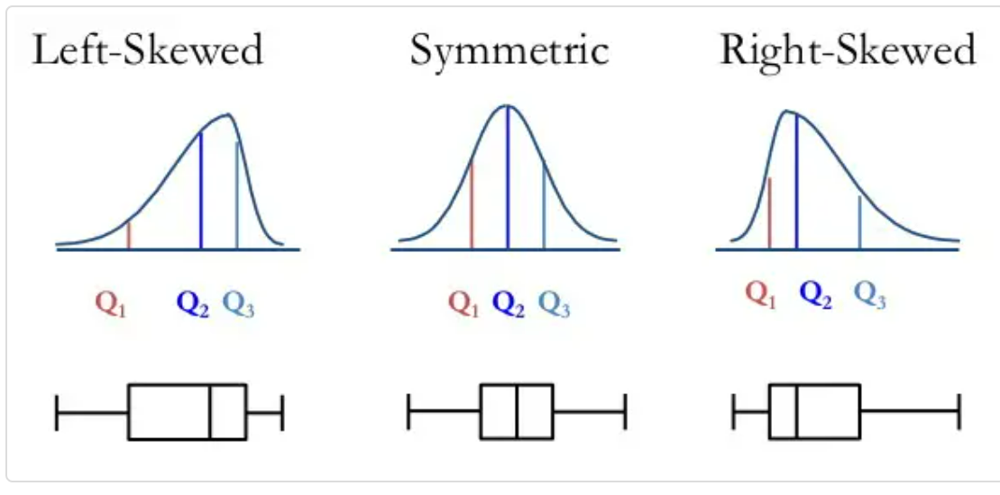

Box plots visually show the distribution of numerical data and skewness through displaying the data quartiles (or percentiles) and averages.

1. When the median is closer to the bottom of the box, and if the whisker is shorter on the lower end of the box, then the distribution is positively skewed (skewed right).

2. When the median is closer to the top of the box, and if the whisker is shorter on the upper end of the box, then the distribution is negatively skewed (skewed left).

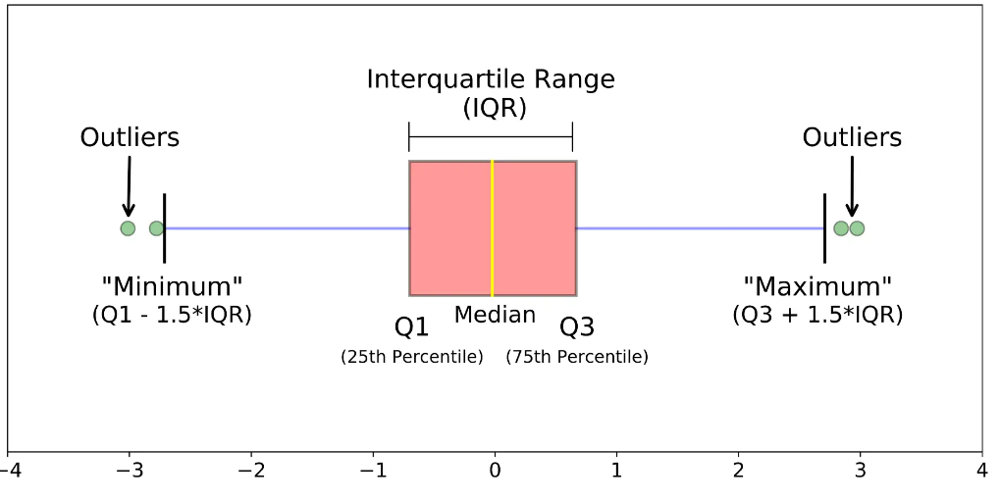

1. If the skewness is between -0.5 and 0.5, the data are fairly symmetrical. If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed. If the skewness is less than -1 or greater than 1, the data are highly skewed.

2. When the value of the skewness is negative, the tail of the distribution is longer towards the left hand side of the curve. and vice-versa

### Univariate/Bivariate distributions

In [37]:
def plot_comparison(data, col, title):
    fig, ax = plt.subplots(3, 1, sharex=True, figsize=[18,18])
    sns.histplot(data=train_df, x=col, kde=True,ax=ax[0],color = 'cornflowerblue')
    ax[0].set_title('Histogram + KDE')
    sns.boxenplot(x=col, ax=ax[1],color = 'cornflowerblue')
    ax[1].set_title('Boxplot')
    sns.violinplot(x=col,saturation=1, ax=ax[2],color = 'cornflowerblue', bw=.15,cut=0)
    ax[2].set_title('Violin plot')
    fig.suptitle(title, fontsize=16)
    plt.show()

age
Skew : 0.66
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


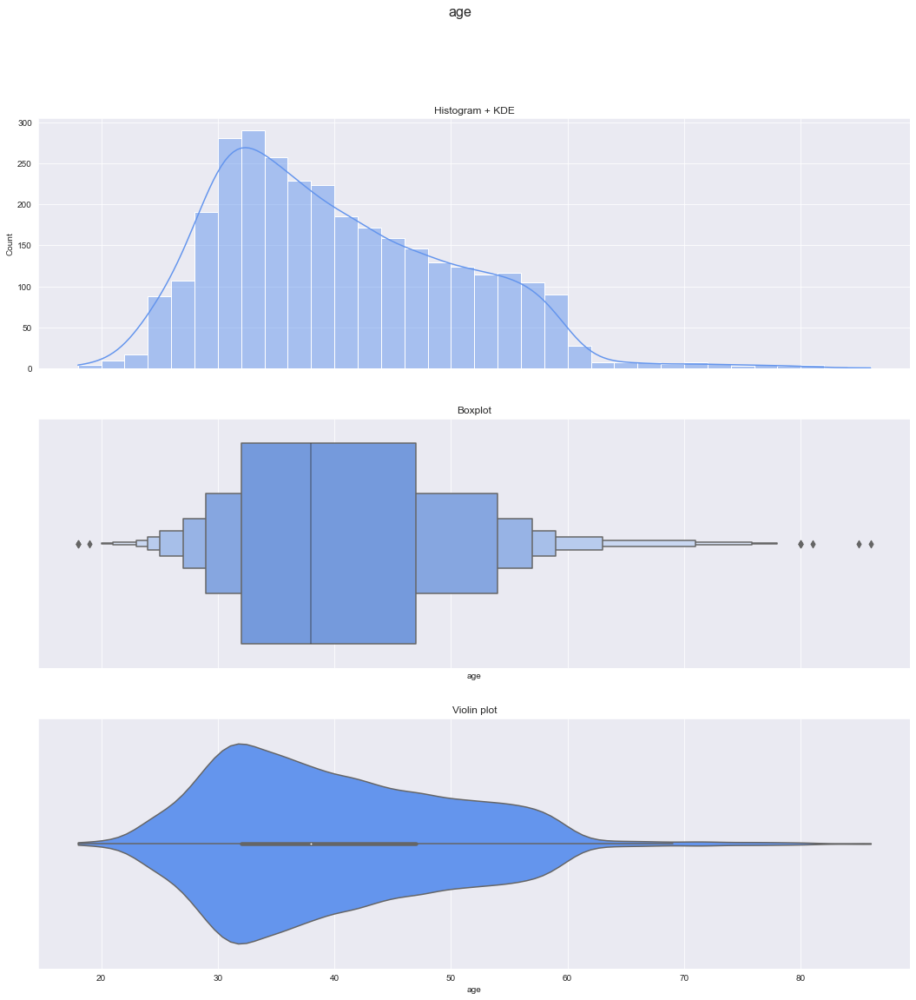

duration
Skew : 3.5
no.of zeros : 1
% of zeros : 0.03
no.of nulls : 0
% of nulls : 0.0


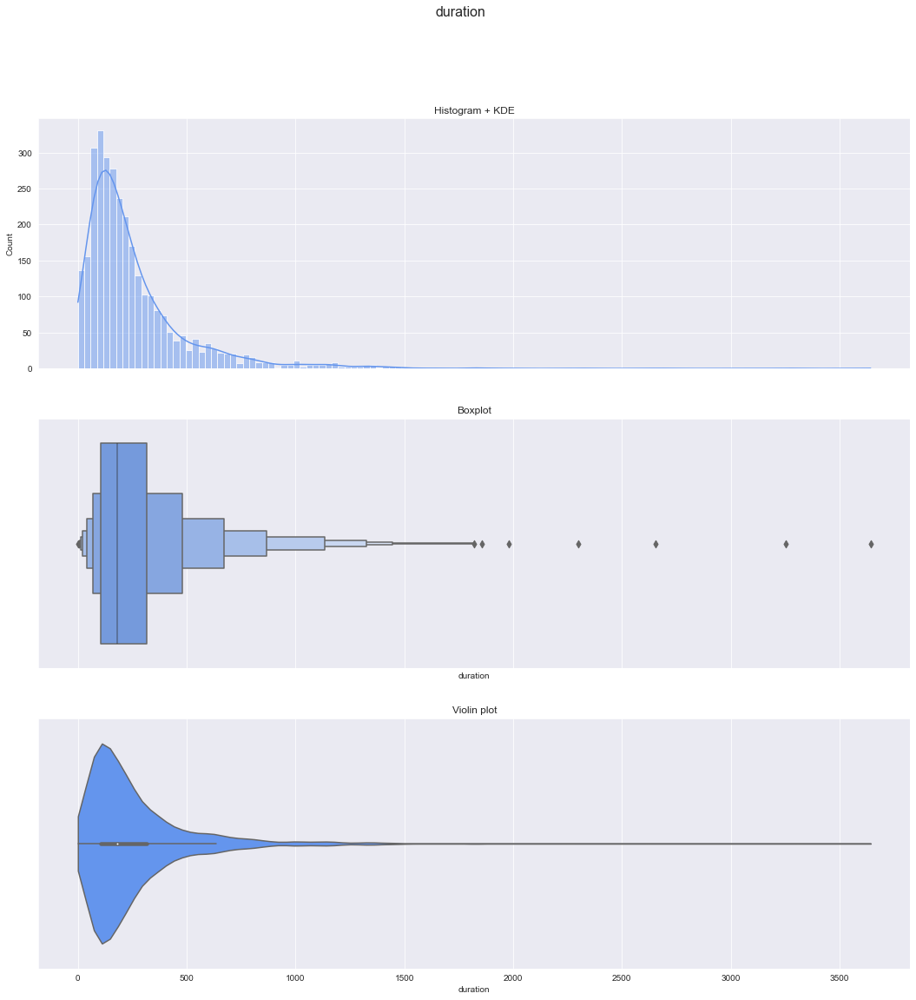

cons.price.idx
Skew : -0.22
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


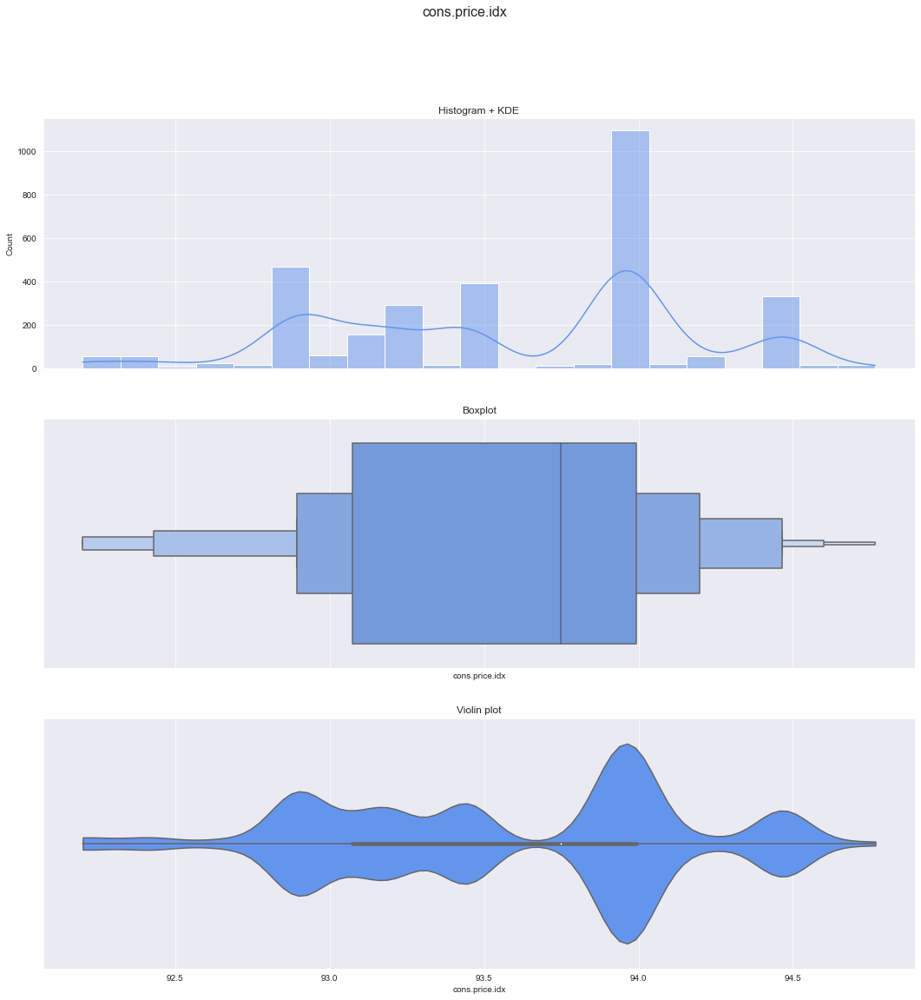

cons.conf.idx
Skew : 0.3
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


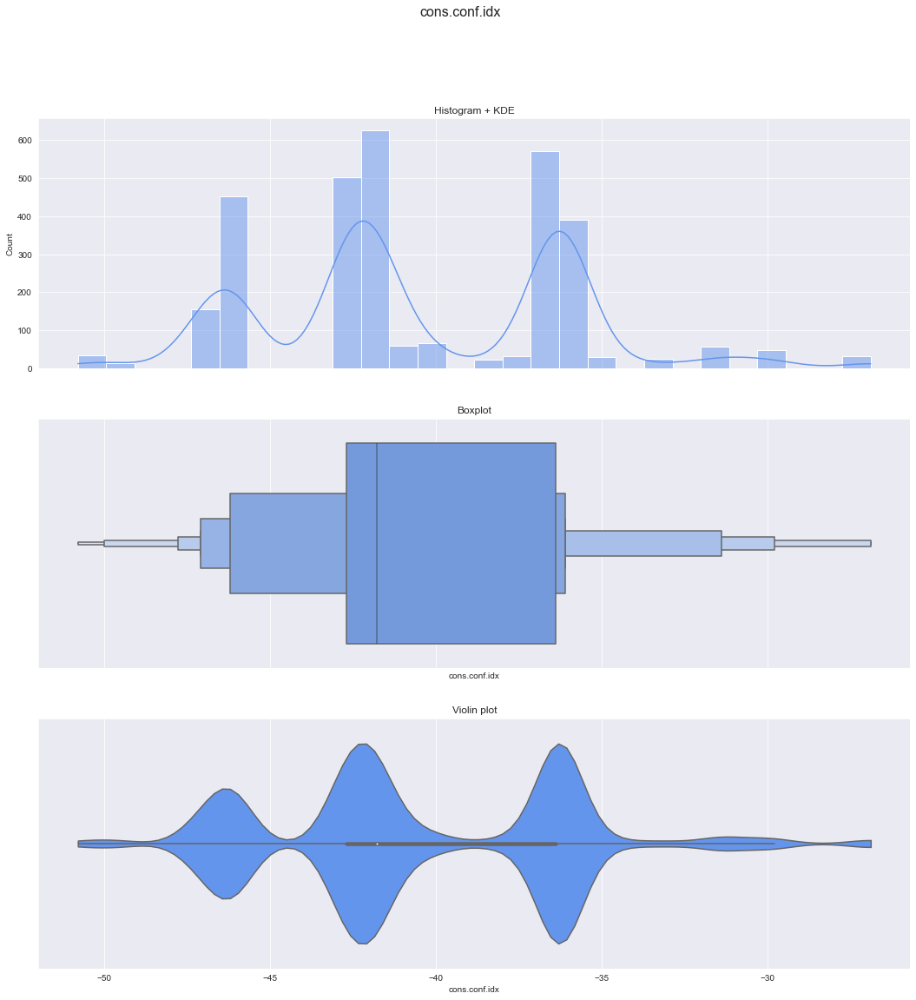

euribor3m
Skew : -0.7
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


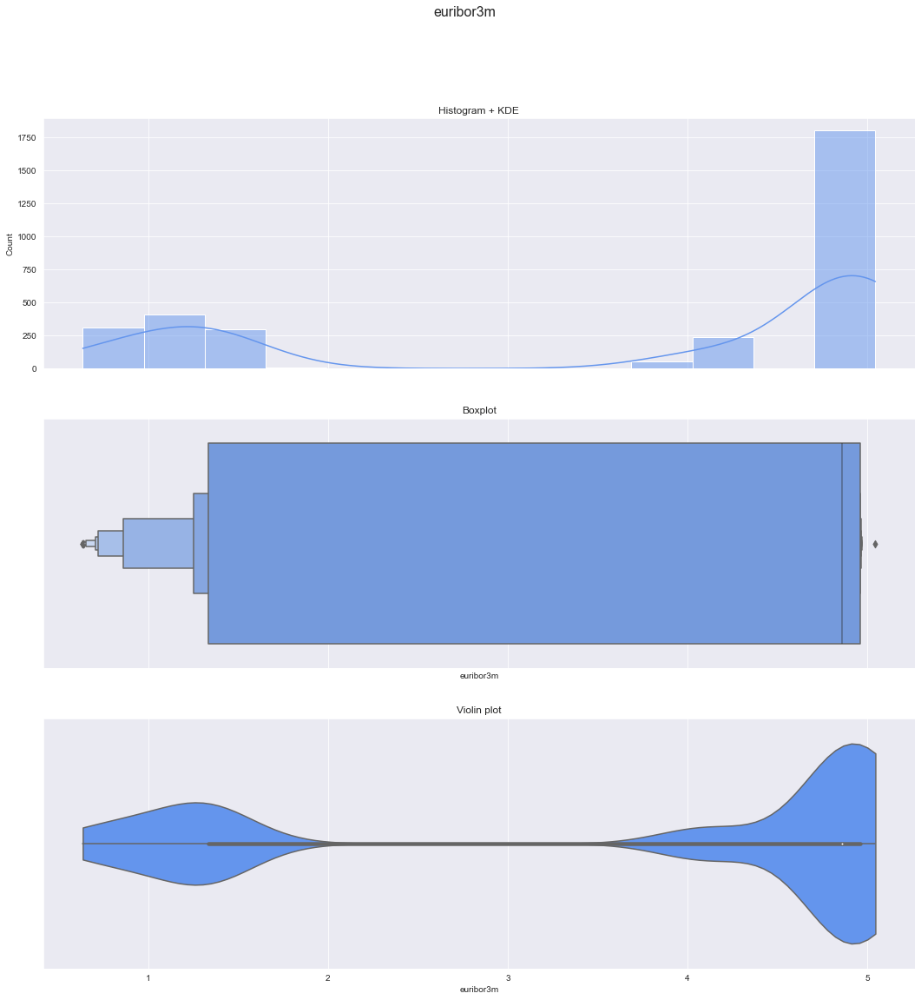

In [38]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    print('no.of zeros :',(train_df[col]==0).sum())
    print('% of zeros :',np.round_((train_df[col]==0).sum()/len(train_df)*100,decimals=2))
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_comparison(train_df, train_df[col], col)

age
no.of nulls : 0
% of nulls : 0.0
Skew : 0.66


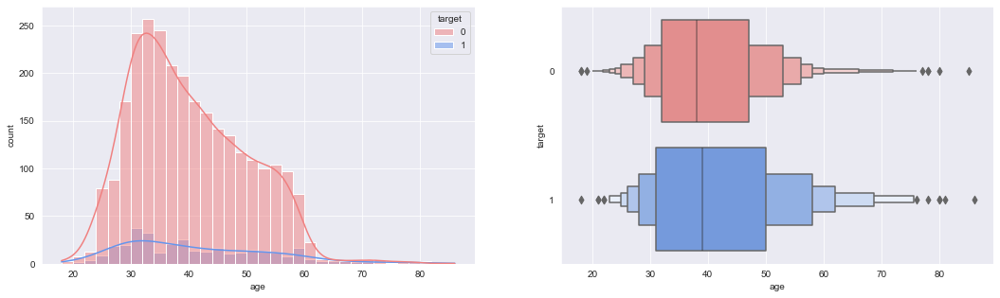

duration
no.of nulls : 0
% of nulls : 0.0
Skew : 3.5


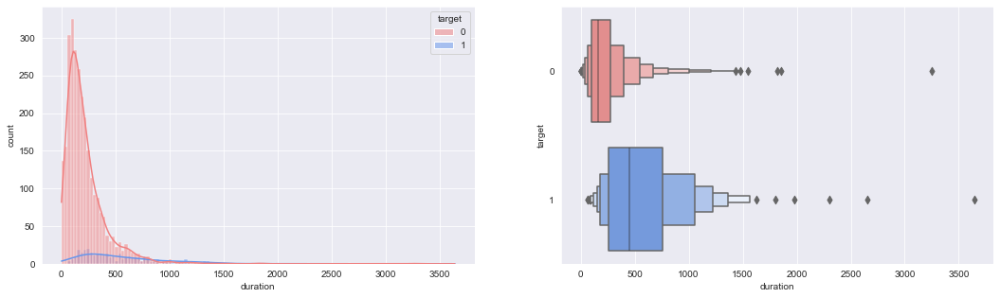

cons.price.idx
no.of nulls : 0
% of nulls : 0.0
Skew : -0.22


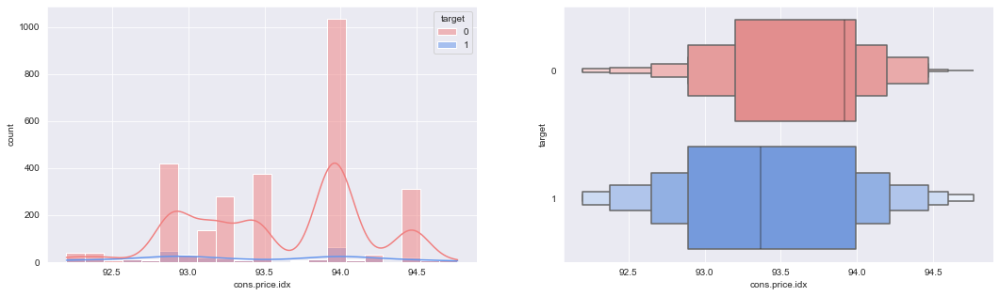

cons.conf.idx
no.of nulls : 0
% of nulls : 0.0
Skew : 0.3


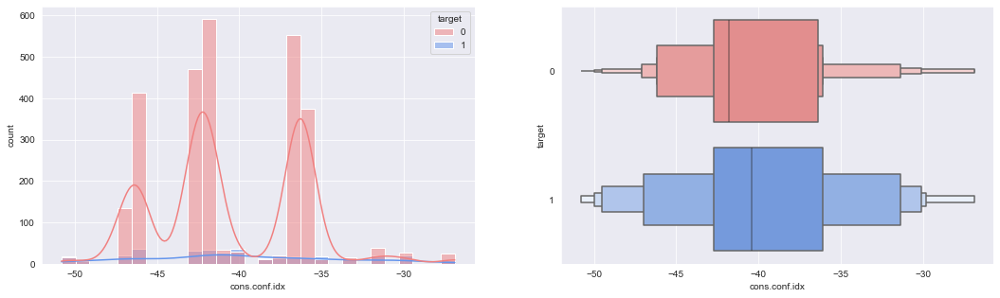

euribor3m
no.of nulls : 0
% of nulls : 0.0
Skew : -0.7


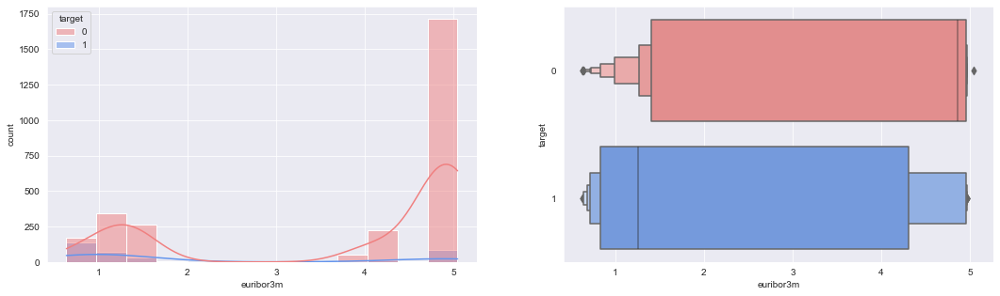

In [39]:
for col in continuous_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True,hue='target',palette=['lightcoral','cornflowerblue'])
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxenplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['lightcoral','cornflowerblue'])
    plt.show()

age
Skew : 0.66


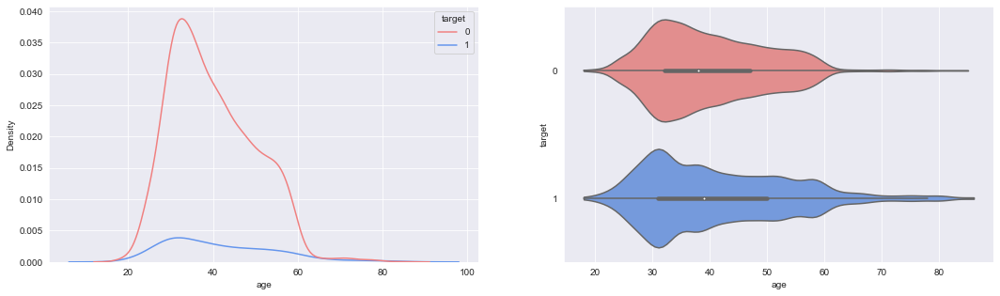

duration
Skew : 3.5


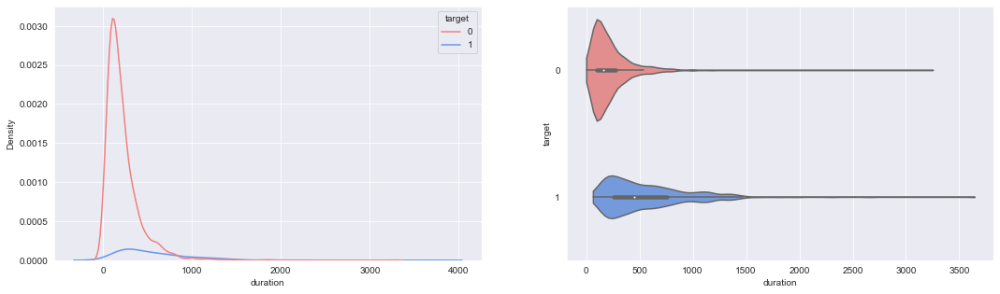

cons.price.idx
Skew : -0.22


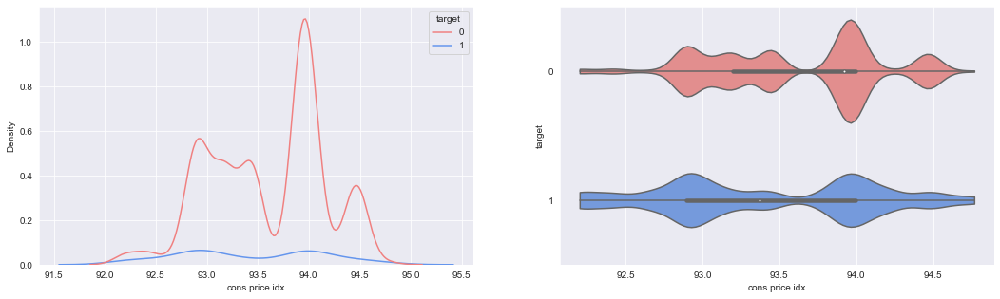

cons.conf.idx
Skew : 0.3


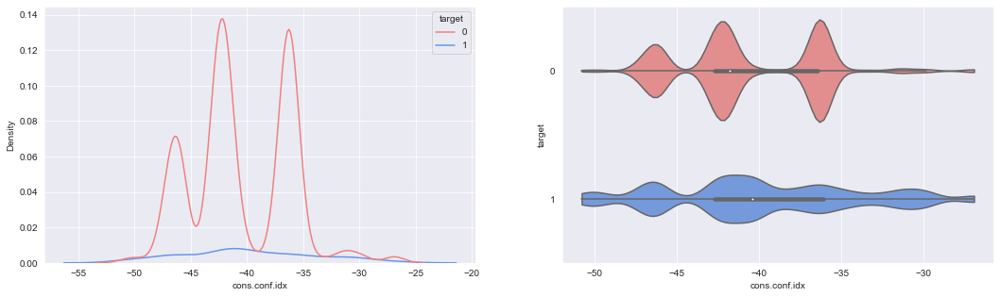

euribor3m
Skew : -0.7


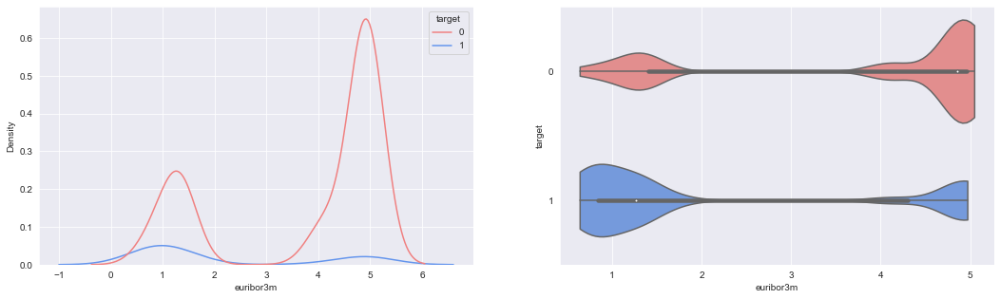

In [40]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.kdeplot(data=train_df, x=col,hue='target',palette=['lightcoral','cornflowerblue'])
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.subplot(1, 2, 2)
    #sns.violinplot(x=train_df[col],saturation=1)
    sns.violinplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['lightcoral','cornflowerblue'], bw=.15,cut=0)
    plt.show()

#### If you want to check whether feature is guassian or normal distributed
#### Q-Q plot

In [41]:
import scipy.stats as stat
import pylab 

age
Skew : 0.66
1.335847132576094e-43


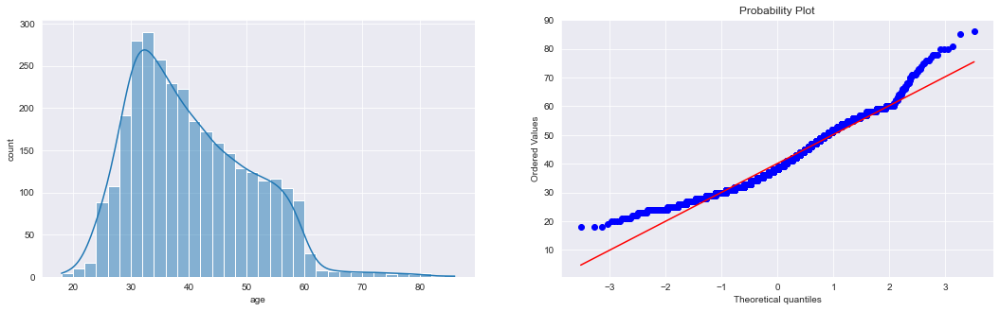

duration
Skew : 3.5
0.0


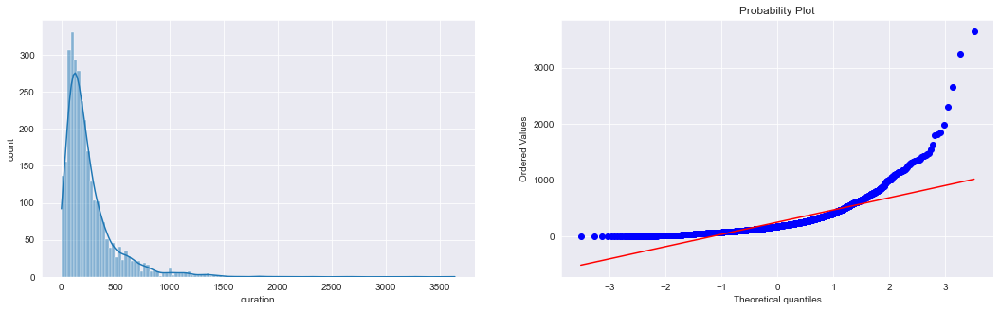

cons.price.idx
Skew : -0.22
2.3116522946107923e-71


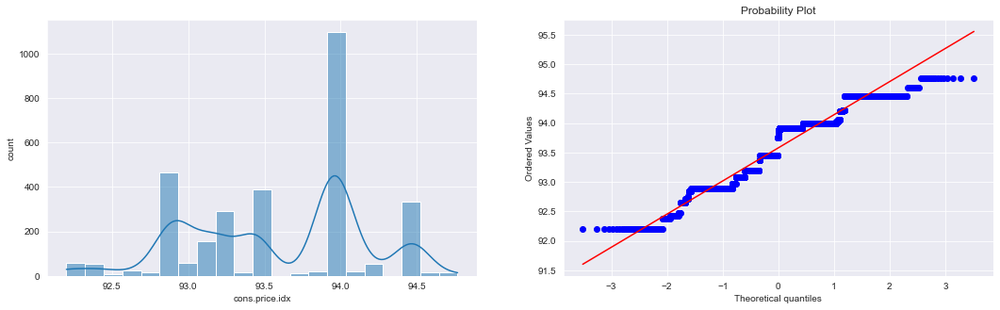

cons.conf.idx
Skew : 0.3
3.122844206672104e-14


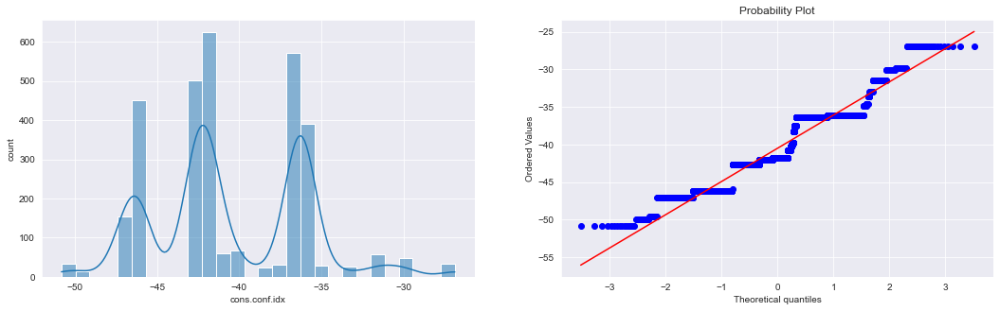

euribor3m
Skew : -0.7
0.0


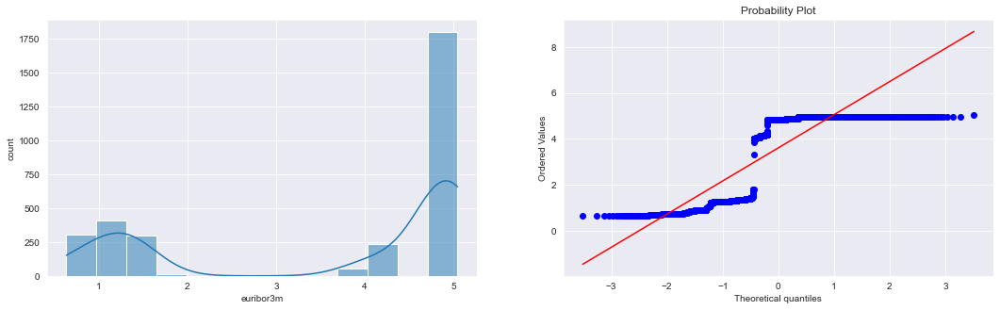

In [42]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    _, p = stat.normaltest(train_df[col].to_numpy())
    print(p)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    stat.probplot(train_df[col],dist='norm',plot=pylab)
    plt.show()

### Observations :

1. From above we can see that 'age' and 'duration' are right skewed.
2. and there is a clear distinction between 'duration' and target out values

In [43]:
train_df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'target'],
      dtype='object')

### Visualizing bivariate/multivariate distributions

Text(0, 0.5, 'No.of people not signedup')

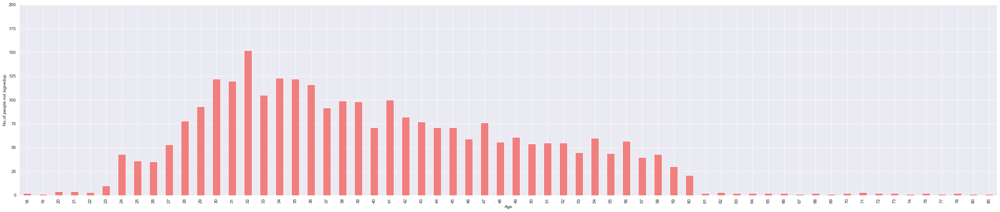

In [44]:
plt.figure(figsize = (40,8))
train_df.loc[train_df['target']==0]['age'].value_counts().sort_index().plot.bar(color = 'lightcoral')

plt.ylim(0, 200)

plt.xlabel('Age')
plt.ylabel('No.of people not signedup')

# Double click on the plot/graph to zoom in

Text(0, 0.5, 'No.of people signedup')

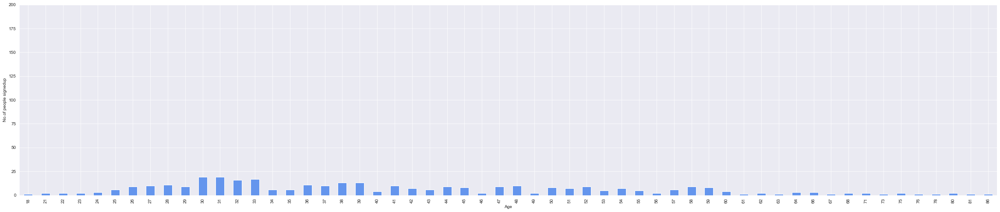

In [45]:
plt.figure(figsize = (40,8))
train_df.loc[train_df['target']==1]['age'].value_counts().sort_index().plot.bar(color = 'cornflowerblue')

plt.ylim(0, 200)

plt.xlabel('Age')
plt.ylabel('No.of people signedup')

# Double click on the plot/graph to zoom in

In [46]:
# From above we cannot clearly find any patterns with Age vs Outcome 
# but one thing is clear that young people are more intrested in term deposit (25-35)

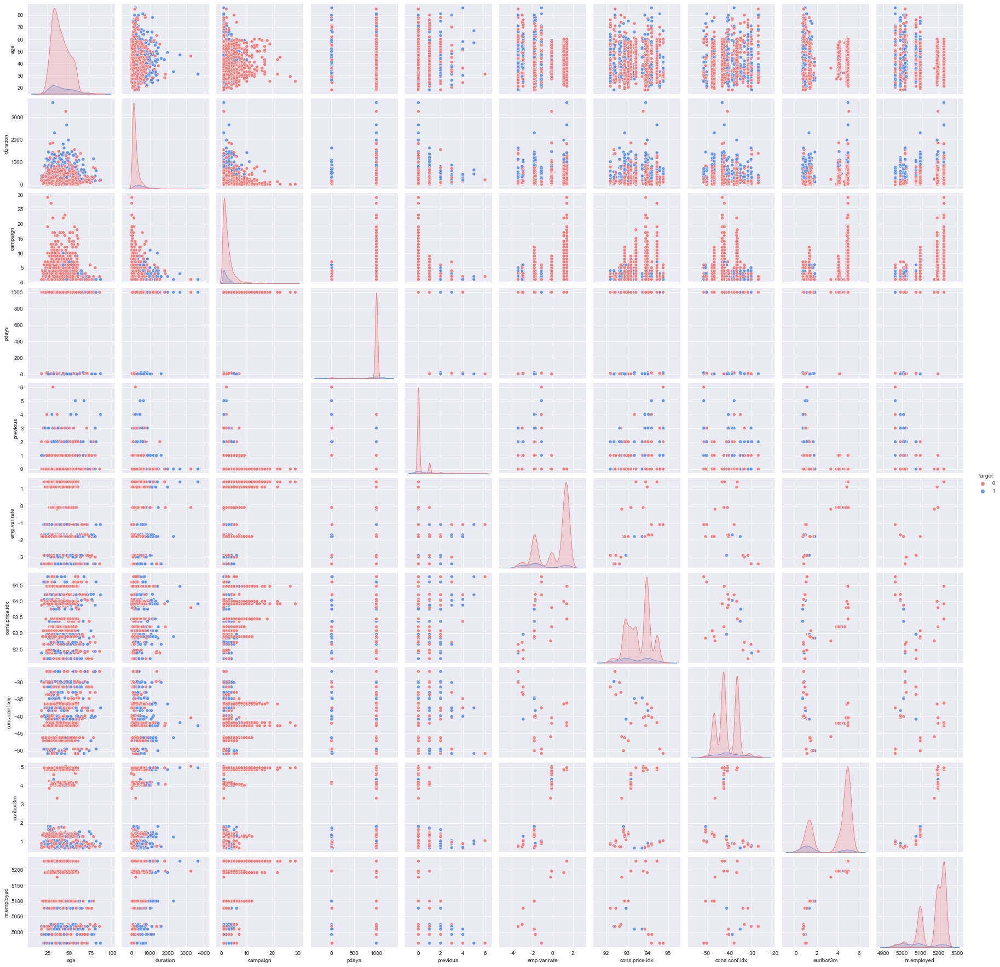

In [47]:
sns.pairplot(train_df, hue='target',palette=['lightcoral','cornflowerblue'])

# Its not clear to observe graphs closely we will plot indvidual plots for some features

In [48]:
continuous_features

['age', 'duration', 'cons.price.idx', 'cons.conf.idx', 'euribor3m']

age


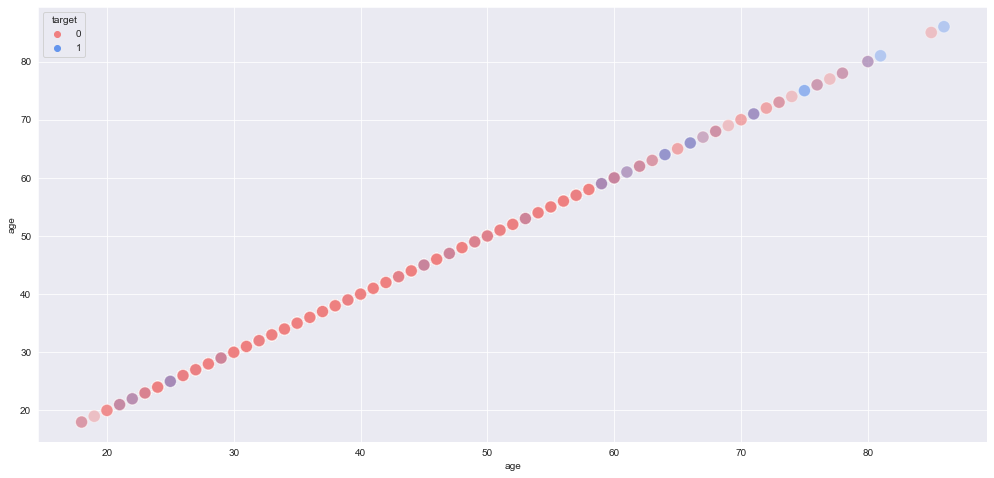

duration


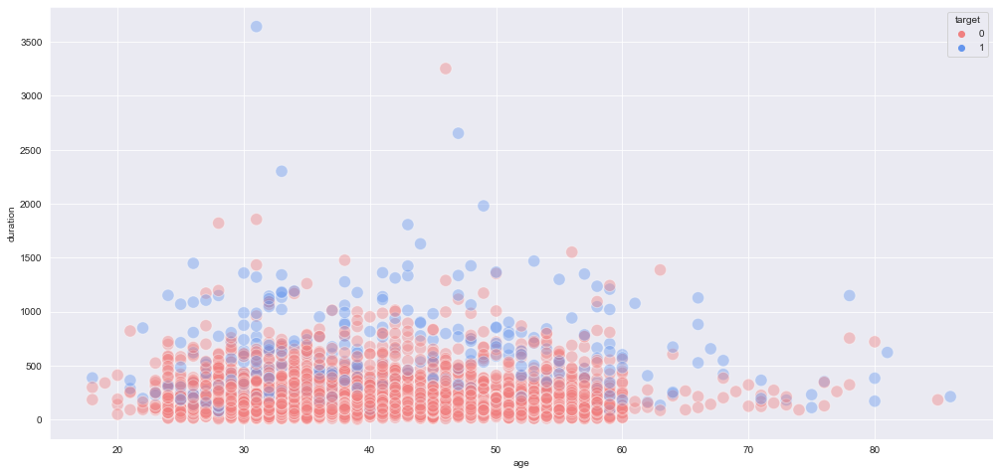

cons.price.idx


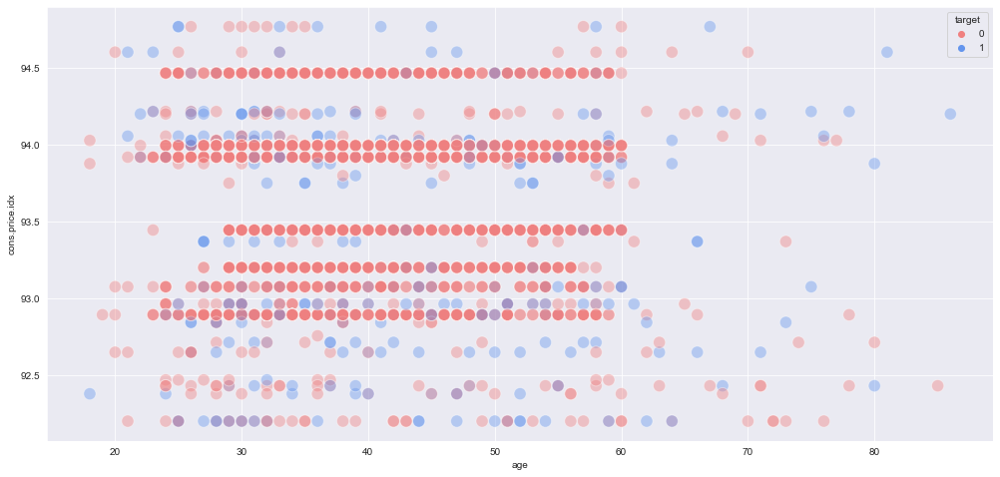

cons.conf.idx


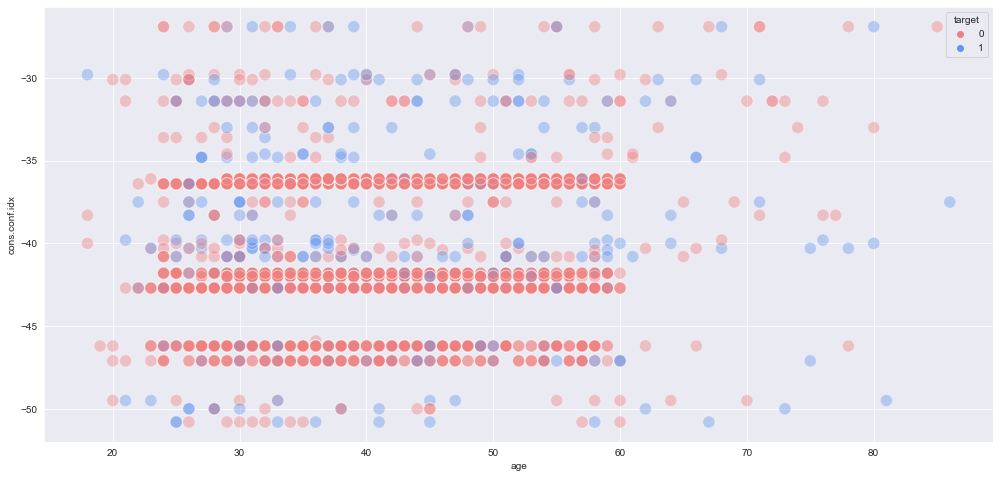

euribor3m


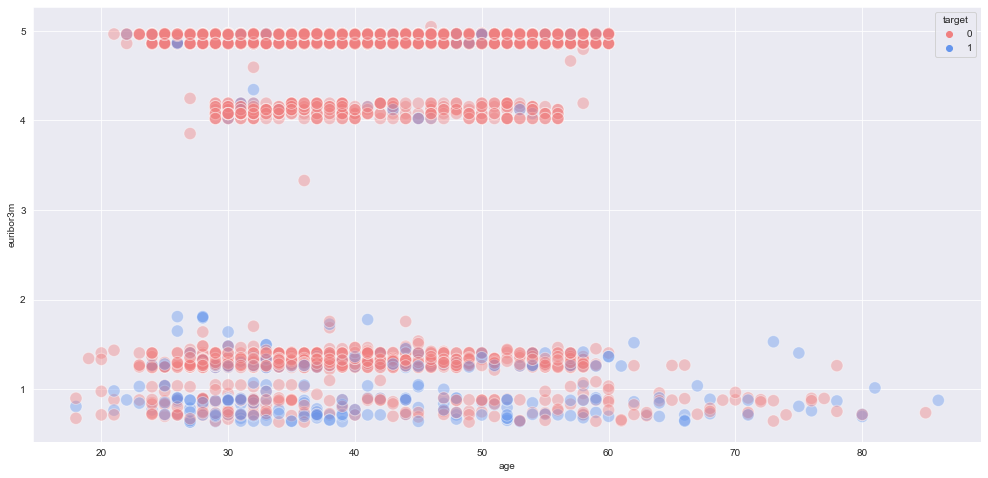

In [49]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='age',y=col,hue='target',palette=['lightcoral','cornflowerblue'],alpha=0.4,s=150)
    plt.xlabel('age')
    plt.ylabel(col)
    plt.show()

age


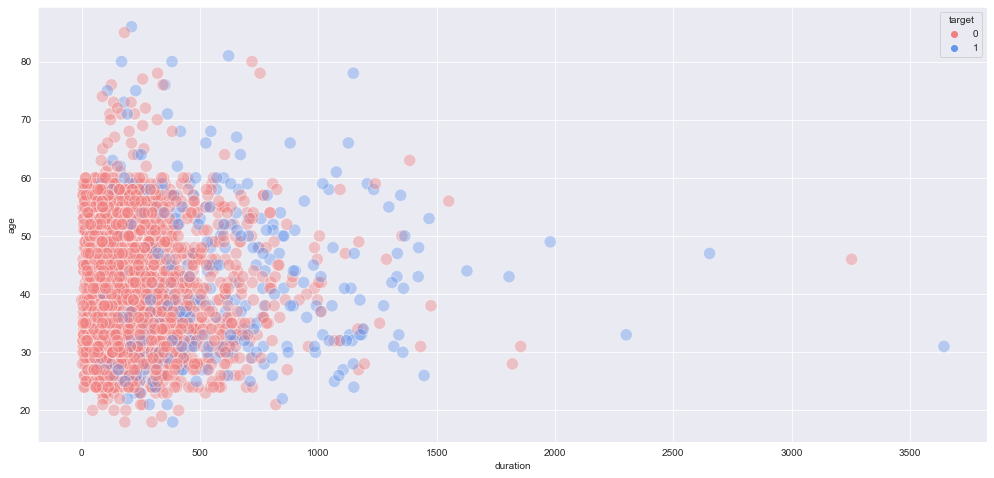

duration


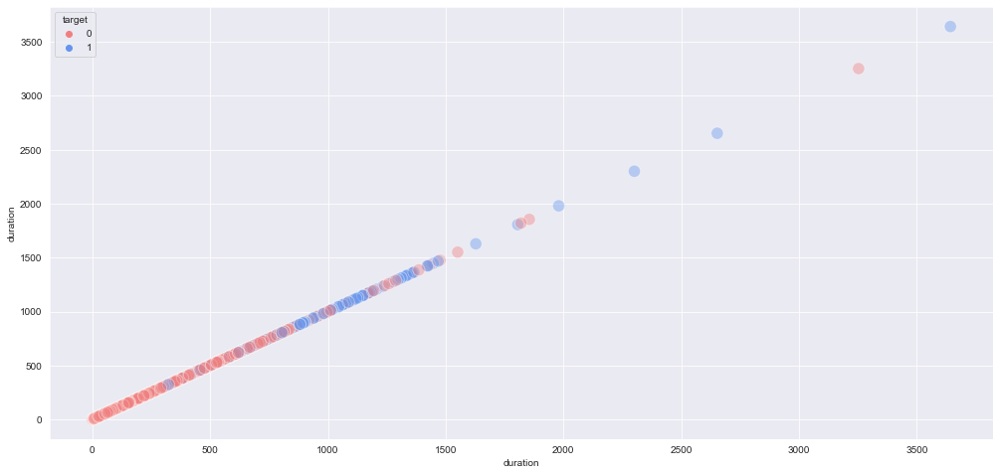

cons.price.idx


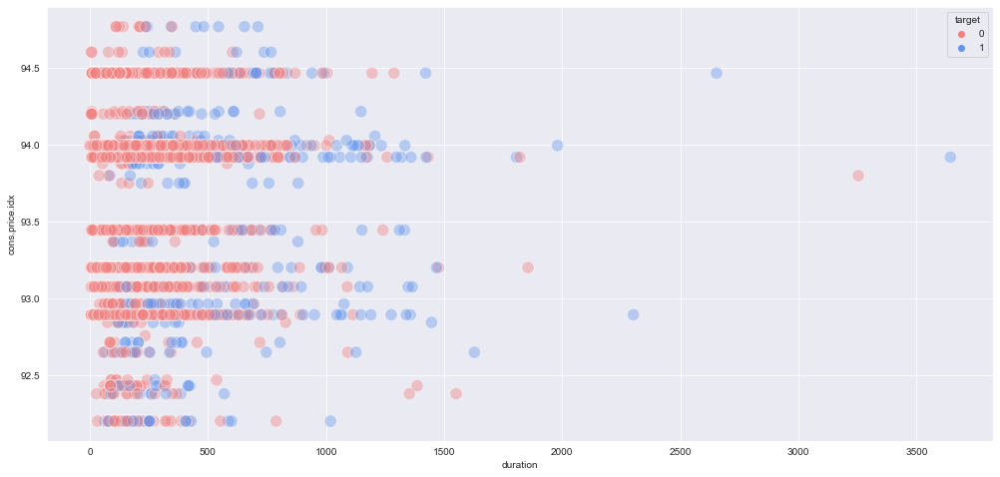

cons.conf.idx


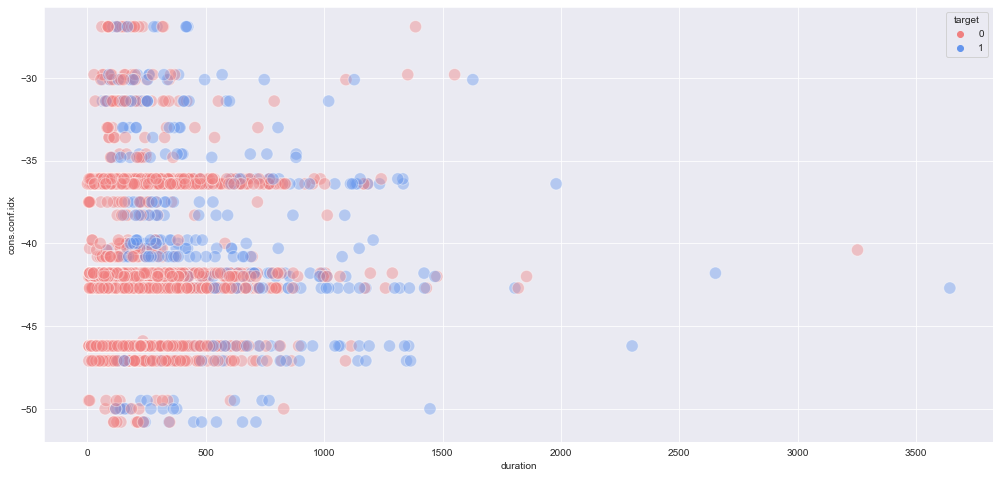

euribor3m


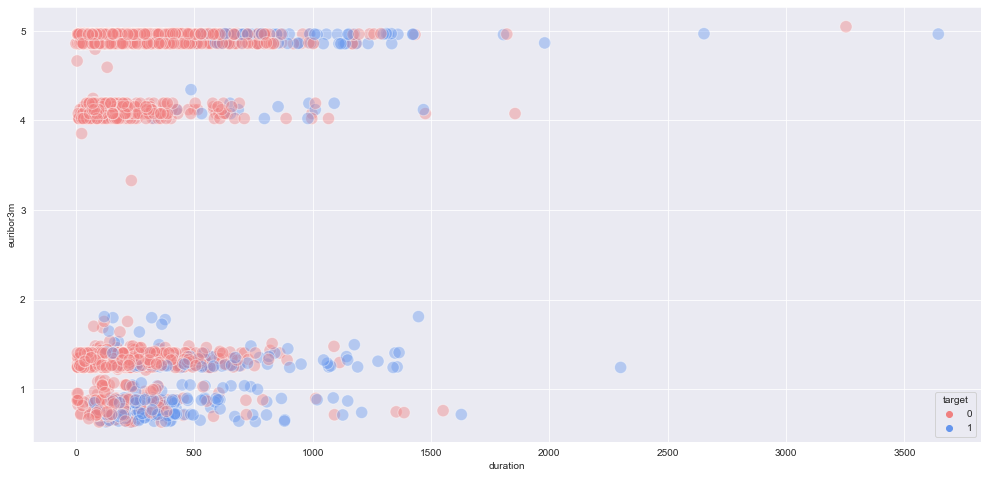

In [50]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='duration',y=col,hue='target',palette=['lightcoral','cornflowerblue'],alpha=0.4,s=150)
    plt.xlabel('duration')
    plt.ylabel(col)
    plt.show()

age


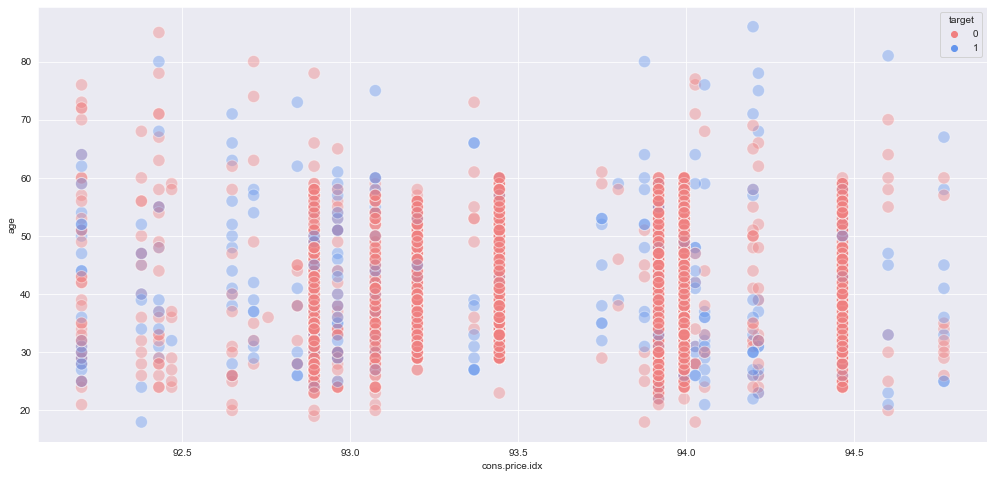

duration


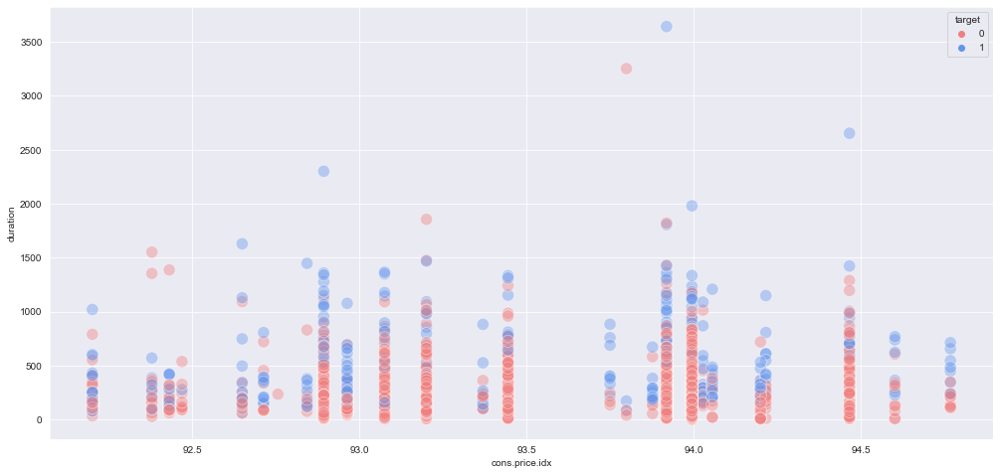

cons.price.idx


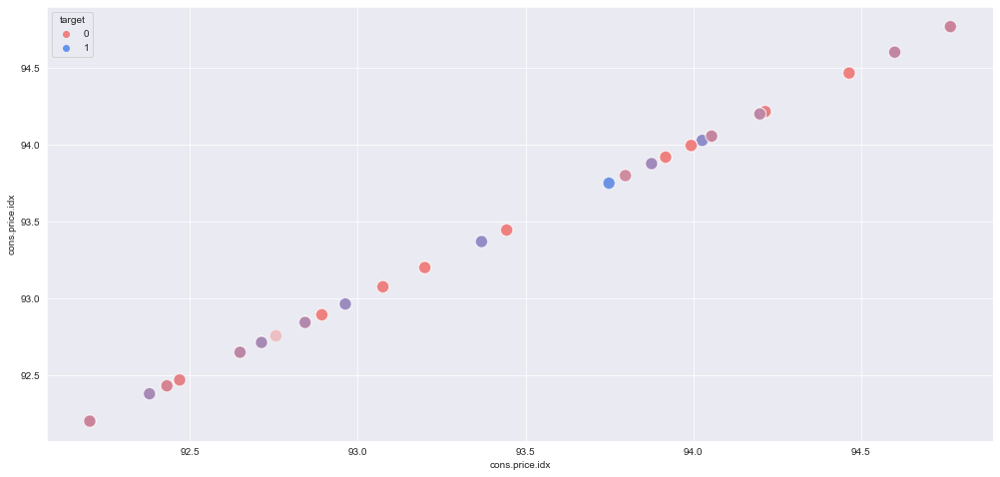

cons.conf.idx


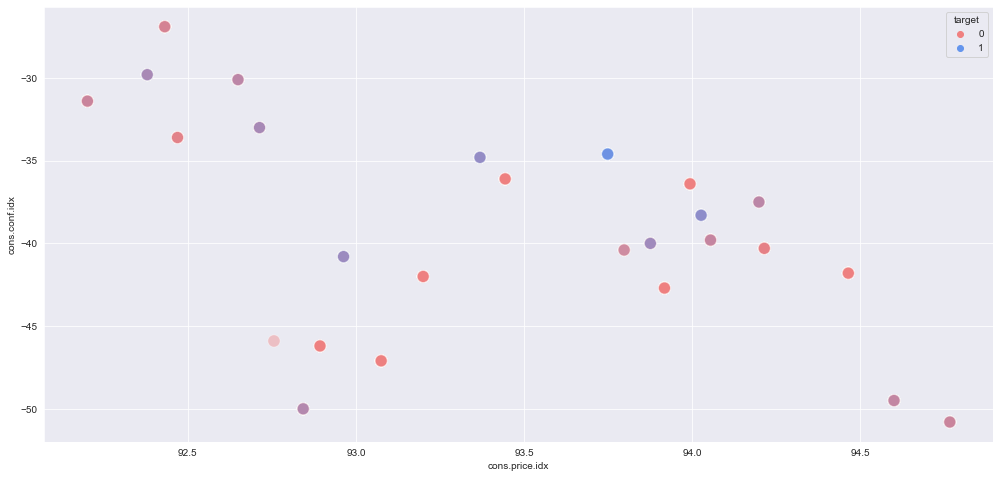

euribor3m


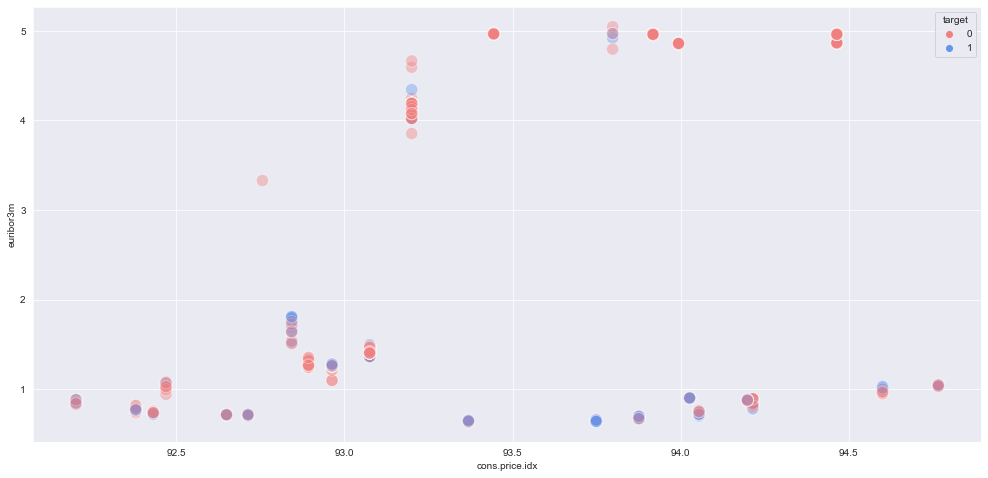

In [51]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='cons.price.idx',y=col,hue='target',palette=['lightcoral','cornflowerblue'],alpha=0.4,s=150)
    plt.xlabel('cons.price.idx')
    plt.ylabel(col)
    plt.show()

age


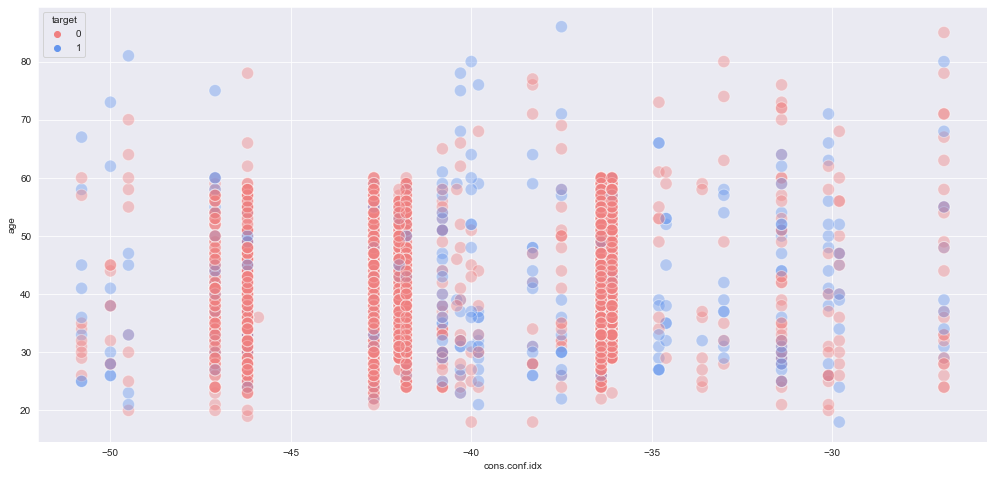

duration


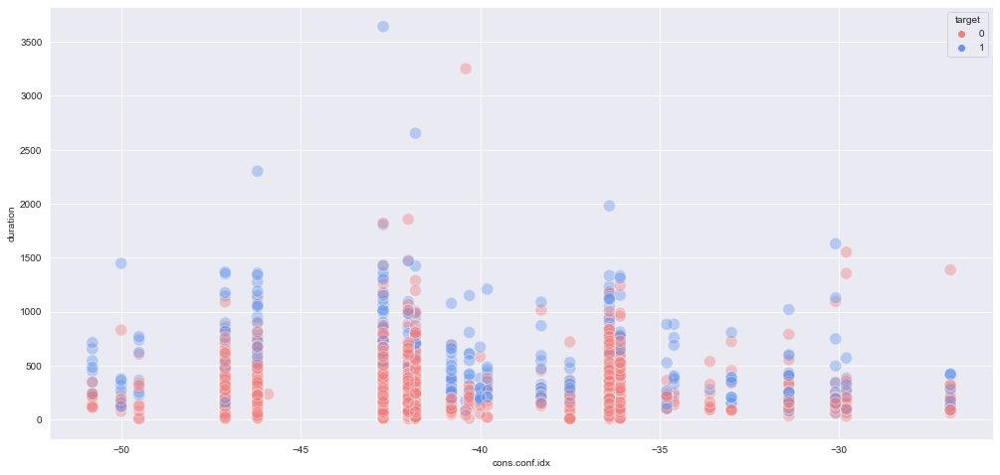

cons.price.idx


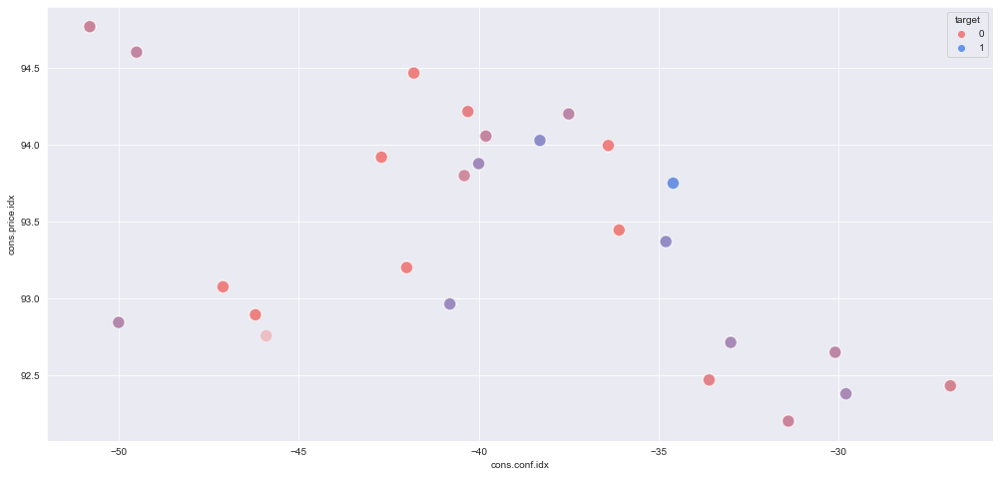

cons.conf.idx


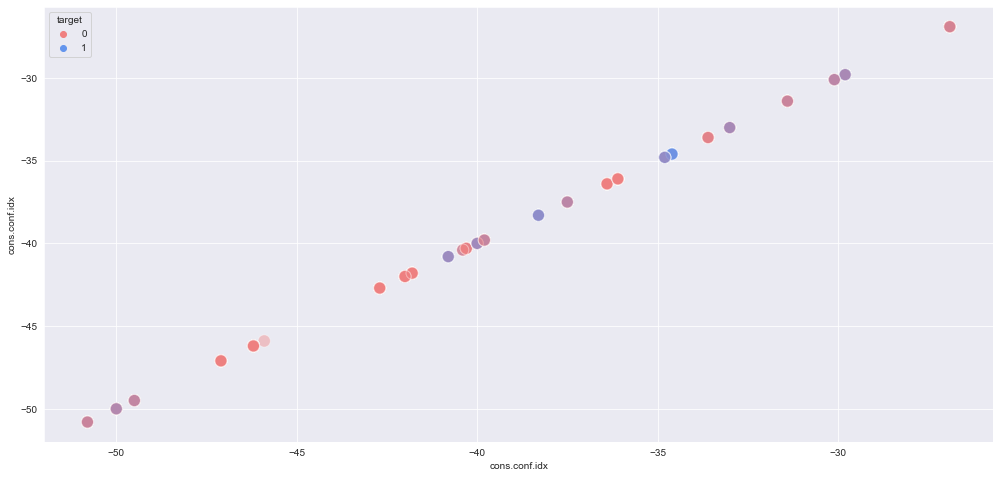

euribor3m


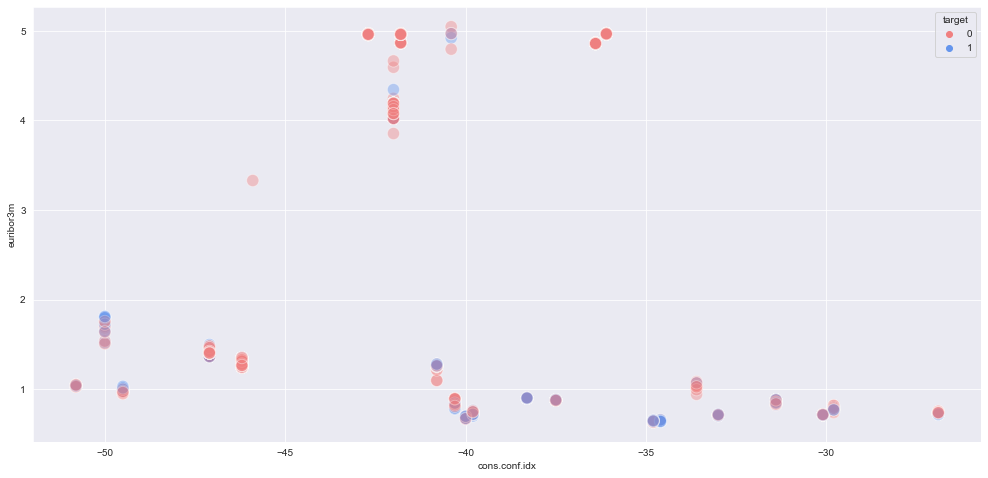

In [52]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='cons.conf.idx',y=col,hue='target',palette=['lightcoral','cornflowerblue'],alpha=0.4,s=150)
    plt.xlabel('cons.conf.idx')
    plt.ylabel(col)
    plt.show()

age


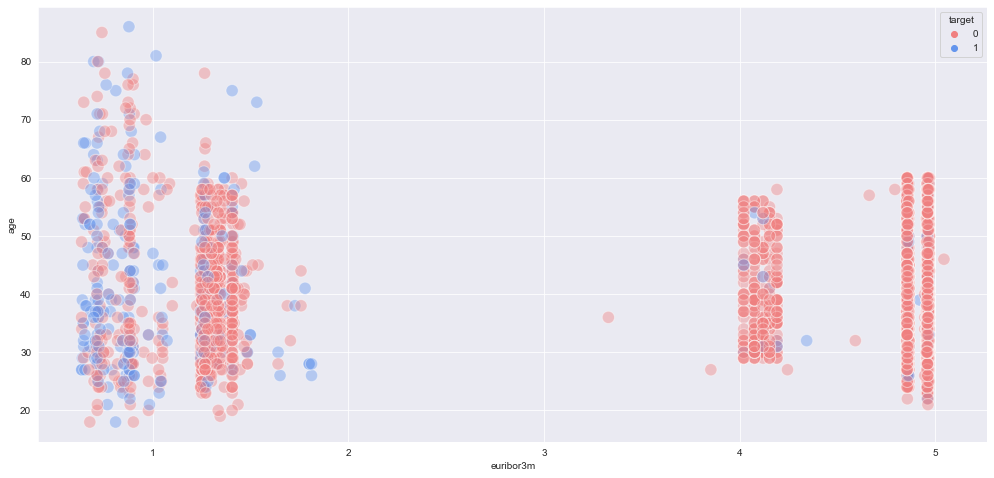

duration


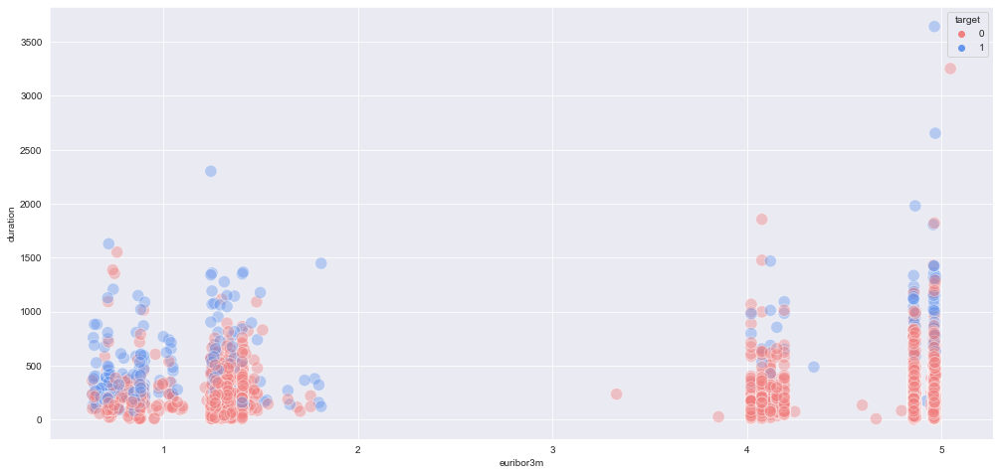

cons.price.idx


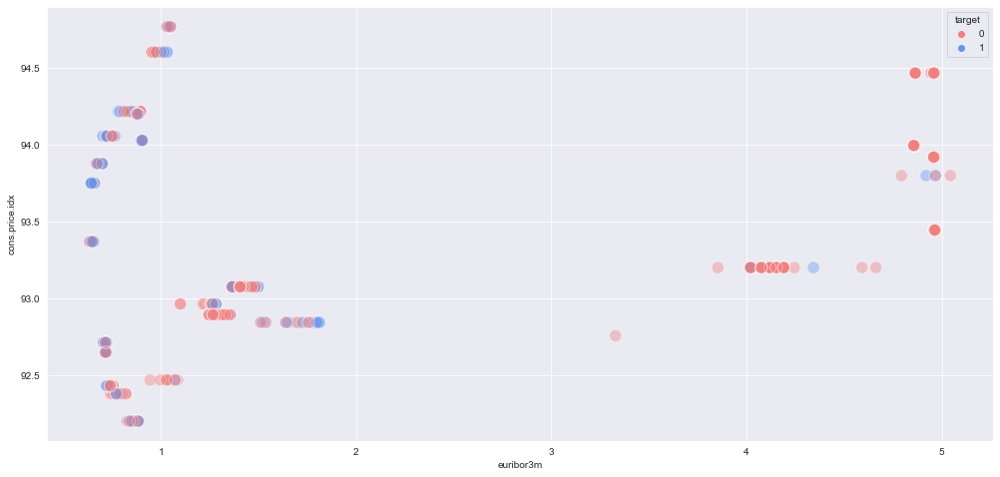

cons.conf.idx


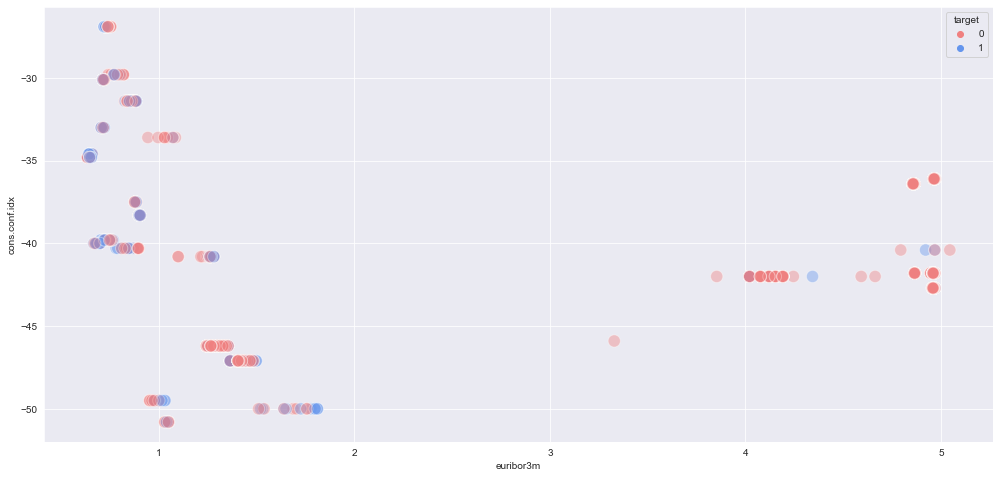

euribor3m


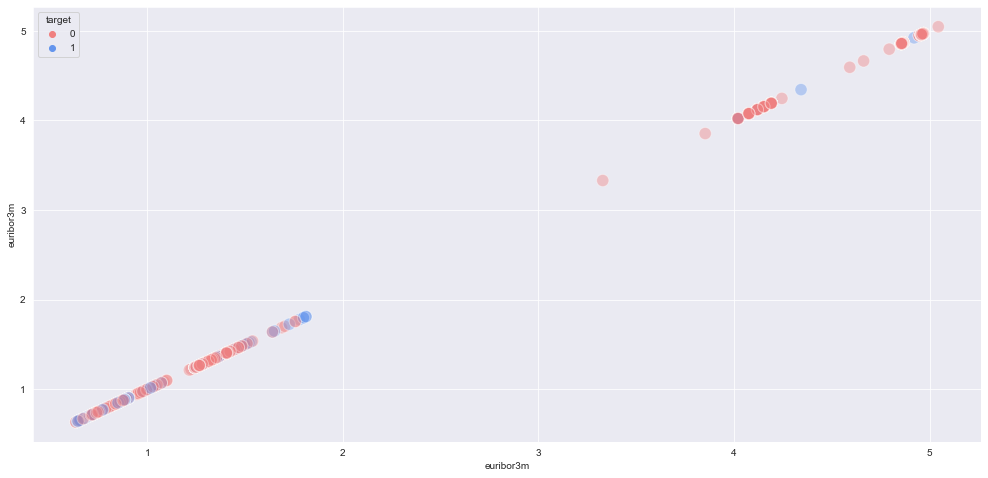

In [53]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='euribor3m',y=col,hue='target',palette=['lightcoral','cornflowerblue'],alpha=0.4,s=150)
    plt.xlabel('euribor3m')
    plt.ylabel(col)
    plt.show()

In [54]:
train_df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'target'],
      dtype='object')

In [55]:
fig = px.scatter_3d(train_df, x="age", y="euribor3m", z="duration", color="target")
fig.show()

### Discrete_features

### Univariate/Bivariate analysis

In [56]:
train_df[discrete_features].nunique().sort_values(ascending=False)

campaign        23
pdays           20
nr.employed     11
emp.var.rate    10
previous         7
target           2
dtype: int64

In [57]:
discrete_features

['campaign', 'pdays', 'previous', 'emp.var.rate', 'nr.employed', 'target']

In [58]:
discrete_features = ['campaign', 'pdays', 'previous', 'emp.var.rate', 'nr.employed']

discrete_features

['campaign', 'pdays', 'previous', 'emp.var.rate', 'nr.employed']

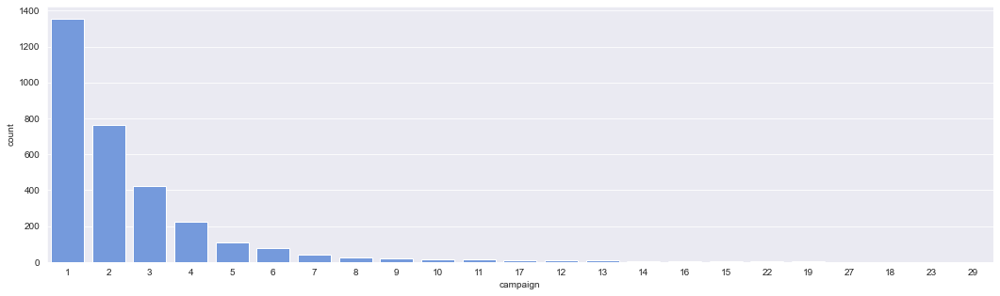

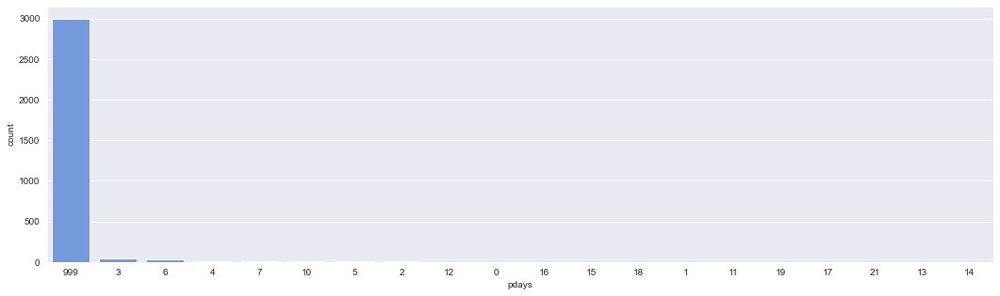

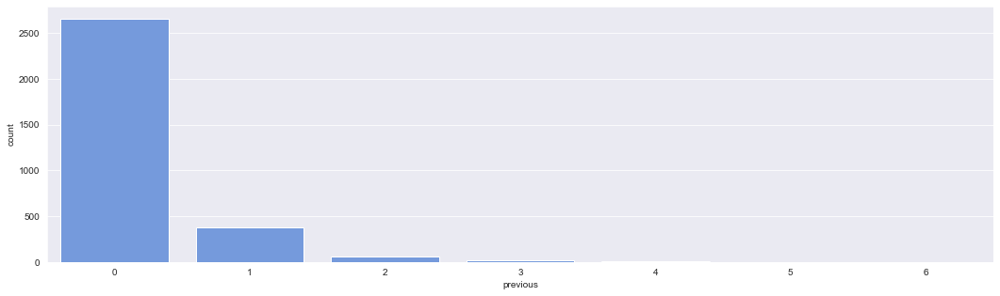

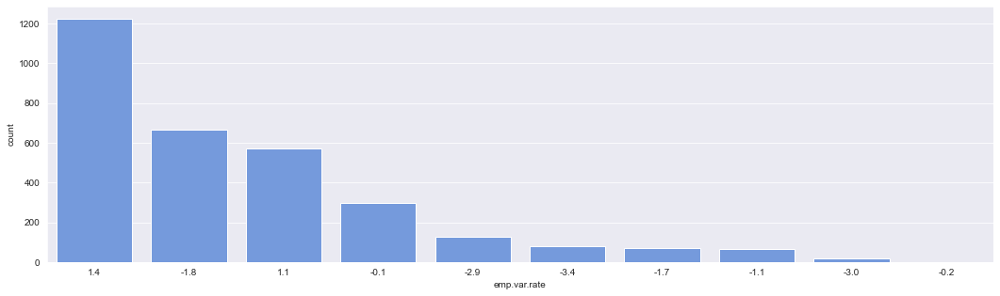

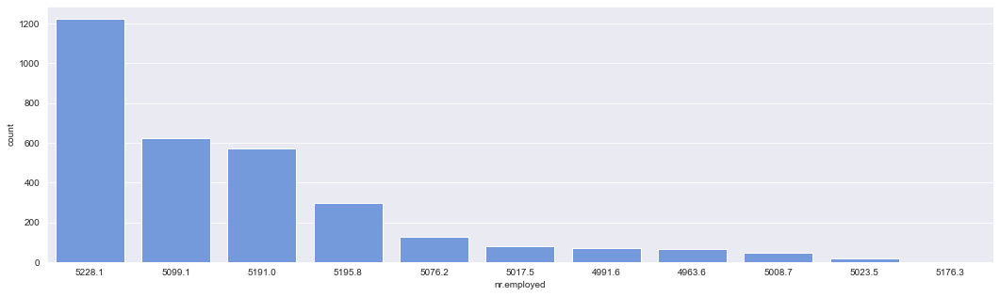

In [59]:
for col in discrete_features:
    plt.figure(figsize = (18,5))
    sns.countplot(data=train_df, x=col,color='cornflowerblue',order=train_df[col].value_counts().index)

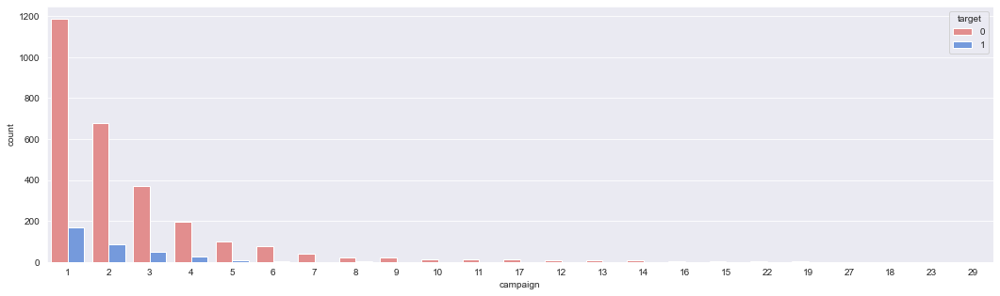

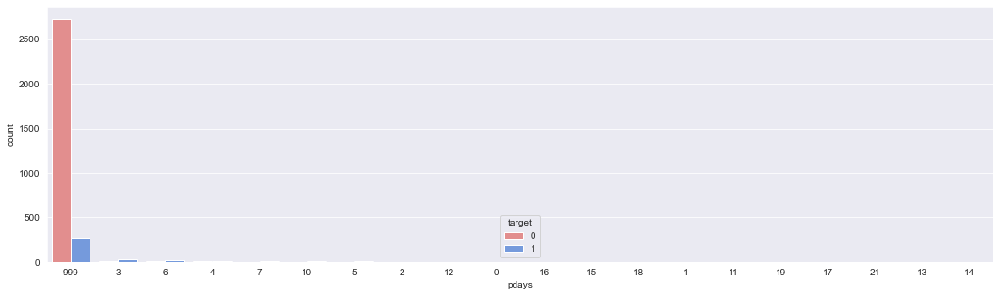

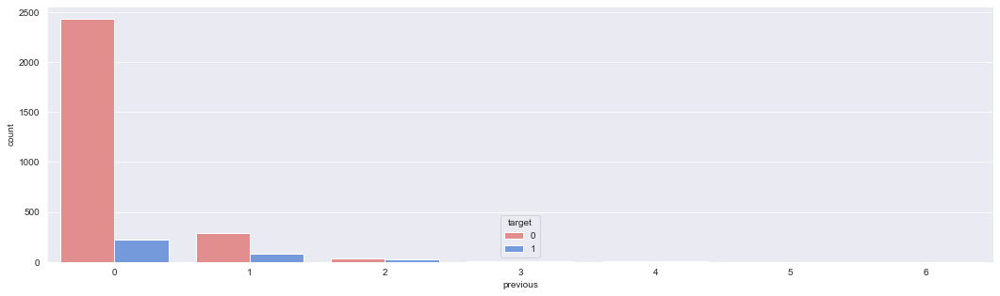

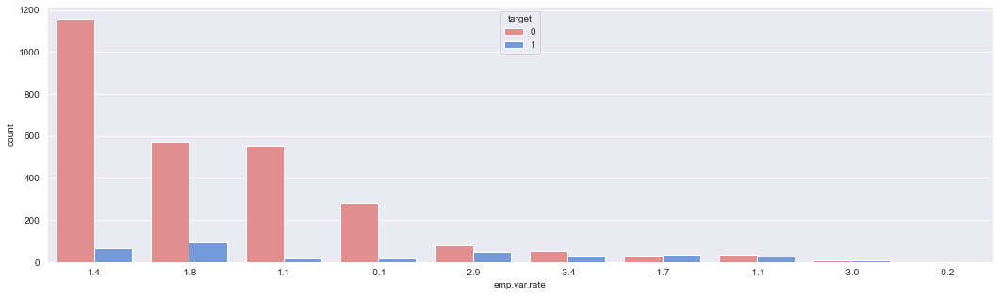

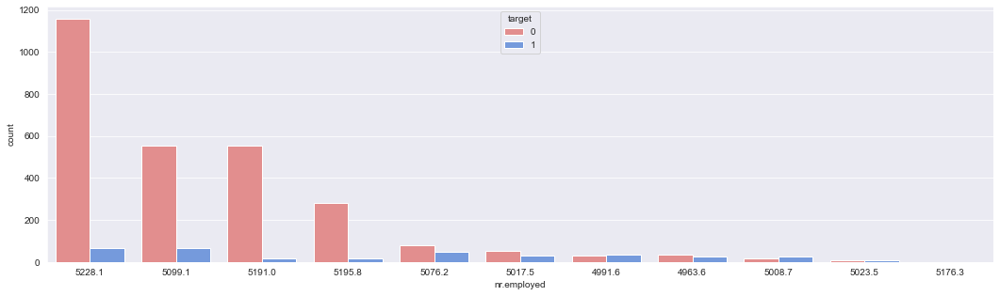

In [60]:
for col in discrete_features:
    plt.figure(figsize = (18,5))
    sns.countplot(data=train_df, x=col, hue="target",palette=['lightcoral','cornflowerblue'],order=train_df[col].value_counts().index)

campaign


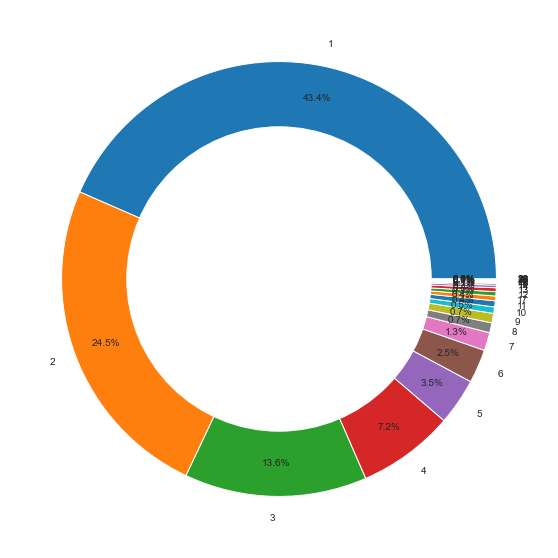

pdays


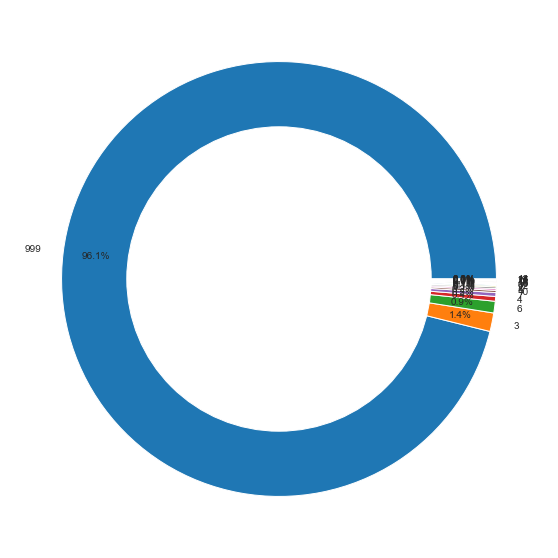

In [61]:
for col in ['campaign', 'pdays']:
    print(col)
    plt.figure(figsize = (18,10))
    
    plt.pie(train_df[col].value_counts().values, labels=train_df[col].value_counts().index,
        autopct='%1.1f%%', pctdistance=0.85)
    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.show()

nr.employed


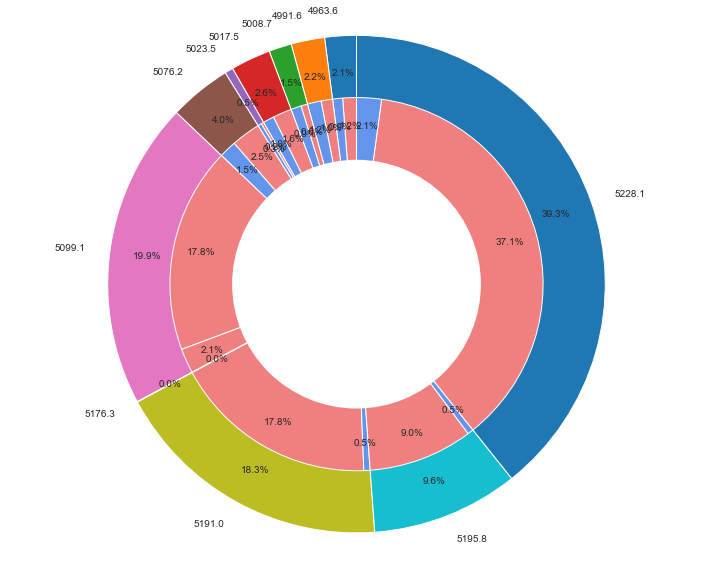

In [62]:
print('nr.employed')
labels = train_df['nr.employed'].value_counts().sort_index().index
sizes = train_df['nr.employed'].value_counts().sort_index().values
#labels_gender = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
sizes_gender = train_df.groupby(['nr.employed','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

emp.var.rate


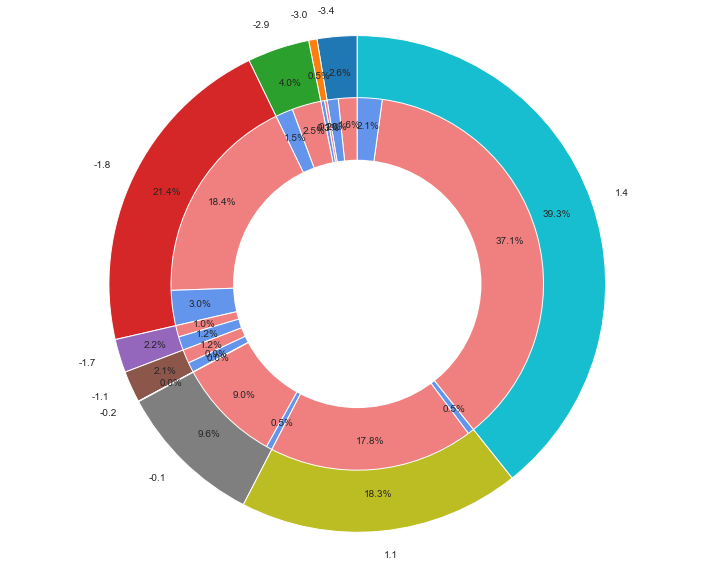

In [63]:
print('emp.var.rate')
labels = train_df['emp.var.rate'].value_counts().sort_index().index
sizes = train_df['emp.var.rate'].value_counts().sort_index().values
#labels_gender = [0,1,0,1,0,1,0,1]
sizes_gender = train_df.groupby(['emp.var.rate','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

previous


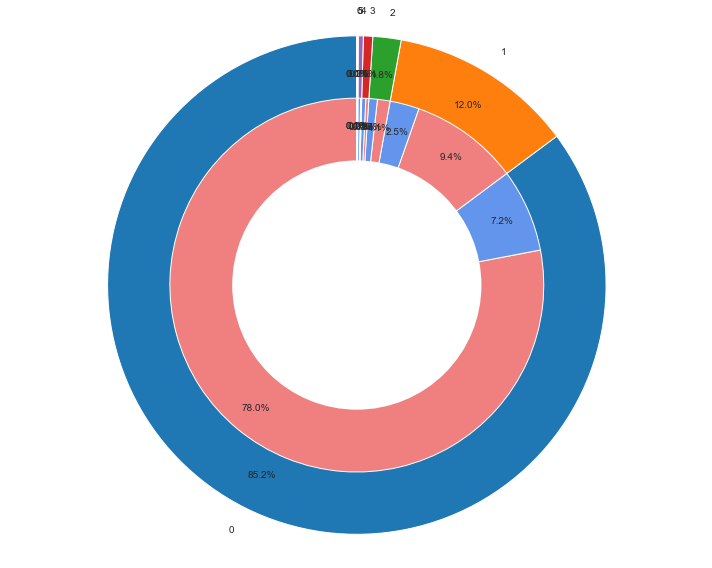

In [64]:
print('previous')
labels = train_df['previous'].value_counts().sort_index().index
sizes = train_df['previous'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['previous','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

In [65]:
discrete_features

['campaign', 'pdays', 'previous', 'emp.var.rate', 'nr.employed']

campaign


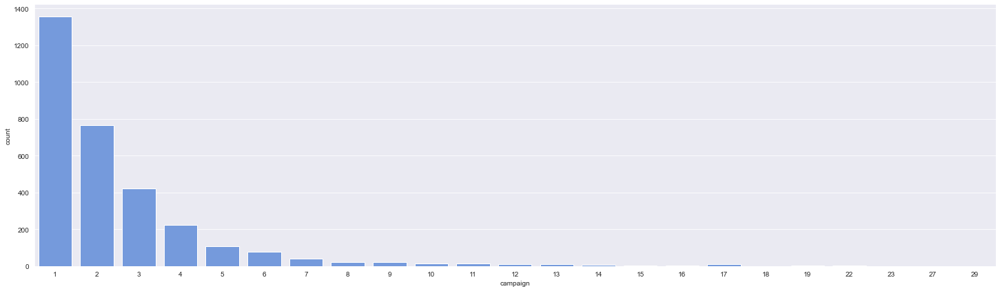

pdays


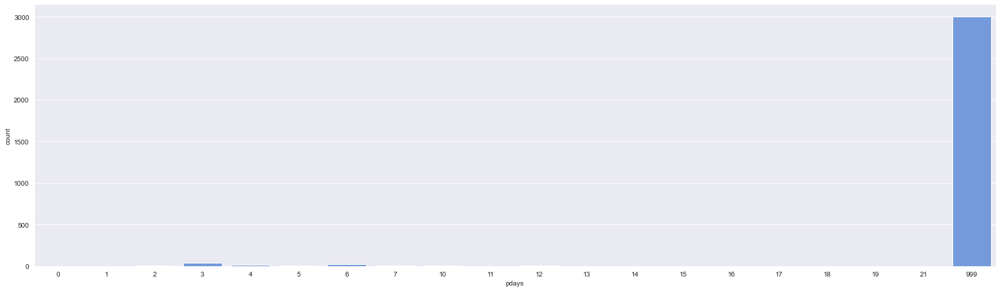

previous


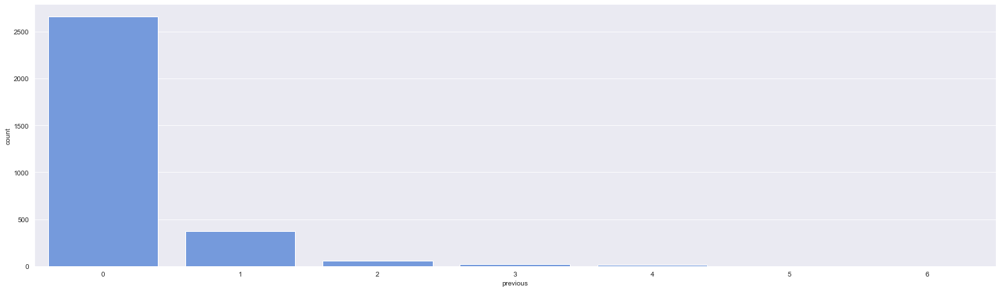

emp.var.rate


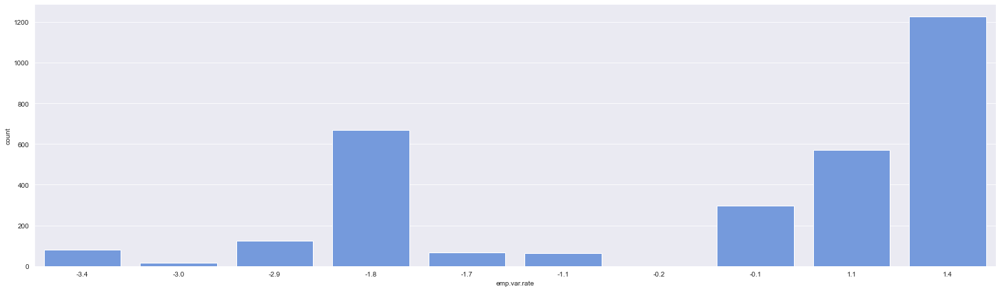

nr.employed


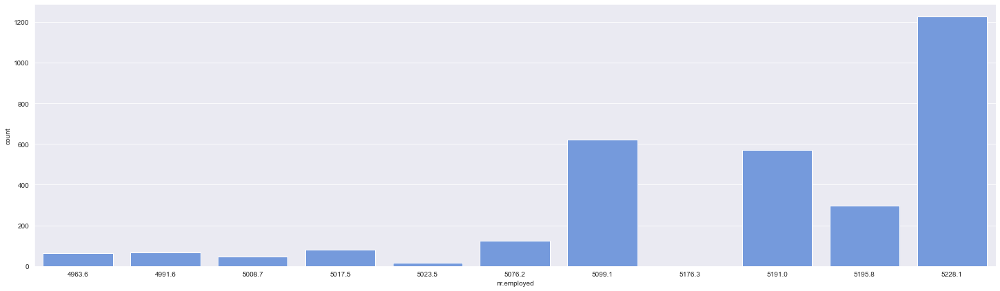

In [66]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (25,7))
    plt.xlabel(col)
    plt.ylabel('count')
    sns.countplot(data=train_df, x=col,color='cornflowerblue')
    plt.show()

campaign


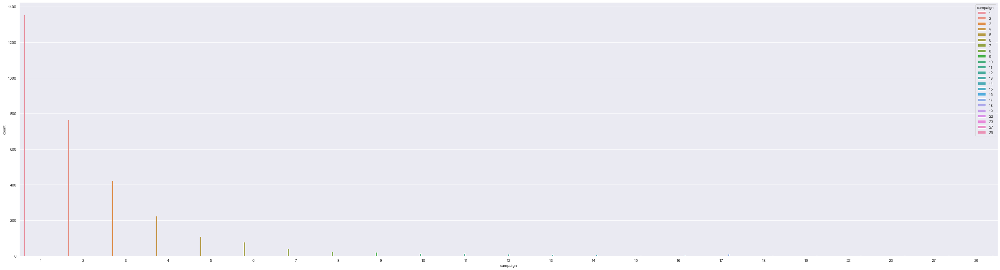

pdays


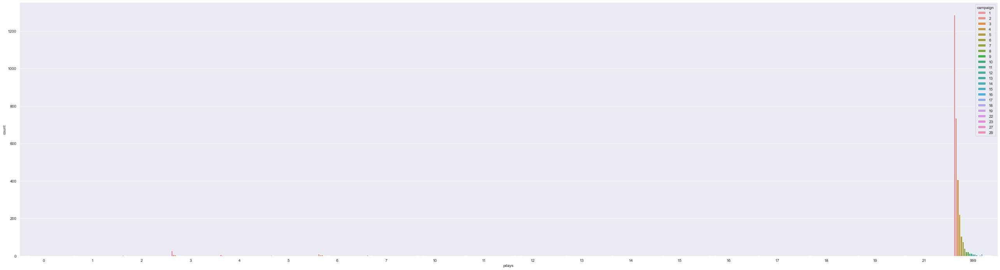

previous


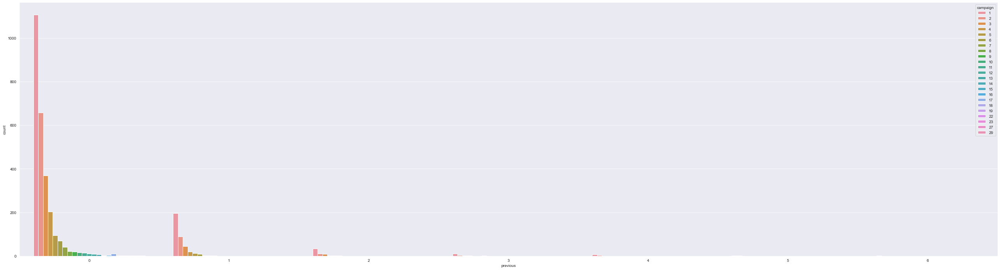

emp.var.rate


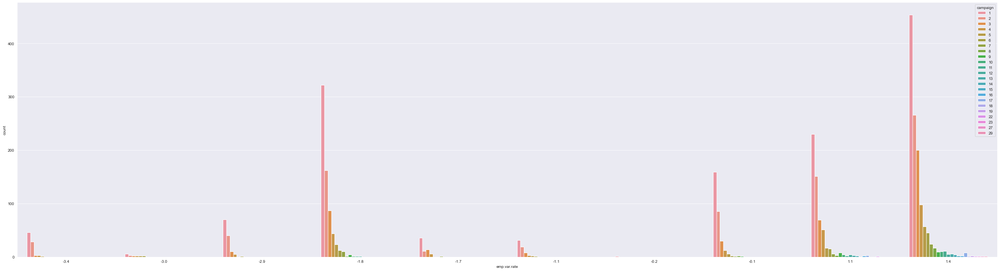

nr.employed


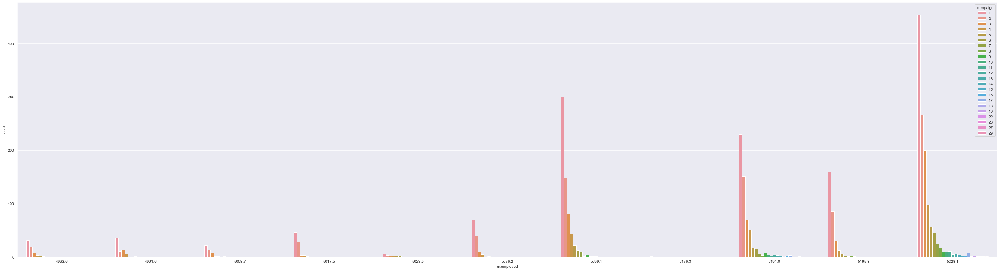

In [67]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (45,12))
    plt.xlabel(col)
    plt.ylabel('count')
    sns.countplot(data=train_df, x=col, hue="campaign")
    plt.show()

campaign


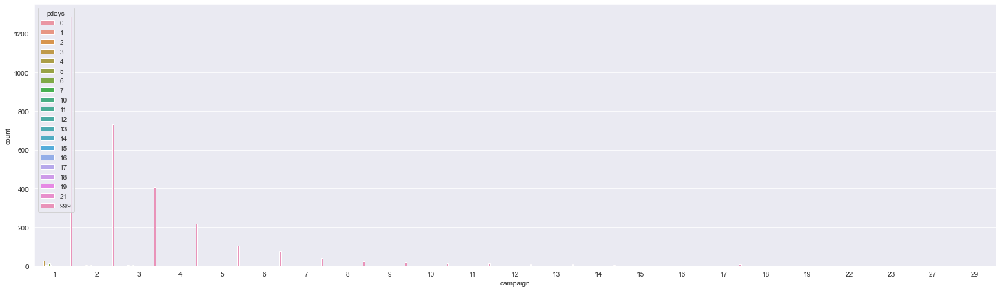

pdays


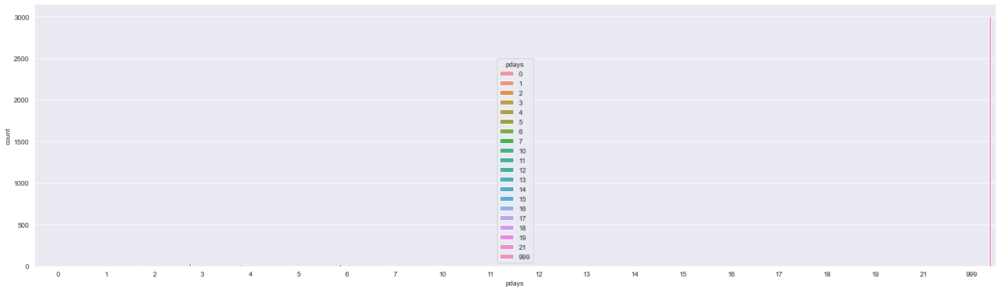

previous


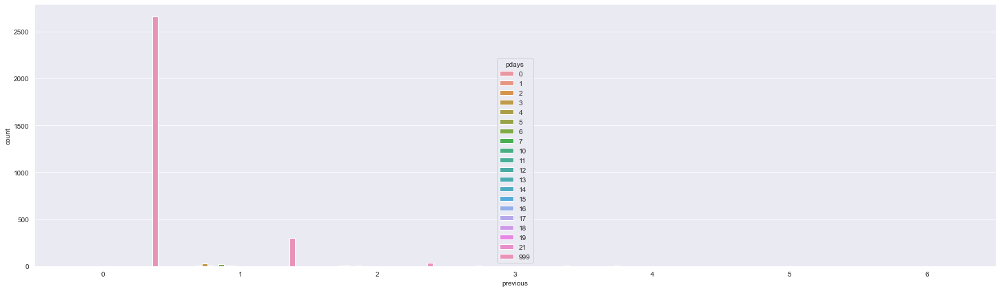

emp.var.rate


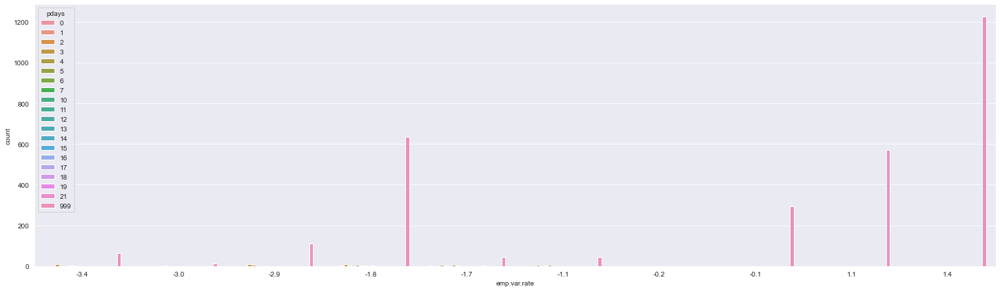

nr.employed


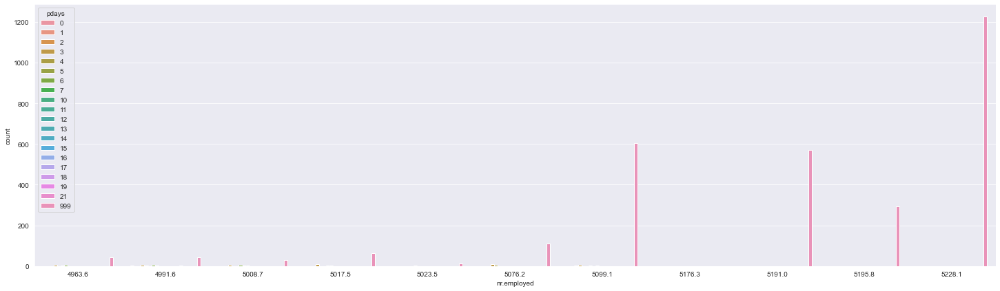

In [68]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (25,7))
    plt.xlabel(col)
    plt.ylabel('count')
    sns.countplot(data=train_df, x=col, hue="pdays")
    plt.show()

campaign


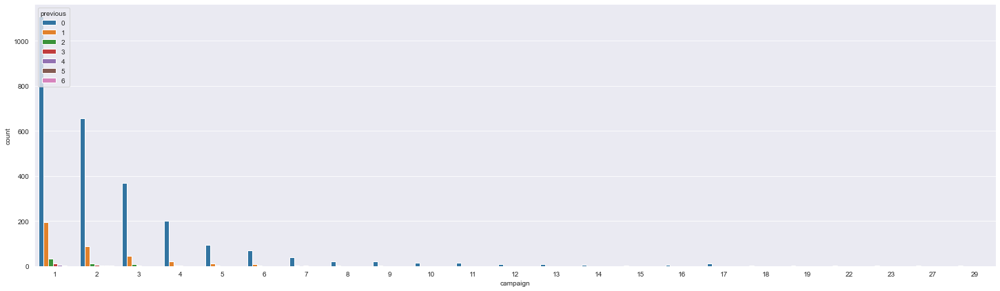

pdays


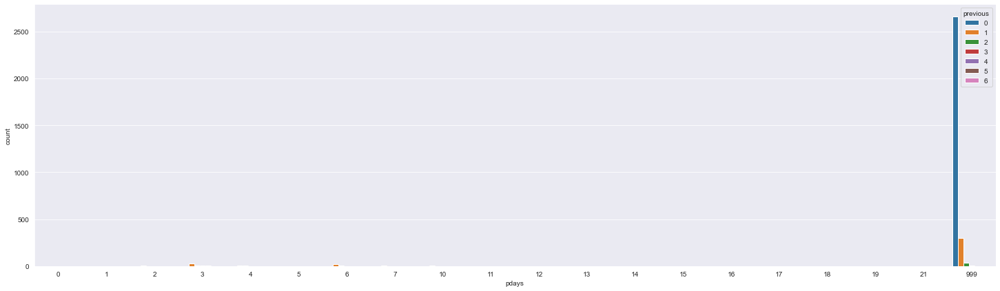

previous


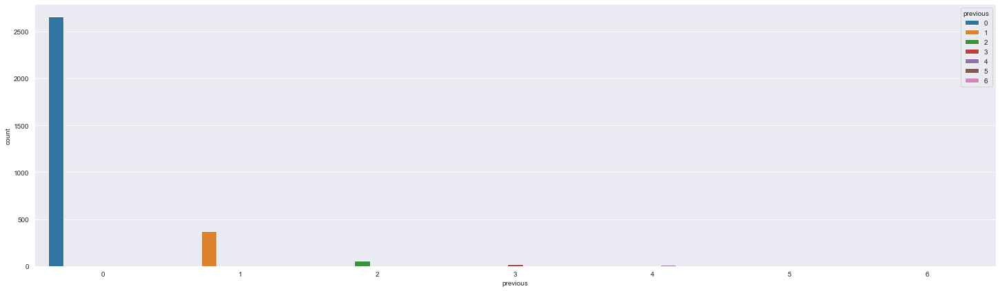

emp.var.rate


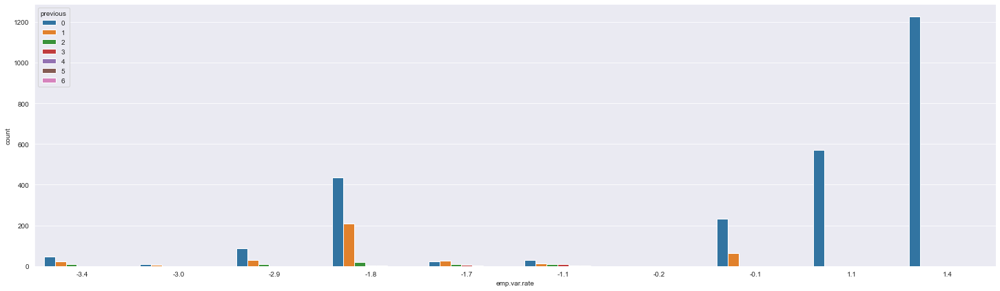

nr.employed


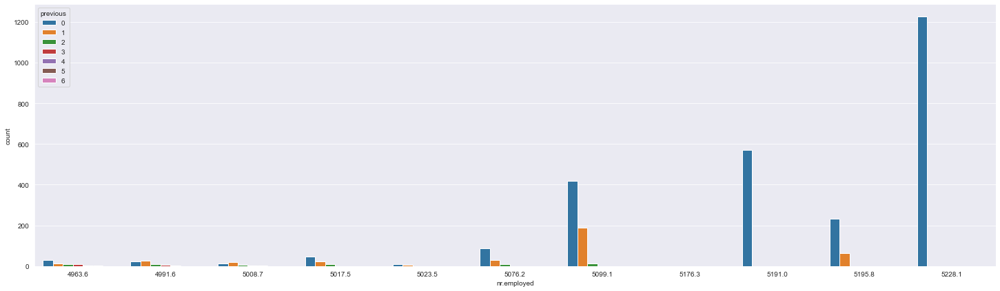

In [69]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (25,7))
    plt.xlabel(col)
    plt.ylabel('count')
    sns.countplot(data=train_df, x=col, hue="previous")
    plt.show()

campaign


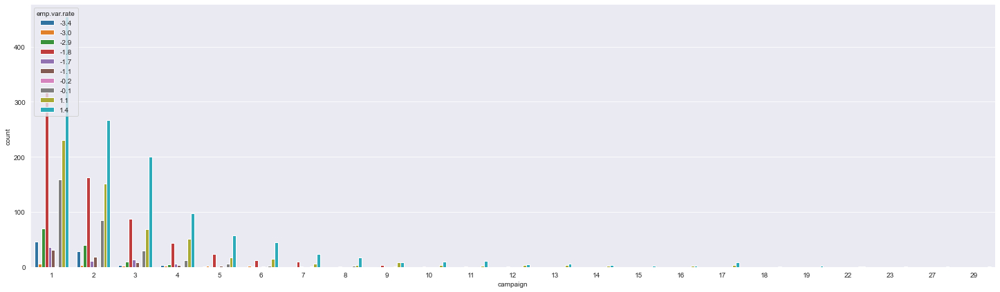

pdays


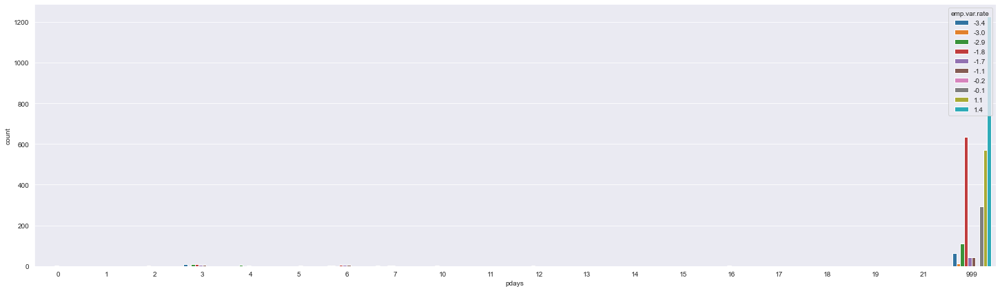

previous


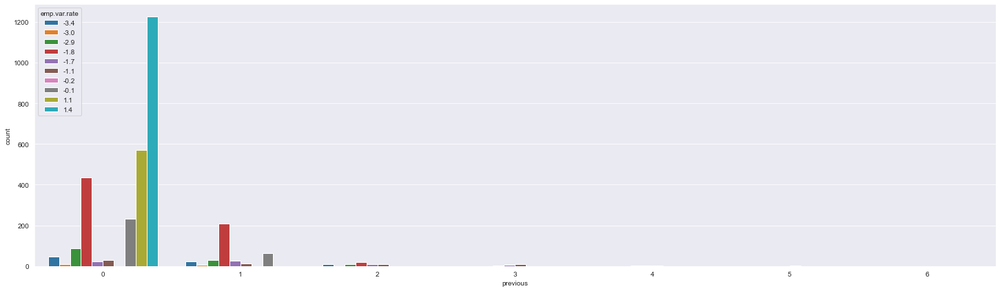

emp.var.rate


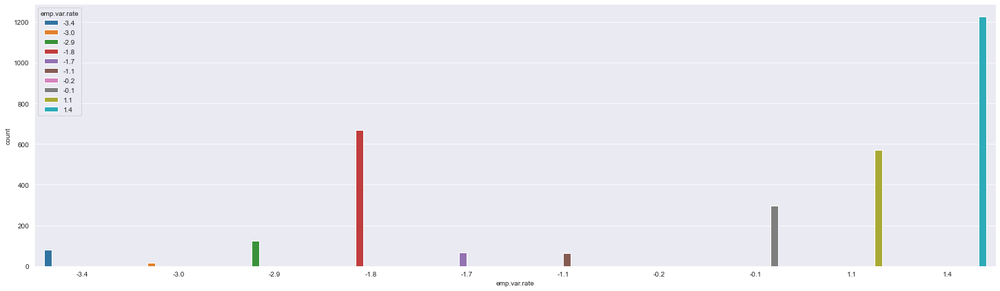

nr.employed


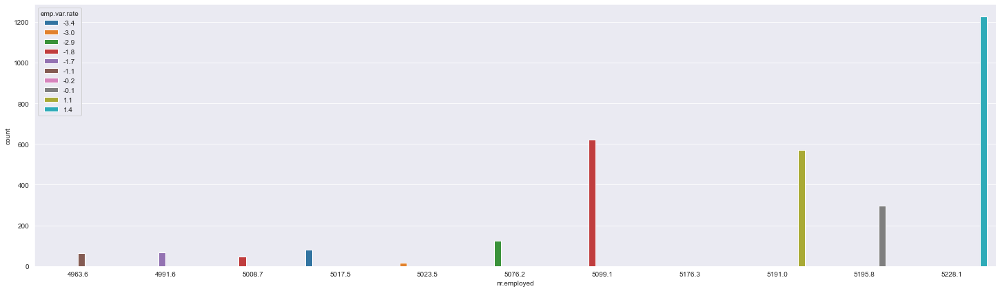

In [70]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (25,7))
    plt.xlabel(col)
    plt.ylabel('count')
    sns.countplot(data=train_df, x=col, hue="emp.var.rate")
    plt.show()

campaign


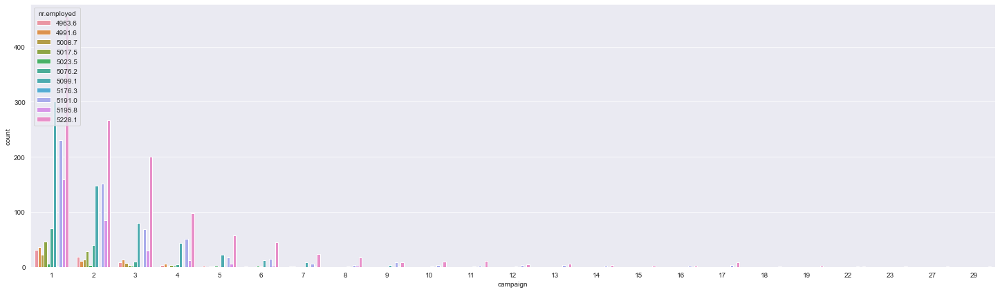

pdays


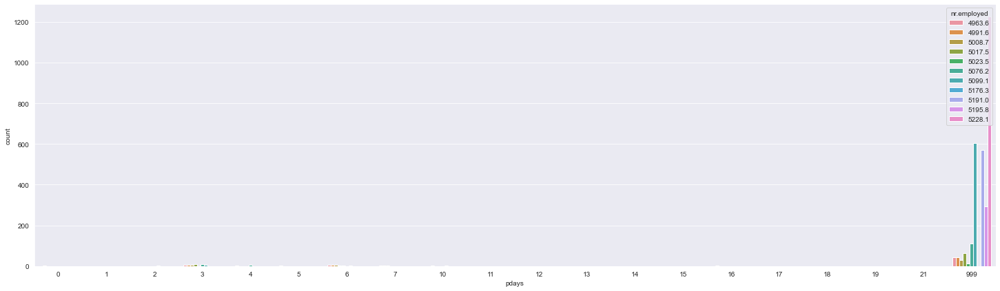

previous


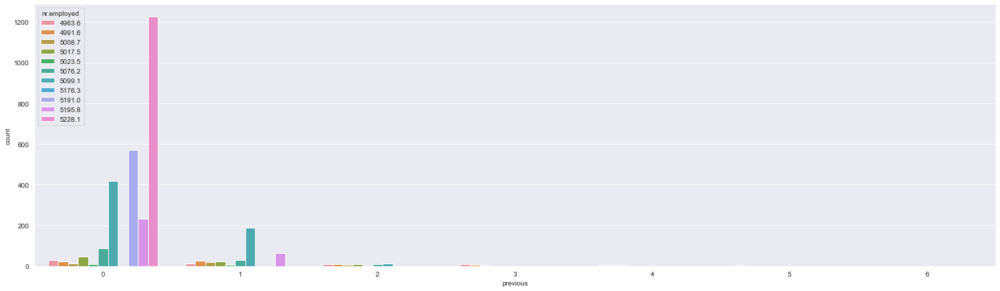

emp.var.rate


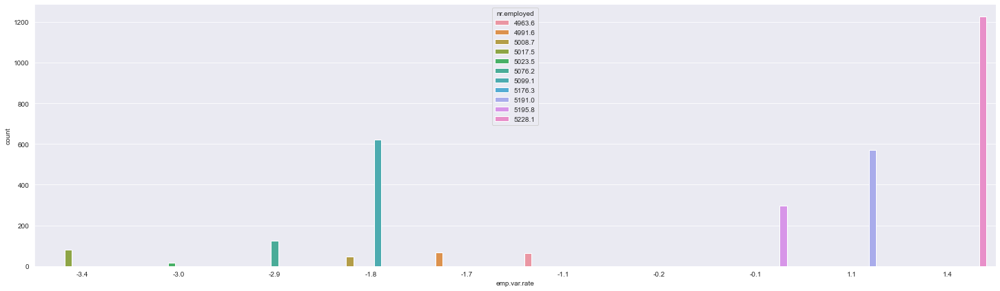

nr.employed


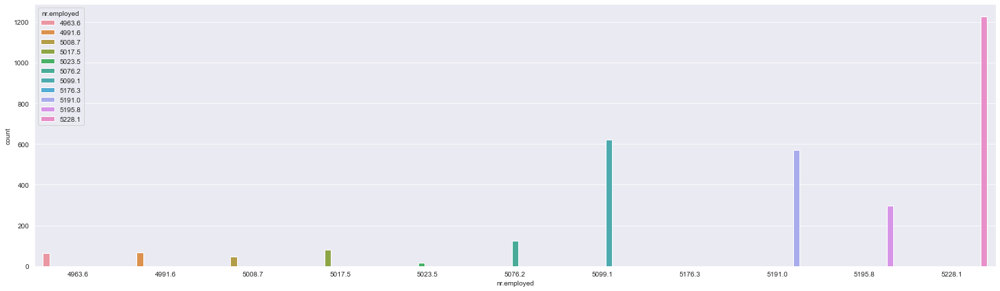

In [71]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (25,7))
    plt.xlabel(col)
    plt.ylabel('count')
    sns.countplot(data=train_df, x=col, hue="nr.employed")
    plt.show()

In [72]:
continuous_features

['age', 'duration', 'cons.price.idx', 'cons.conf.idx', 'euribor3m']

In [73]:
discrete_features

['campaign', 'pdays', 'previous', 'emp.var.rate', 'nr.employed']

age


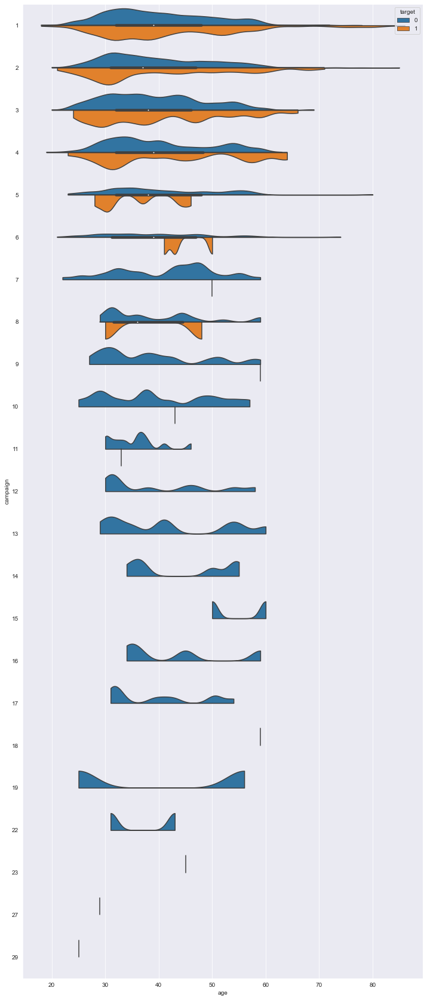

duration


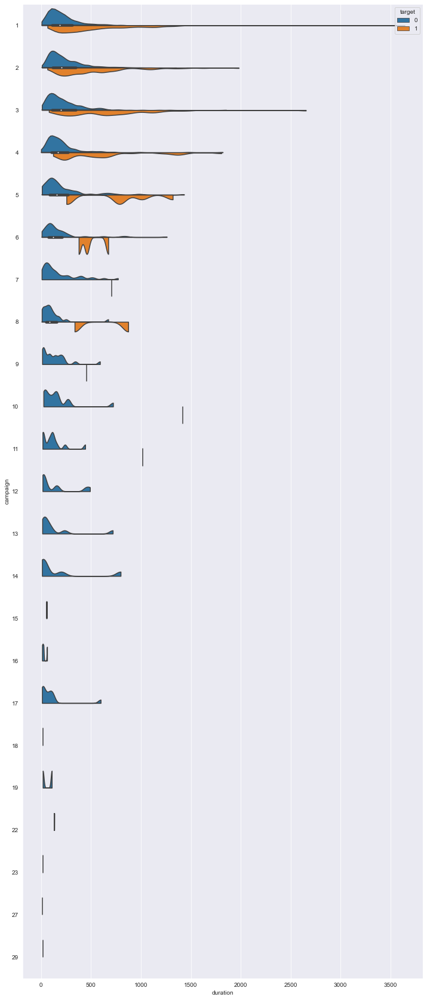

cons.price.idx


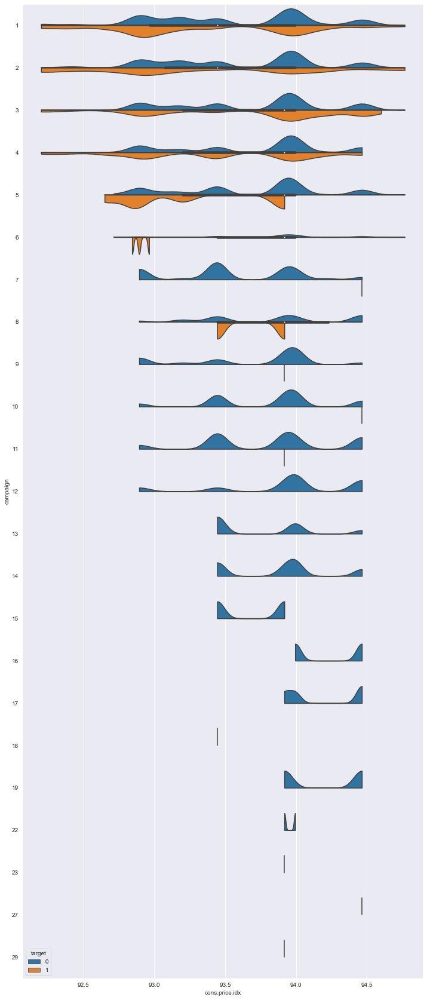

cons.conf.idx


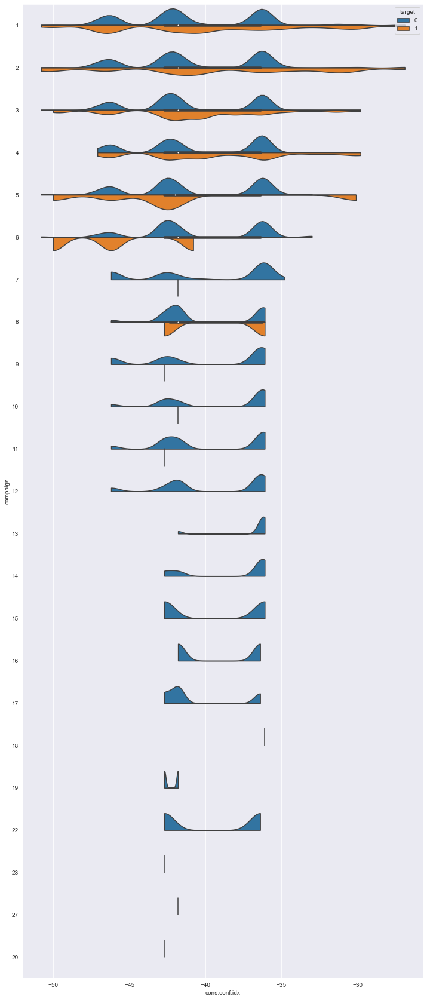

euribor3m


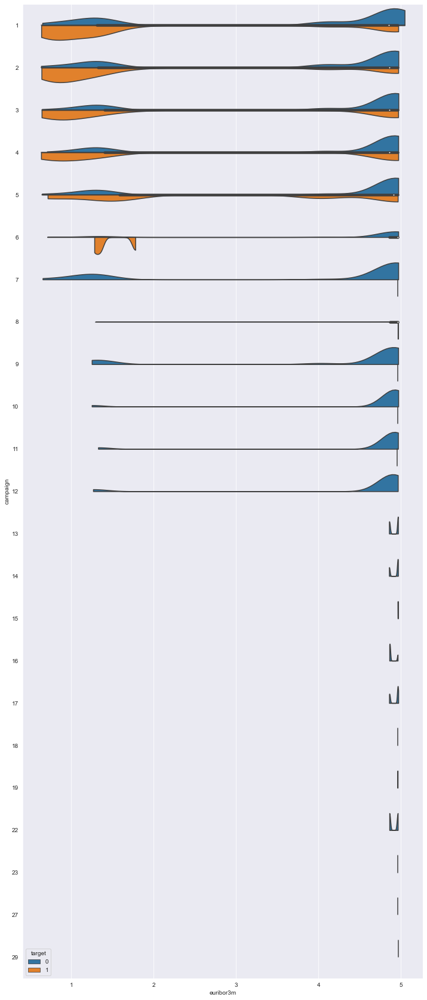

In [74]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,30))
    sns.violinplot(data=train_df, x=col, y="campaign", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('campaign')
    plt.show()

age


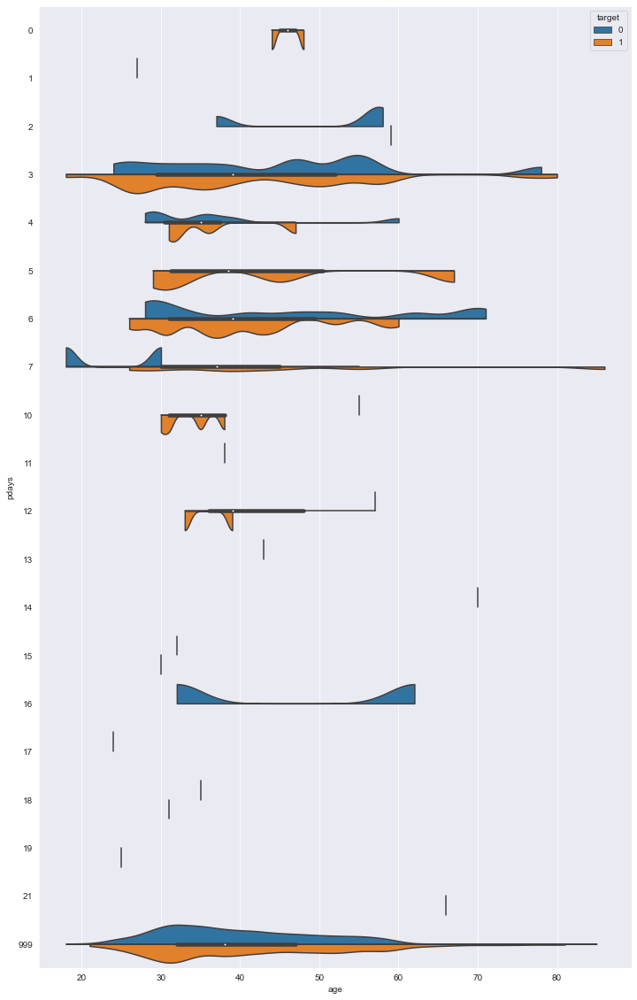

duration


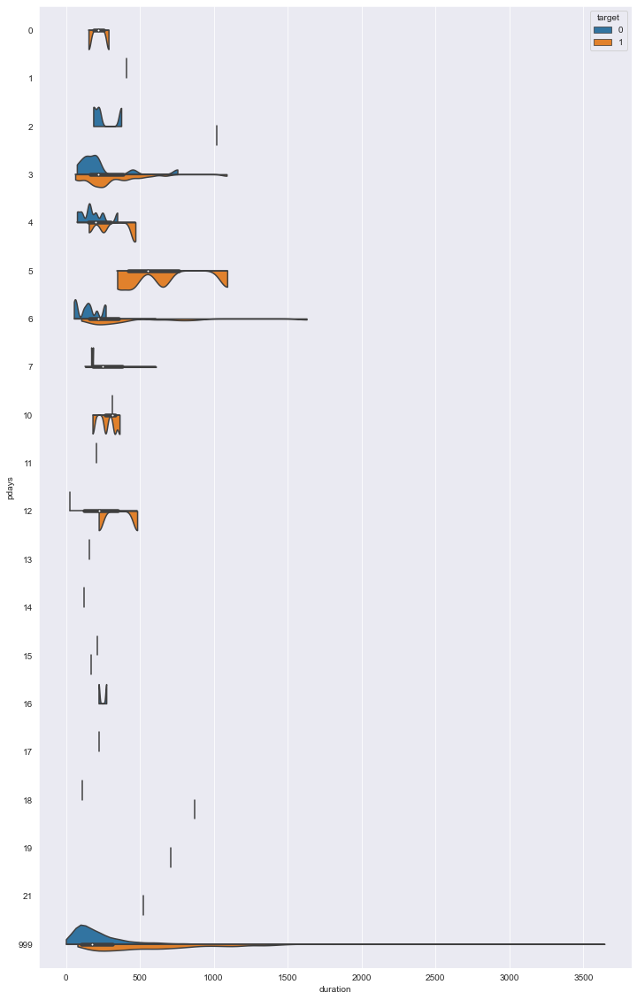

cons.price.idx


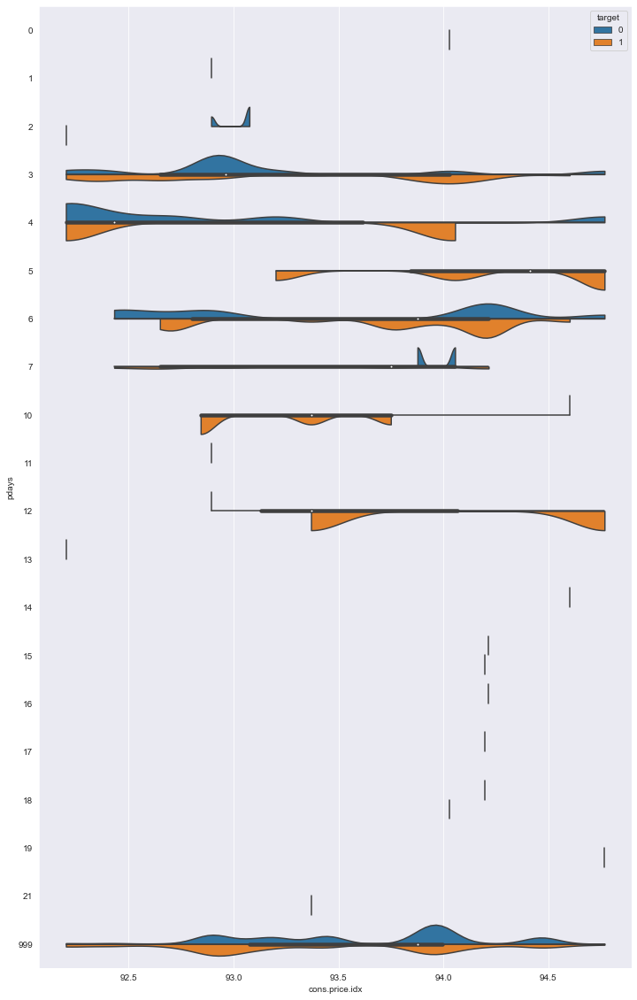

cons.conf.idx


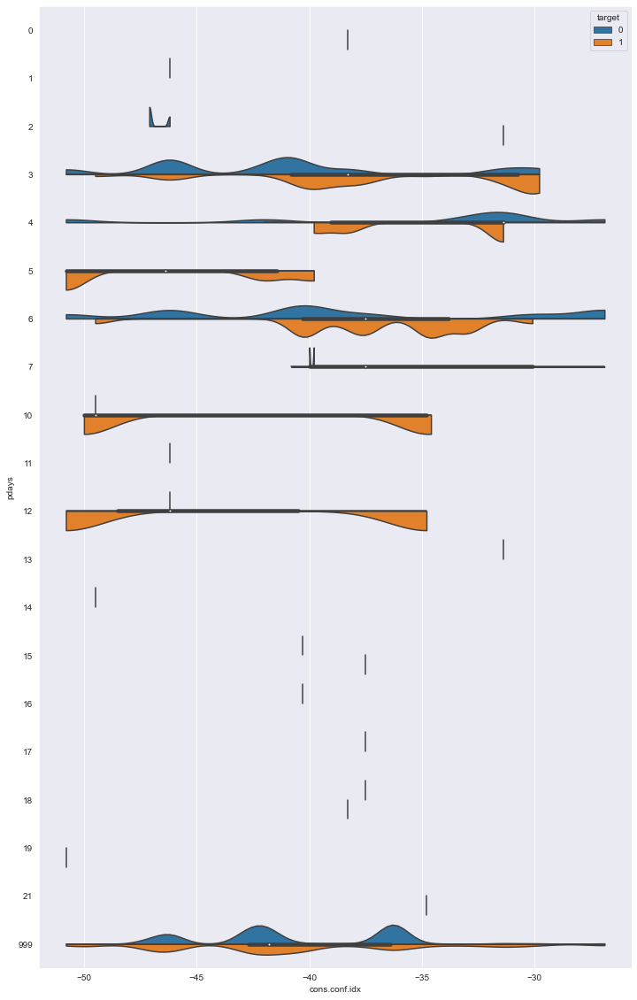

euribor3m


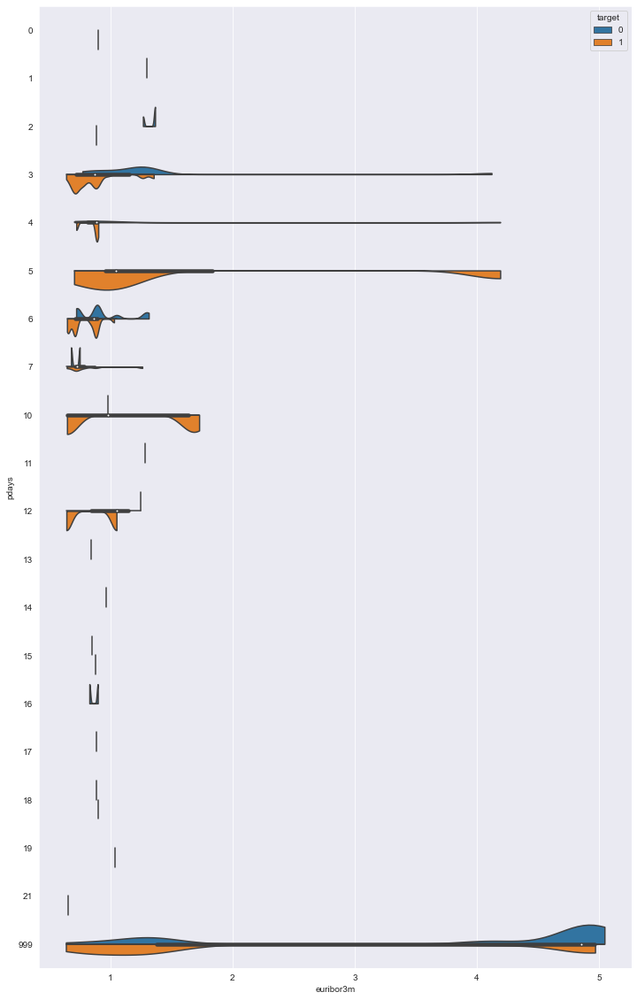

In [75]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,20))
    sns.violinplot(data=train_df, x=col, y="pdays", hue="target", split=True,orient='h',bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('pdays')
    plt.show()

age


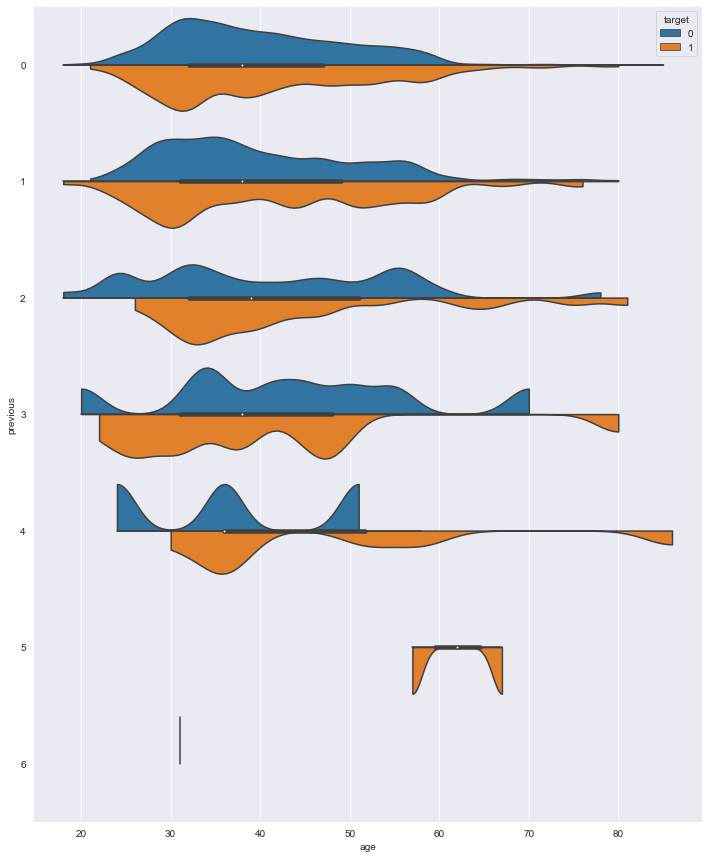

duration


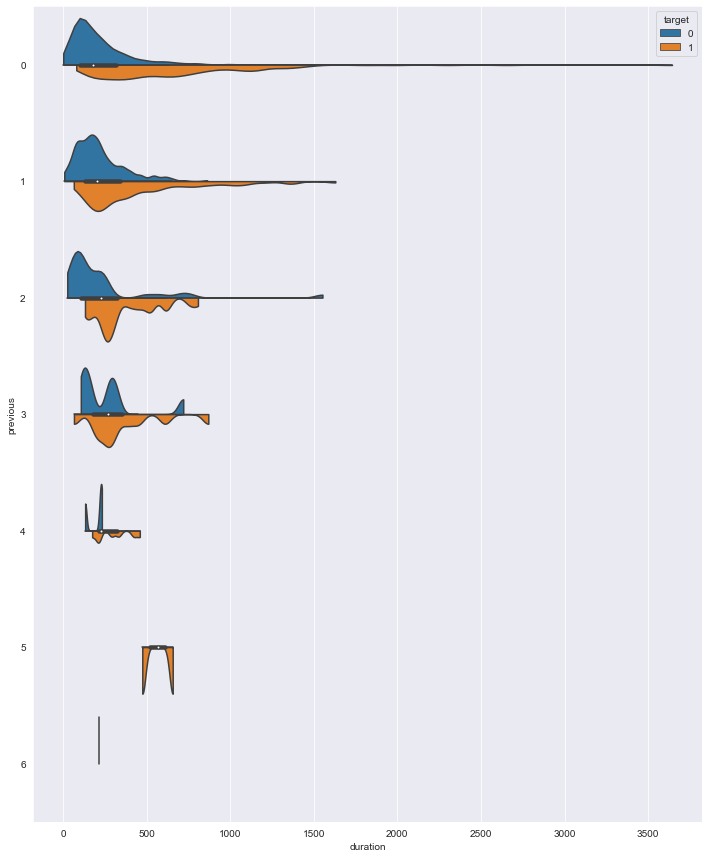

cons.price.idx


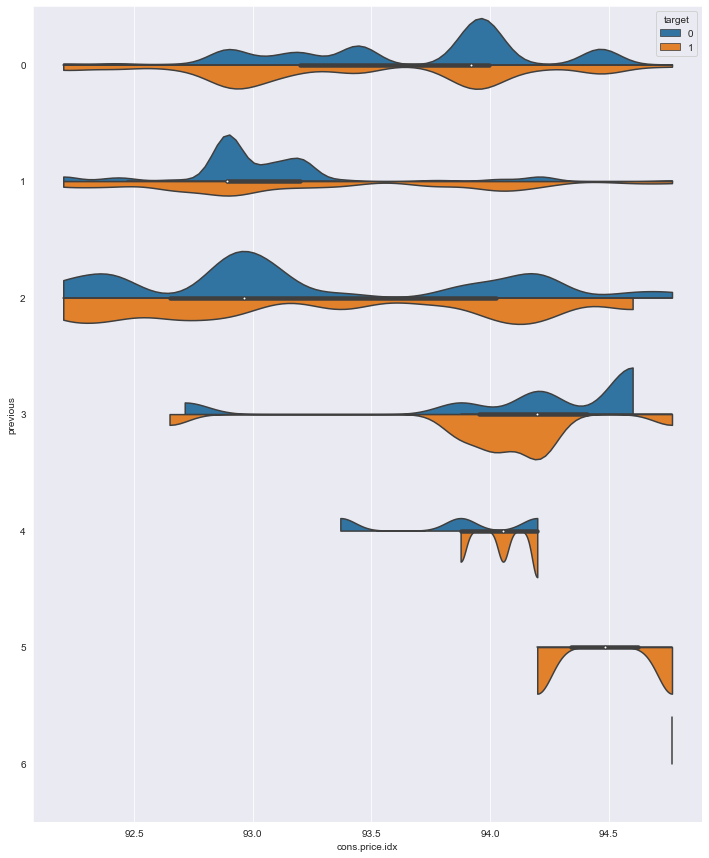

cons.conf.idx


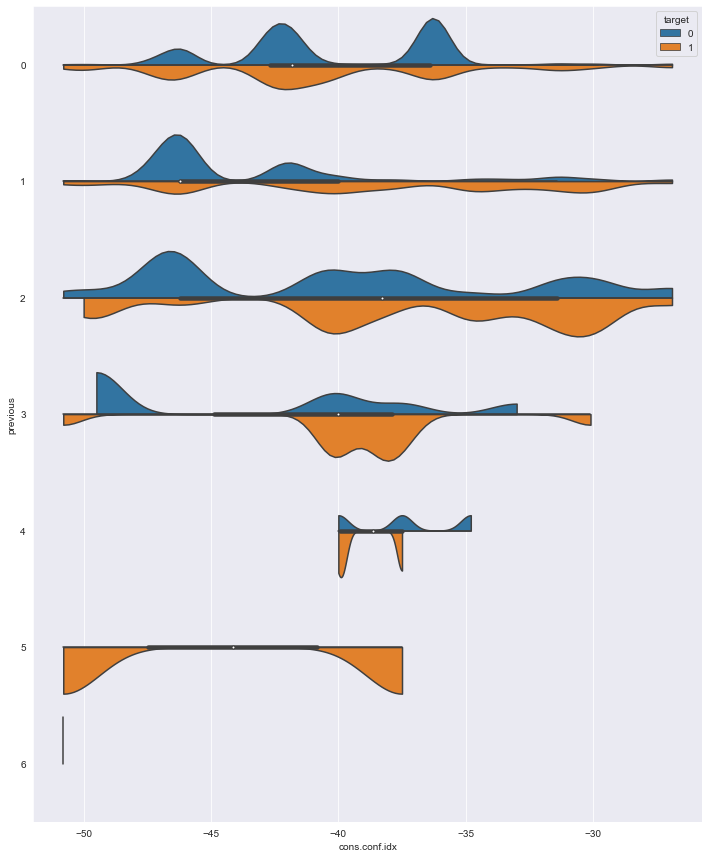

euribor3m


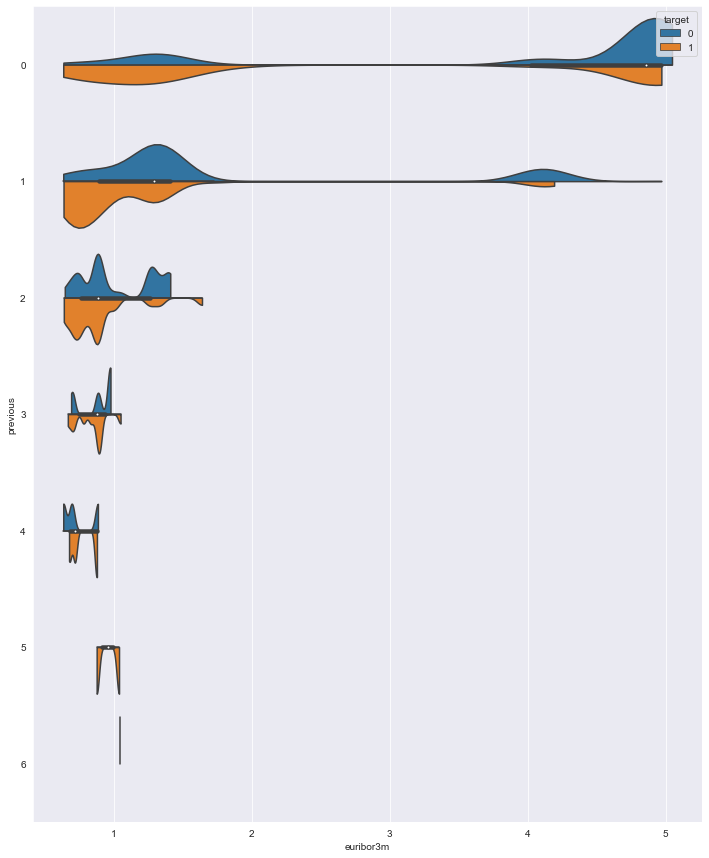

In [76]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,15))
    sns.violinplot(data=train_df, x=col, y="previous", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('previous')
    plt.show() 

age


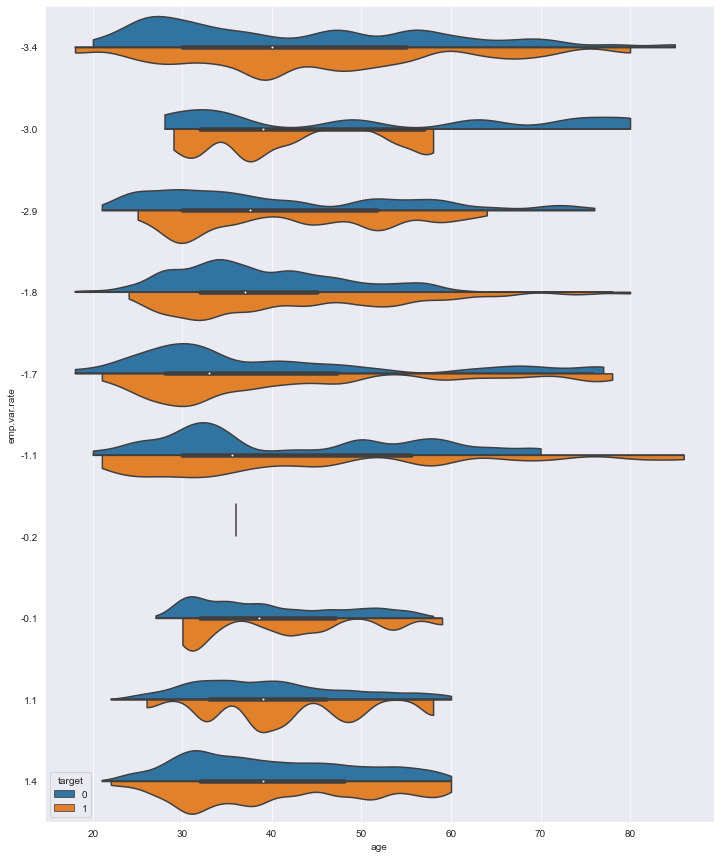

duration


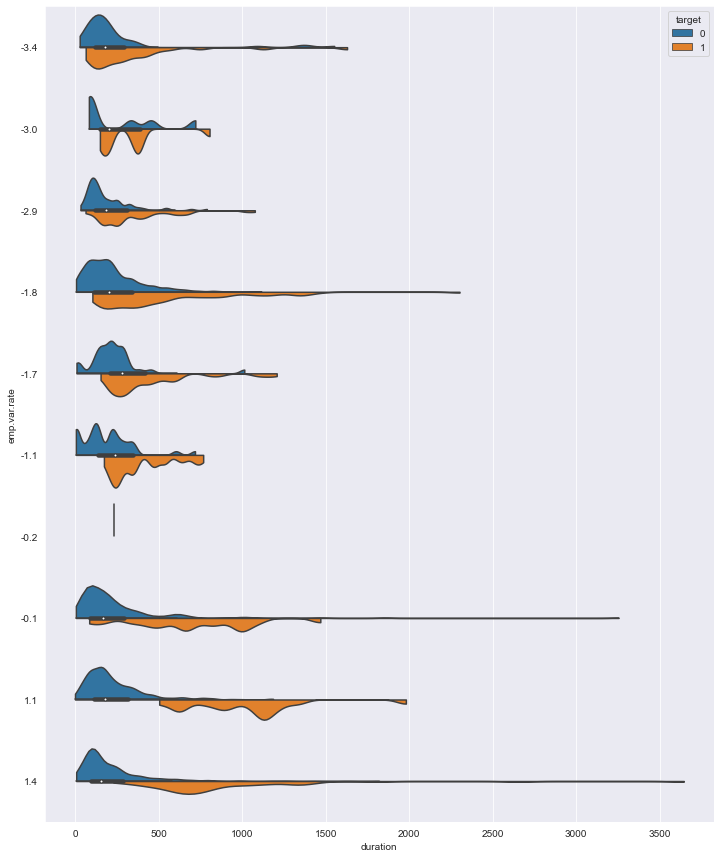

cons.price.idx


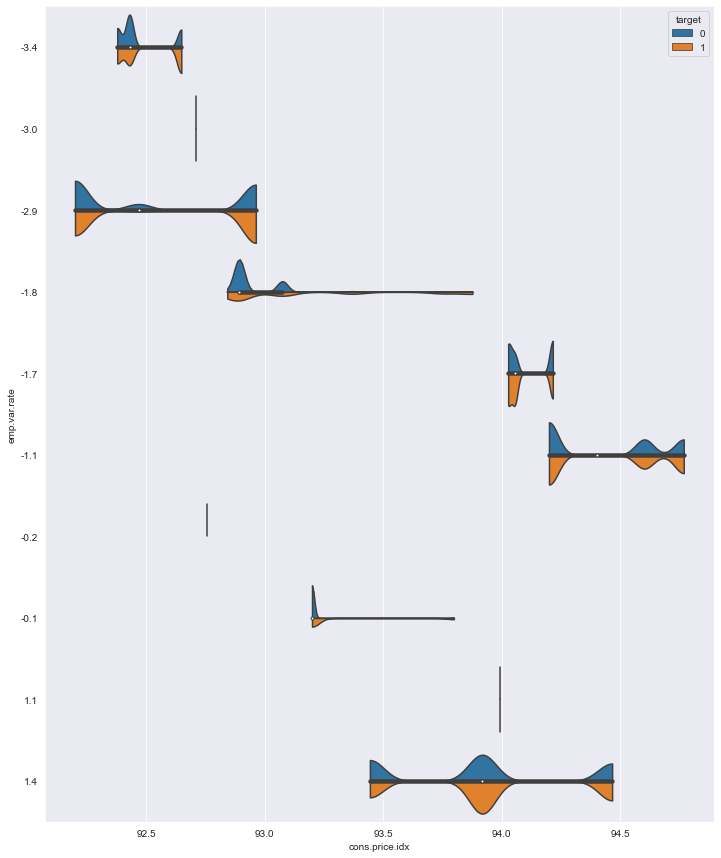

cons.conf.idx


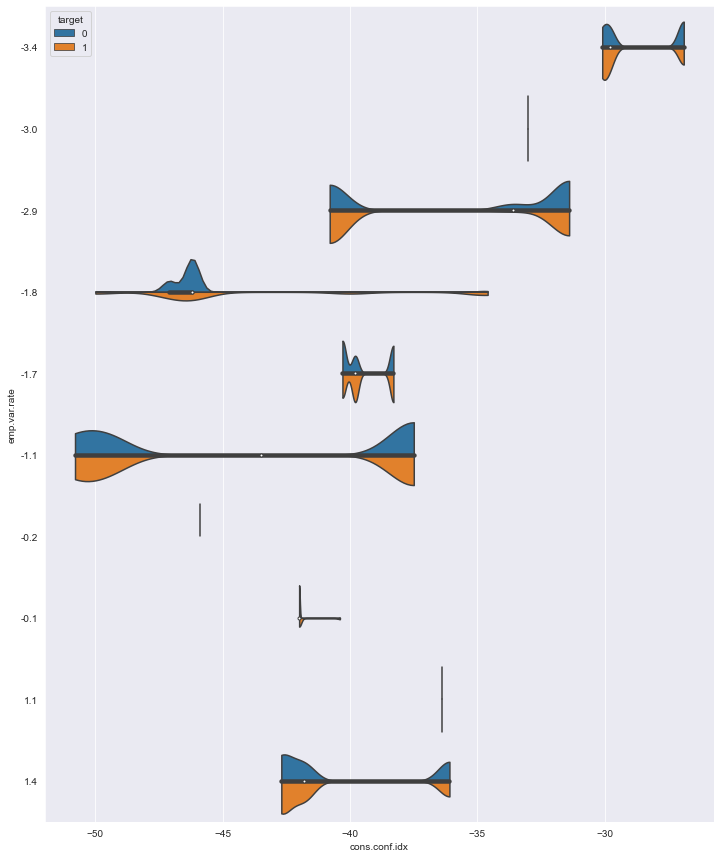

euribor3m


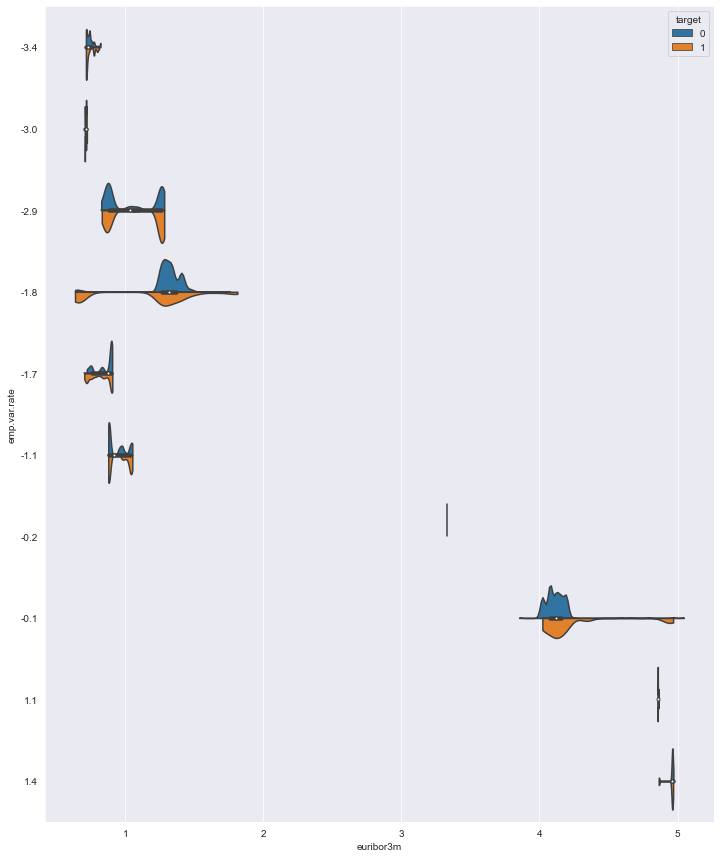

In [77]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,15))
    sns.violinplot(data=train_df, x=col, y="emp.var.rate", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('emp.var.rate')
    plt.show() 

age


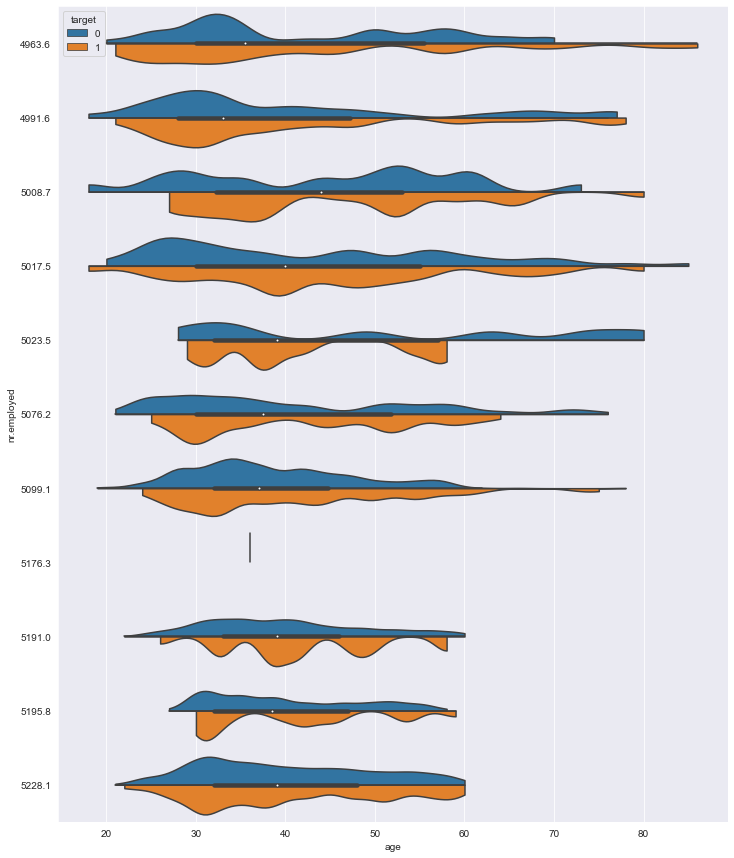

duration


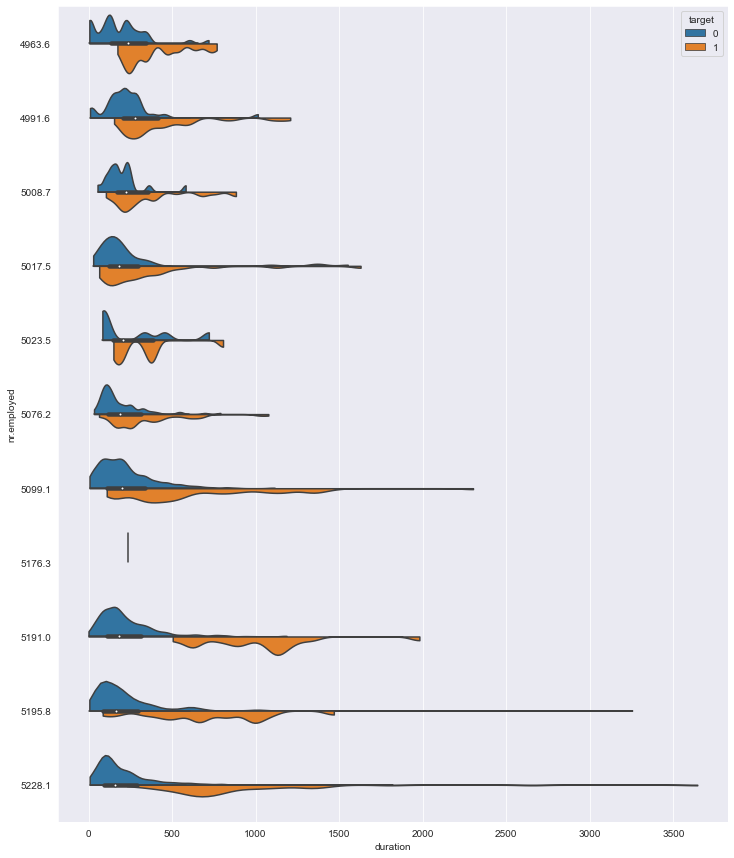

cons.price.idx


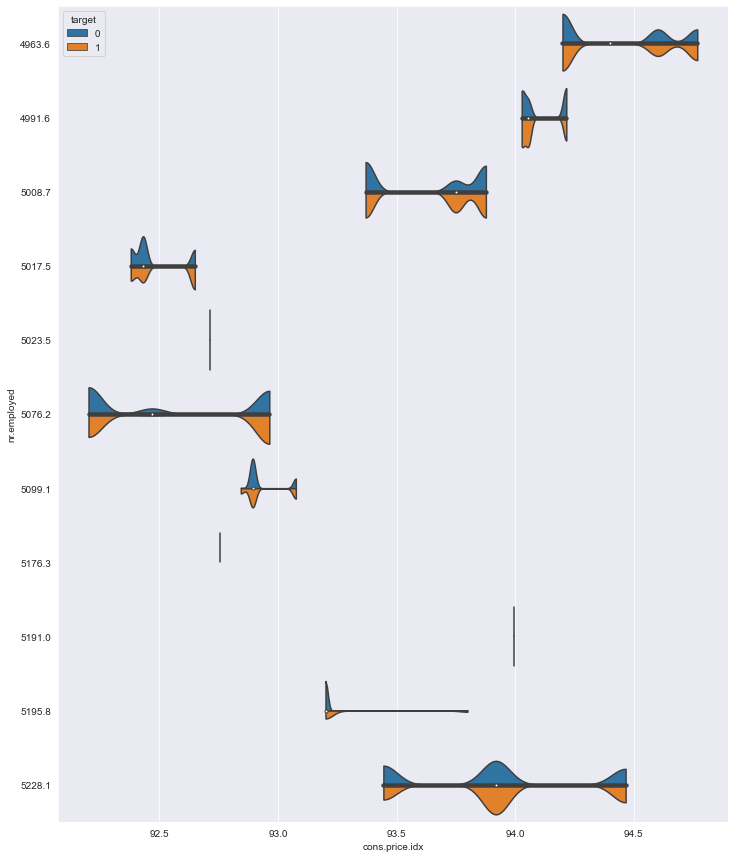

cons.conf.idx


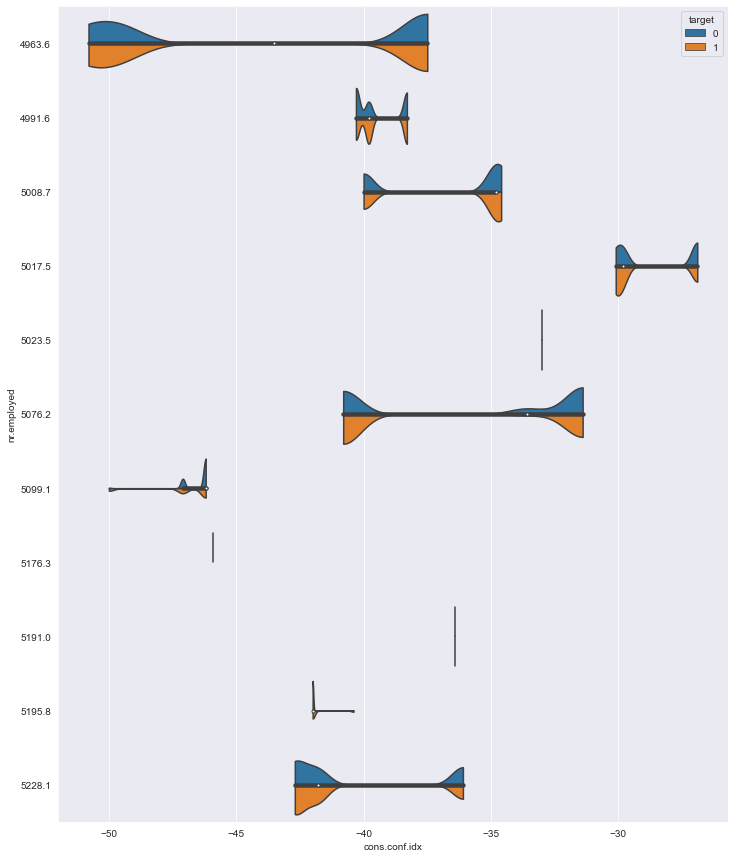

euribor3m


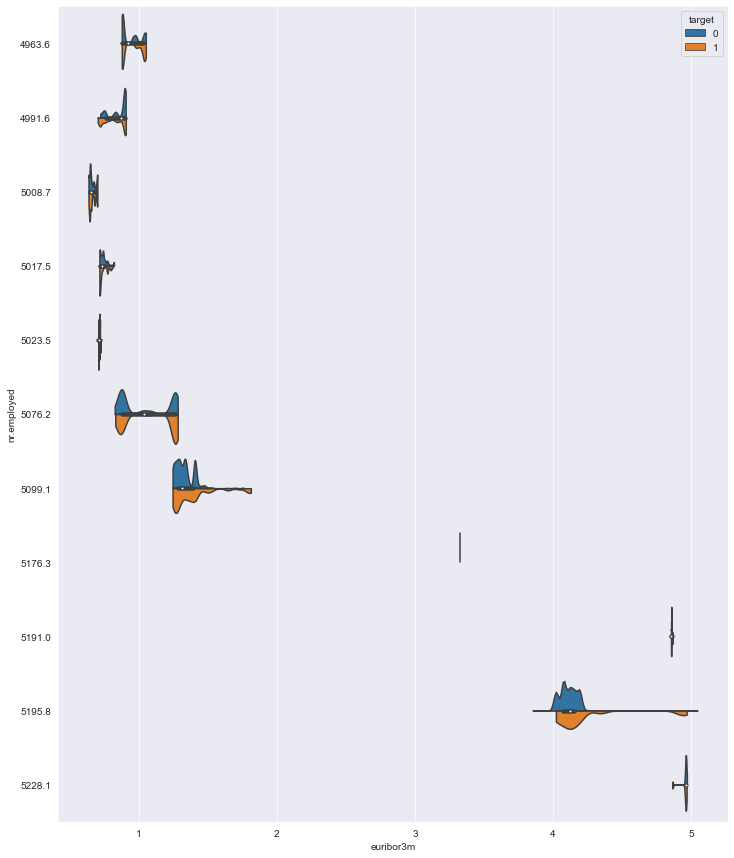

In [78]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,15))
    sns.violinplot(data=train_df, x=col, y="nr.employed", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('nr.employed')
    plt.show() 

In [79]:
numerical_features

Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed',
       'target'],
      dtype='object')

In [80]:
categorical_features

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome'],
      dtype='object')

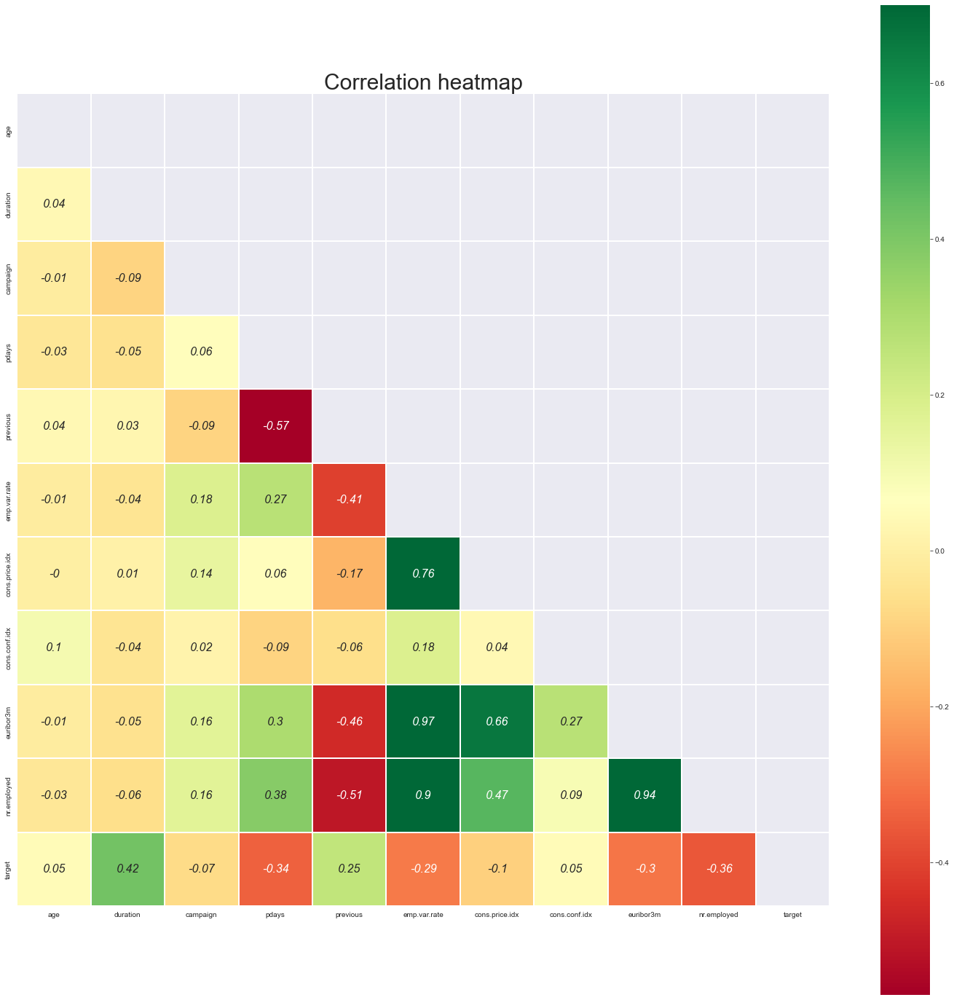

In [81]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df[numerical_features].corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df[numerical_features].corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

### Observation :

1. We can see there is positive correlation between ['duration','previous'] and 'target'
2. there is a negative correlation between ['nr.employed','pdays'] and target

### Multicollinearity

4. there exists the Multicollinearity

#### We need to be very careful with this Multicollinearity when using 'Linear ML Models'

## Categorical_features

### Univariate/Bivariate analysis

In [82]:
train_df[categorical_features].nunique().sort_values(ascending=False)

job            12
month          10
education       7
day_of_week     5
marital         4
default         3
housing         3
loan            3
poutcome        3
contact         2
dtype: int64

In [83]:
categorical_features = train_df[categorical_features].nunique().sort_values(ascending=False).index

In [84]:
categorical_features

Index(['job', 'month', 'education', 'day_of_week', 'marital', 'default',
       'housing', 'loan', 'poutcome', 'contact'],
      dtype='object')

job


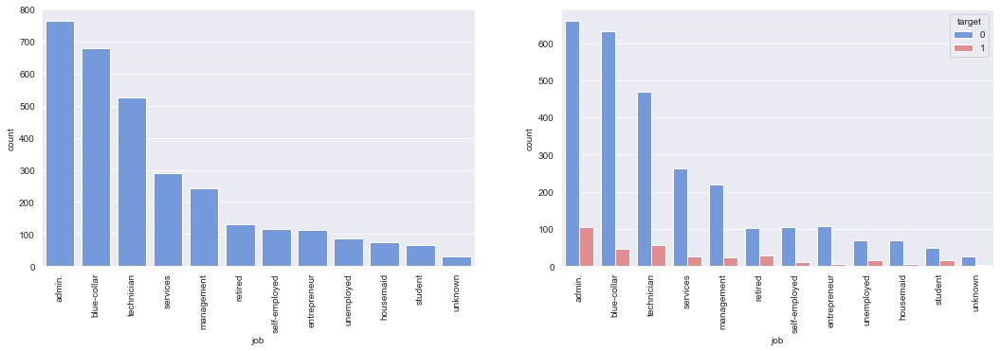

month


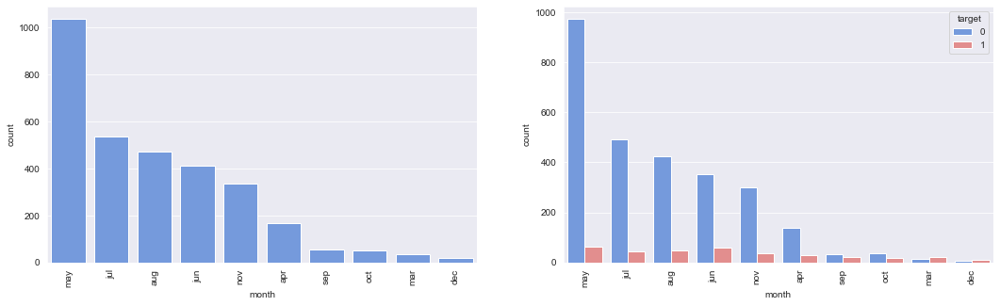

education


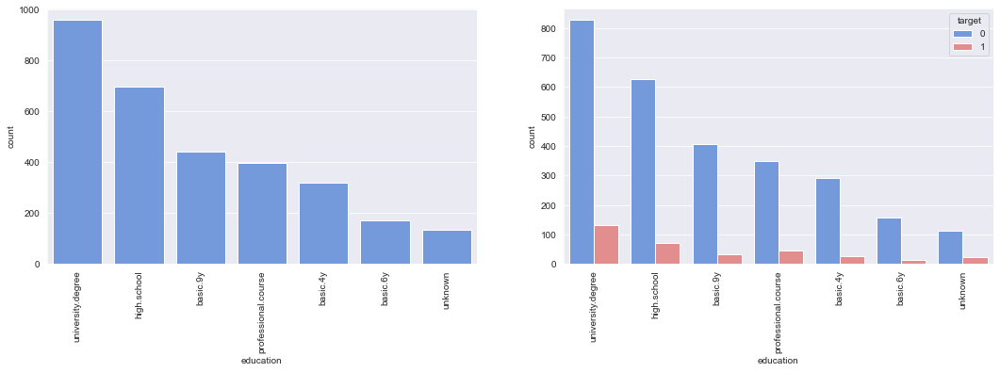

day_of_week


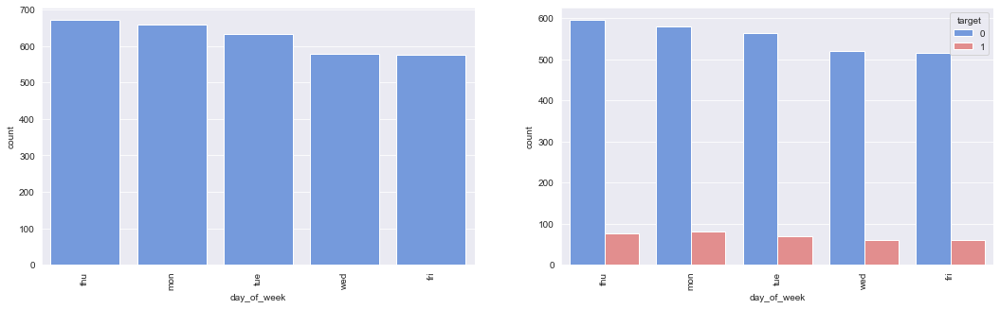

marital


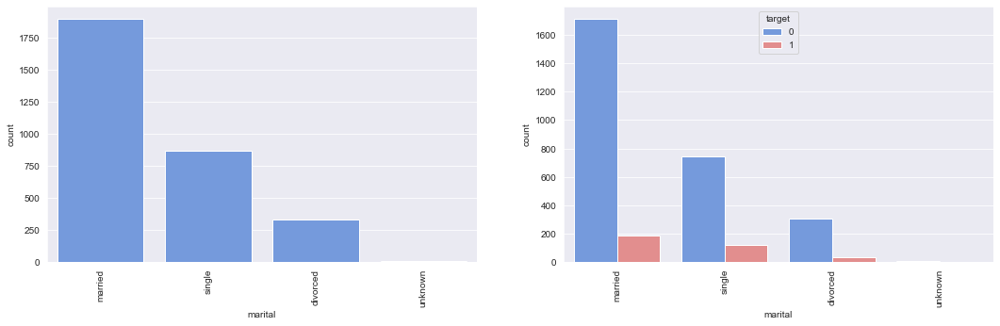

default


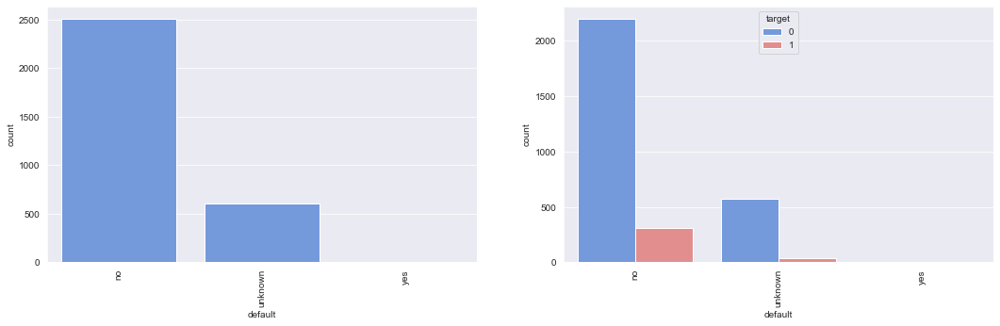

housing


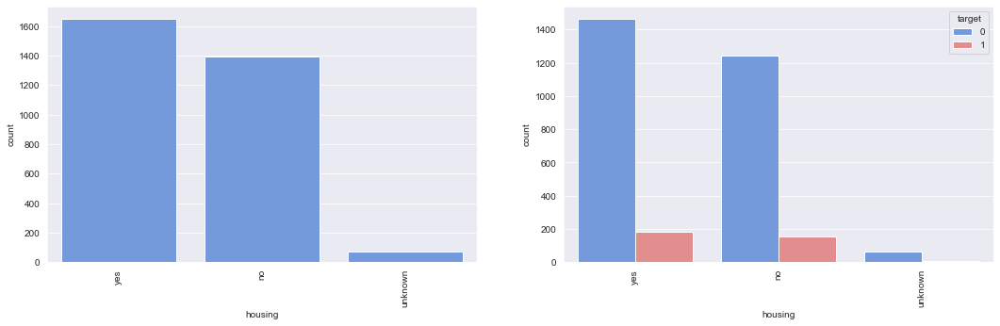

loan


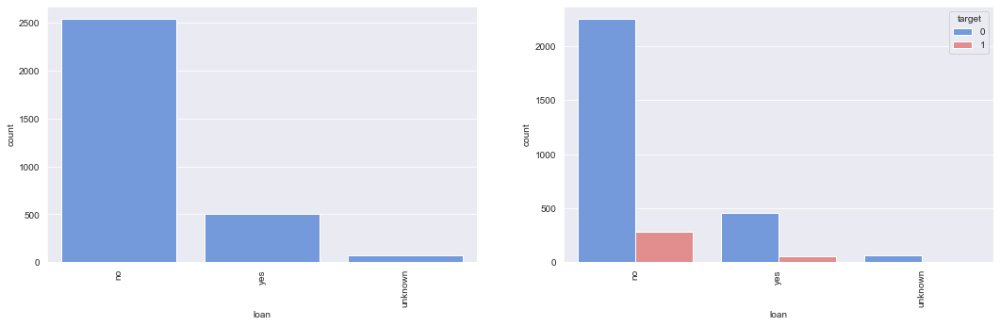

poutcome


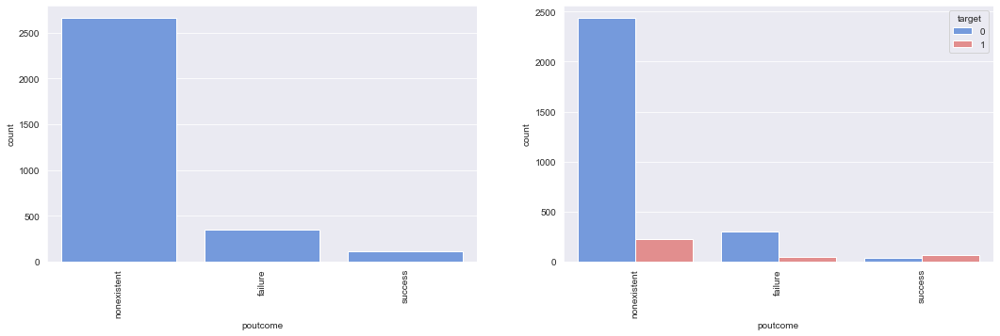

contact


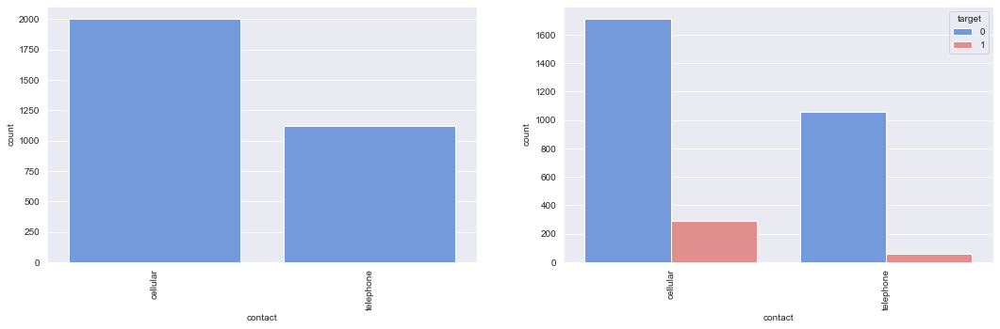

In [85]:
for col in categorical_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=train_df, x=col,color='cornflowerblue',order=train_df[col].value_counts().index)
    plt.xlabel(col)
    plt.xticks(rotation=90)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=train_df, x=col, hue="target",palette=['cornflowerblue','lightcoral'],order=train_df[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.show()

In [86]:
def plot_categorical_features_2(train_df,col):
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    
    plt.pie(train_df[col].value_counts().values, labels=train_df[col].value_counts().index,
        autopct='%1.1f%%', pctdistance=0.85)
    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col,color='cornflowerblue',order=train_df[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.show()

job
no.of nulls : 0
% of nulls : 0.0


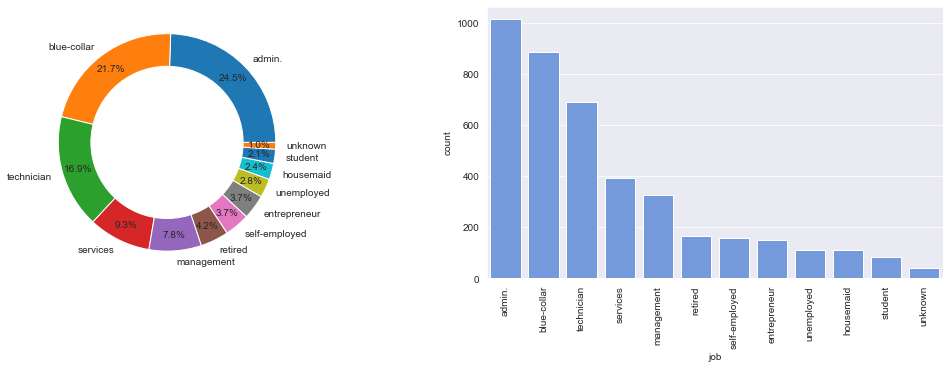

month
no.of nulls : 0
% of nulls : 0.0


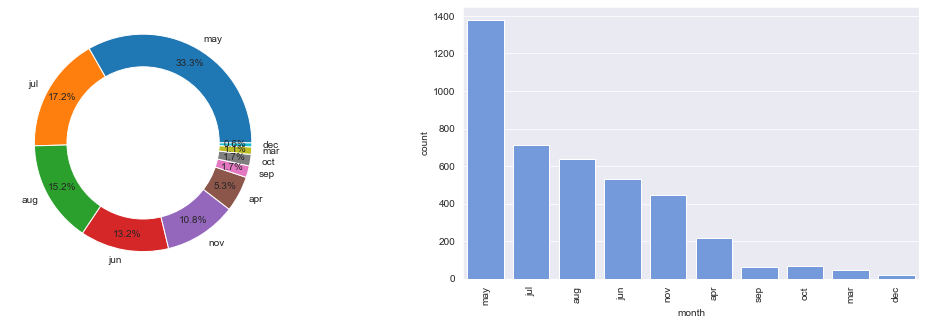

education
no.of nulls : 0
% of nulls : 0.0


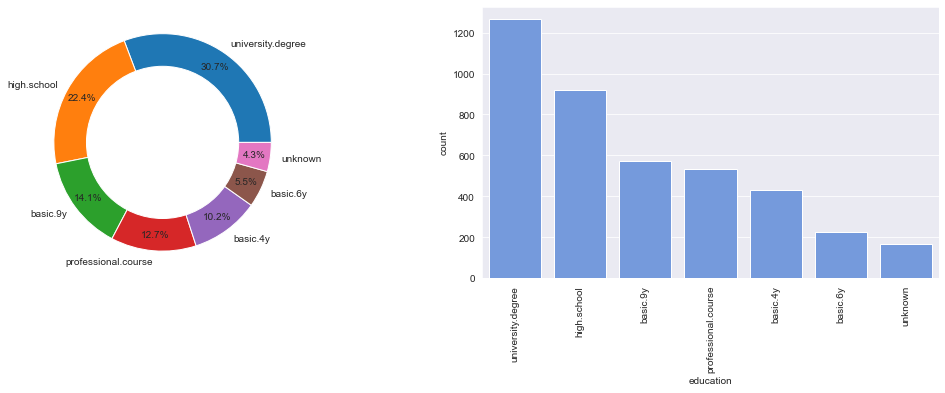

day_of_week
no.of nulls : 0
% of nulls : 0.0


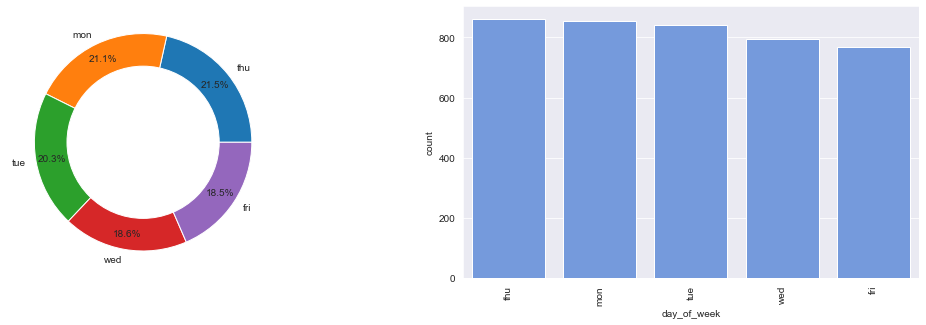

marital
no.of nulls : 0
% of nulls : 0.0


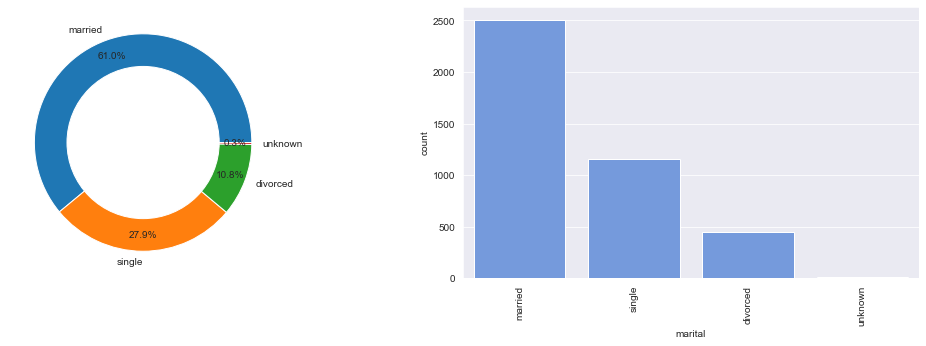

default
no.of nulls : 0
% of nulls : 0.0


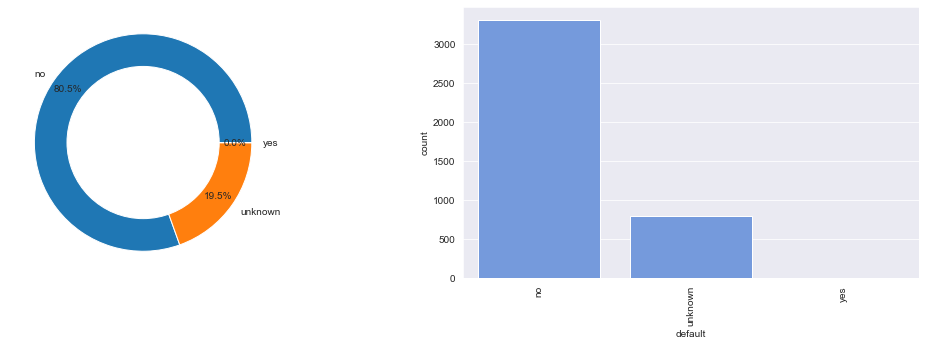

housing
no.of nulls : 0
% of nulls : 0.0


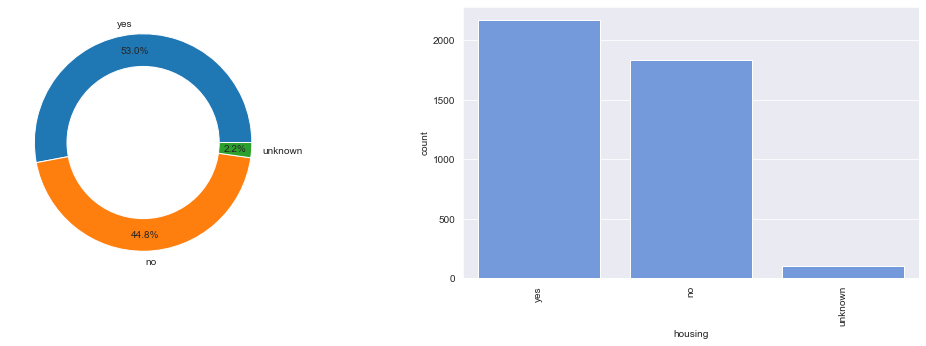

loan
no.of nulls : 0
% of nulls : 0.0


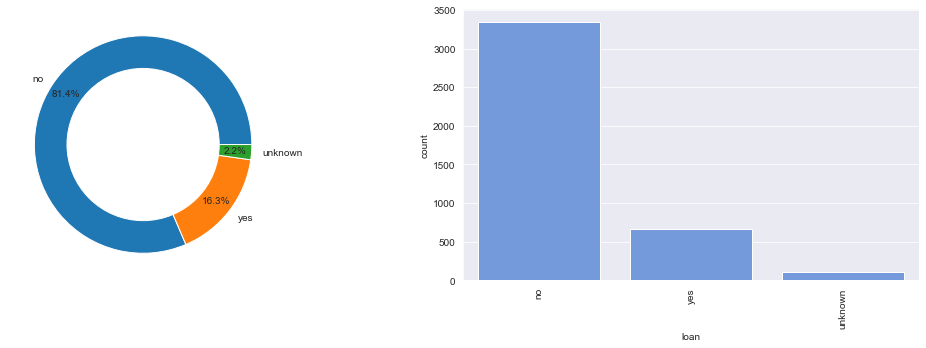

poutcome
no.of nulls : 0
% of nulls : 0.0


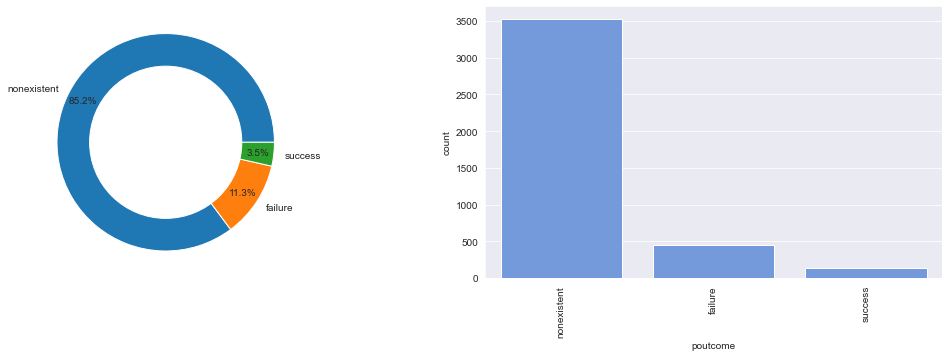

contact
no.of nulls : 0
% of nulls : 0.0


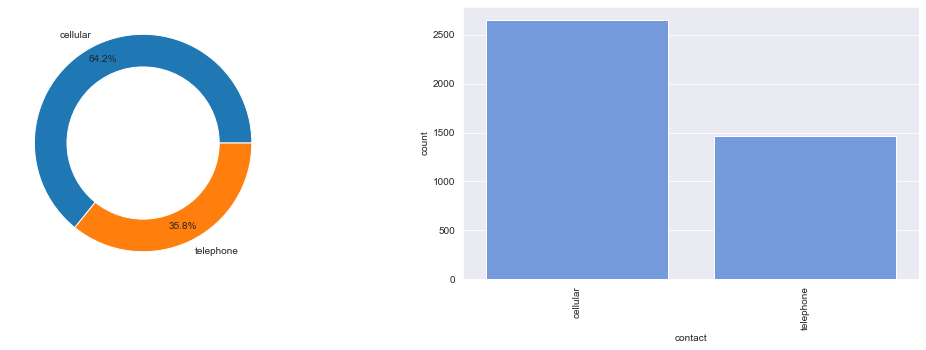

In [87]:
for col in categorical_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_categorical_features_2(train_df,col)

In [88]:
categorical_features

Index(['job', 'month', 'education', 'day_of_week', 'marital', 'default',
       'housing', 'loan', 'poutcome', 'contact'],
      dtype='object')

In [89]:
discrete_features

['campaign', 'pdays', 'previous', 'emp.var.rate', 'nr.employed']

In [90]:
train_df[categorical_features].nunique().sort_values(ascending=False)

job            12
month          10
education       7
day_of_week     5
marital         4
default         3
housing         3
loan            3
poutcome        3
contact         2
dtype: int64

job


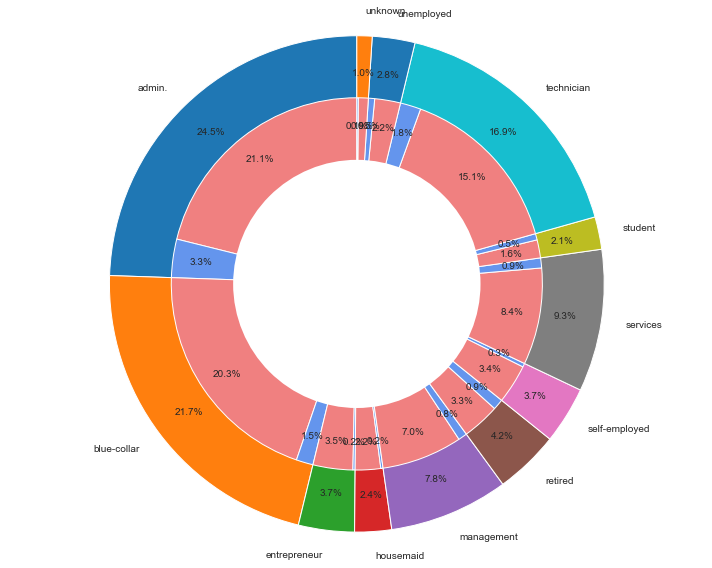

In [91]:
print('job')
labels = train_df['job'].value_counts().sort_index().index
sizes = train_df['job'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['job','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue'
                ,'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

month


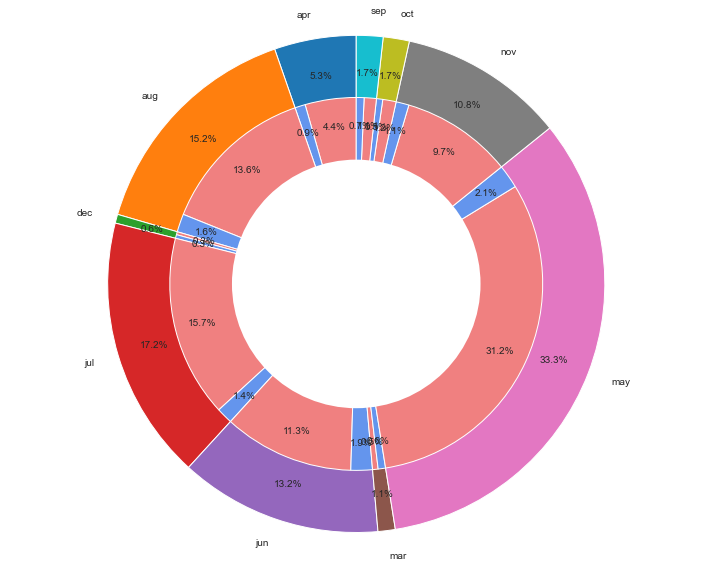

In [92]:
print('month')
labels = train_df['month'].value_counts().sort_index().index
sizes = train_df['month'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['month','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

education


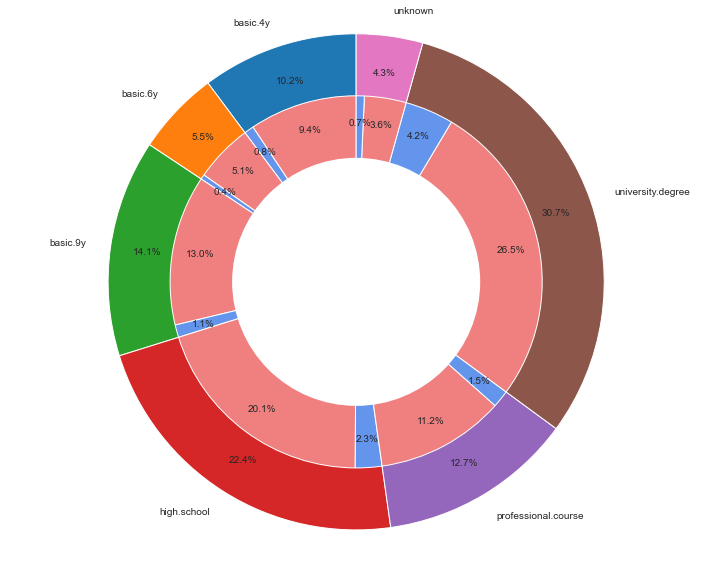

In [93]:
print('education')
labels = train_df['education'].value_counts().sort_index().index
sizes = train_df['education'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['education','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

day_of_week


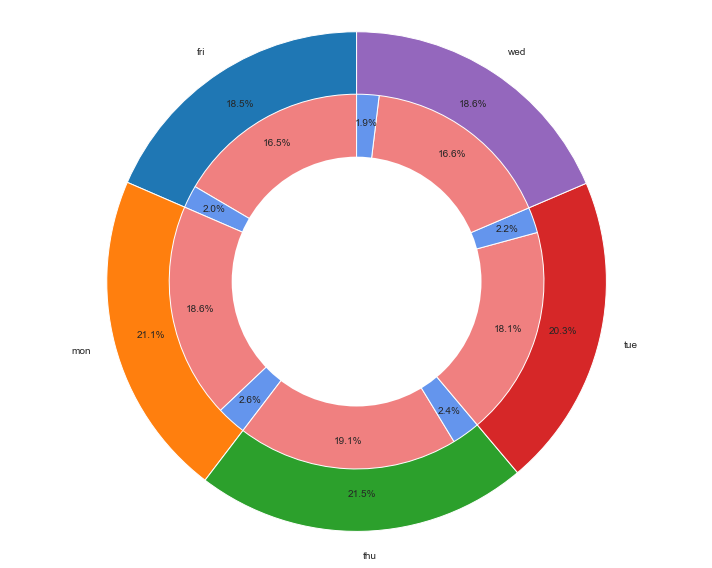

In [94]:
print('day_of_week')
labels = train_df['day_of_week'].value_counts().sort_index().index
sizes = train_df['day_of_week'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['day_of_week','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                'lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

marital


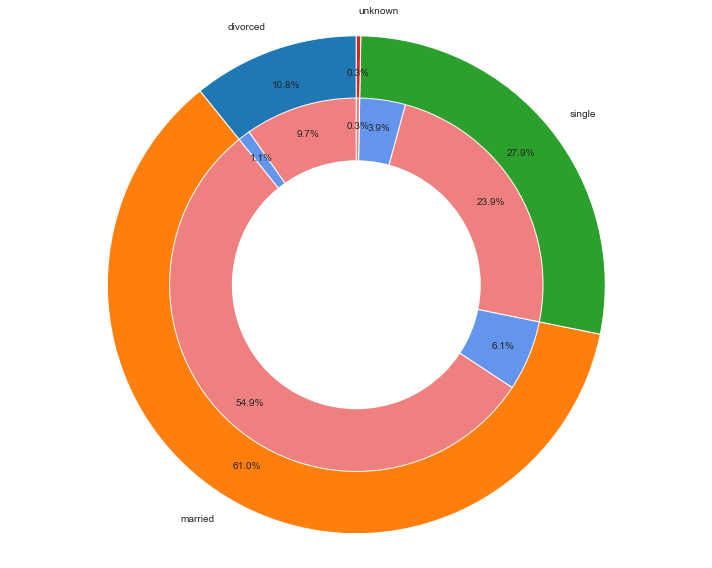

In [95]:
print('marital')
labels = train_df['marital'].value_counts().sort_index().index
sizes = train_df['marital'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['marital','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',]
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

default


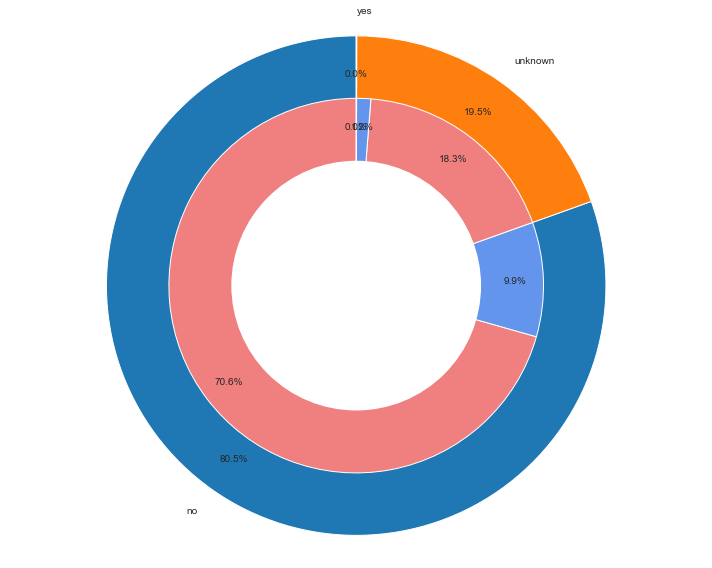

In [96]:
print('default')
labels = train_df['default'].value_counts().sort_index().index
sizes = train_df['default'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['default','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

housing


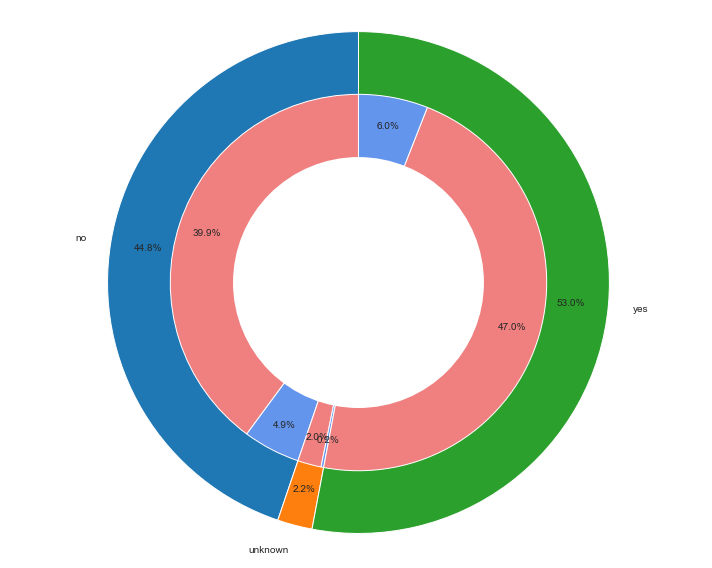

In [97]:
print('housing')
labels = train_df['housing'].value_counts().sort_index().index
sizes = train_df['housing'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['housing','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

loan


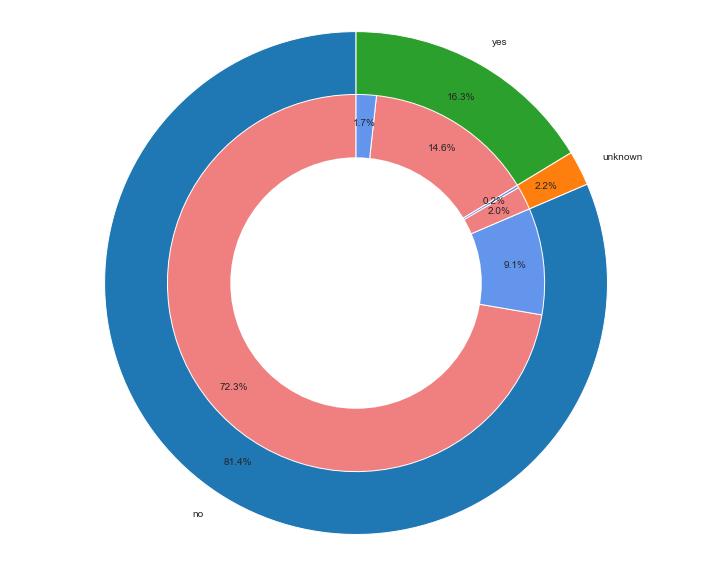

In [98]:
print('loan')
labels = train_df['loan'].value_counts().sort_index().index
sizes = train_df['loan'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['loan','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

poutcome


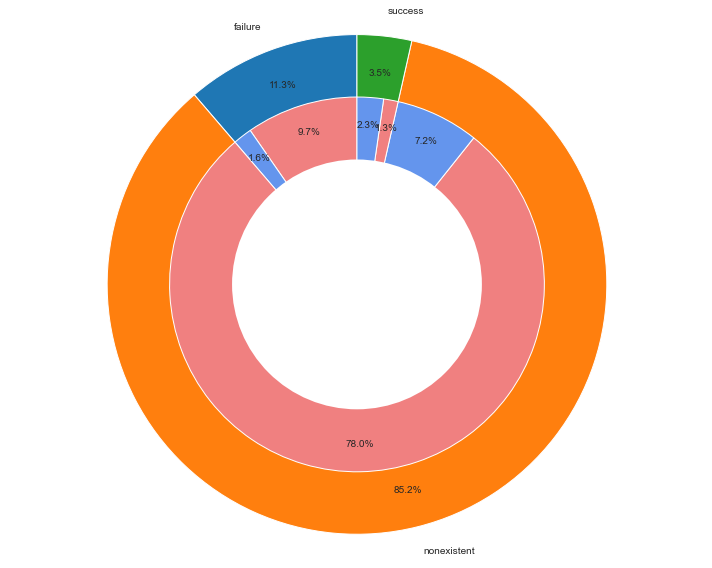

In [99]:
print('poutcome')
labels = train_df['poutcome'].value_counts().sort_index().index
sizes = train_df['poutcome'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['poutcome','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

contact


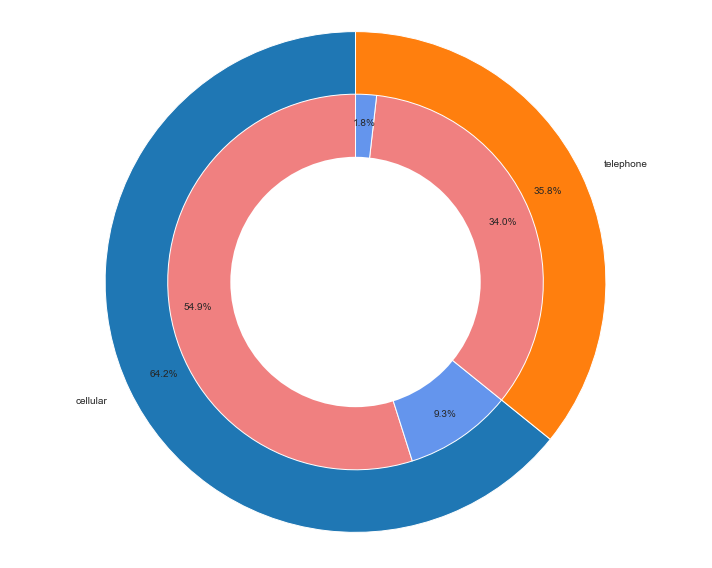

In [100]:
print('contact')
labels = train_df['contact'].value_counts().sort_index().index
sizes = train_df['contact'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['contact','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['lightcoral','cornflowerblue','lightcoral','cornflowerblue']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

In [101]:
categorical_features

Index(['job', 'month', 'education', 'day_of_week', 'marital', 'default',
       'housing', 'loan', 'poutcome', 'contact'],
      dtype='object')

In [102]:
train_df[categorical_features].nunique()

job            12
month          10
education       7
day_of_week     5
marital         4
default         3
housing         3
loan            3
poutcome        3
contact         2
dtype: int64

age


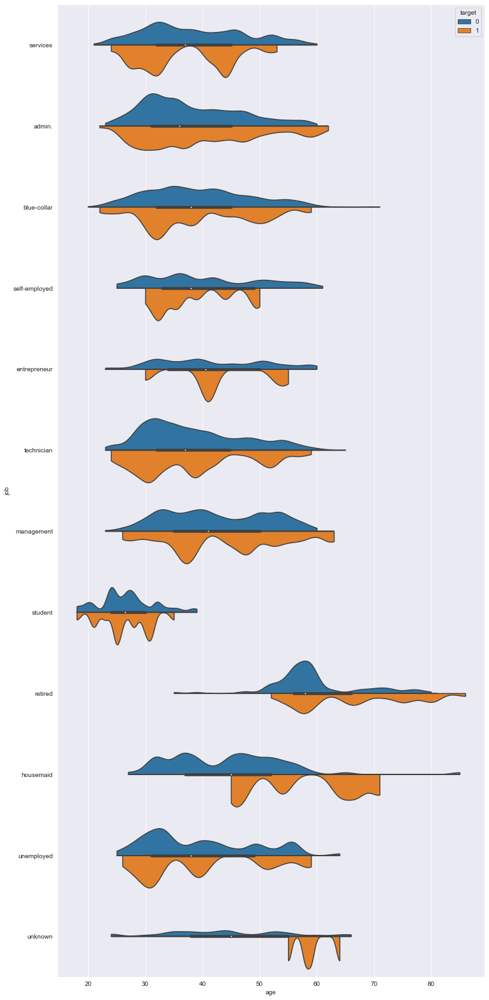

duration


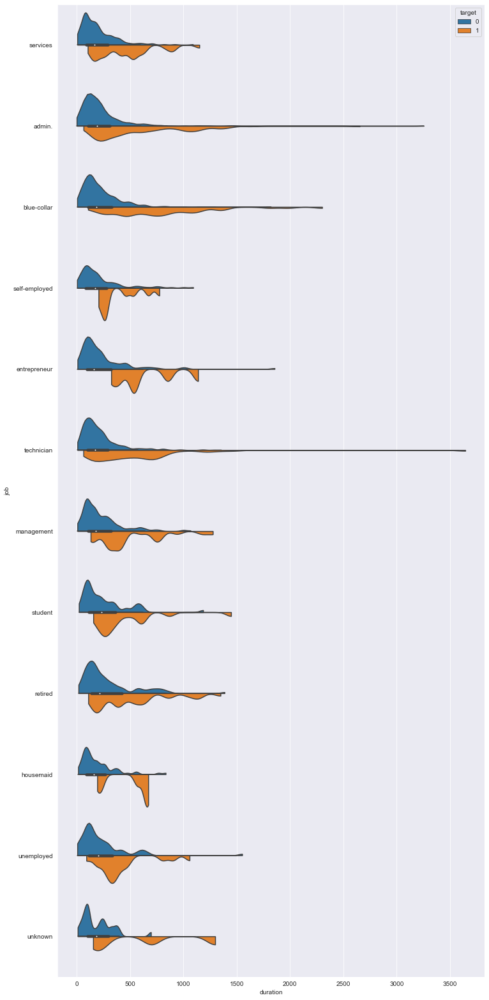

cons.price.idx


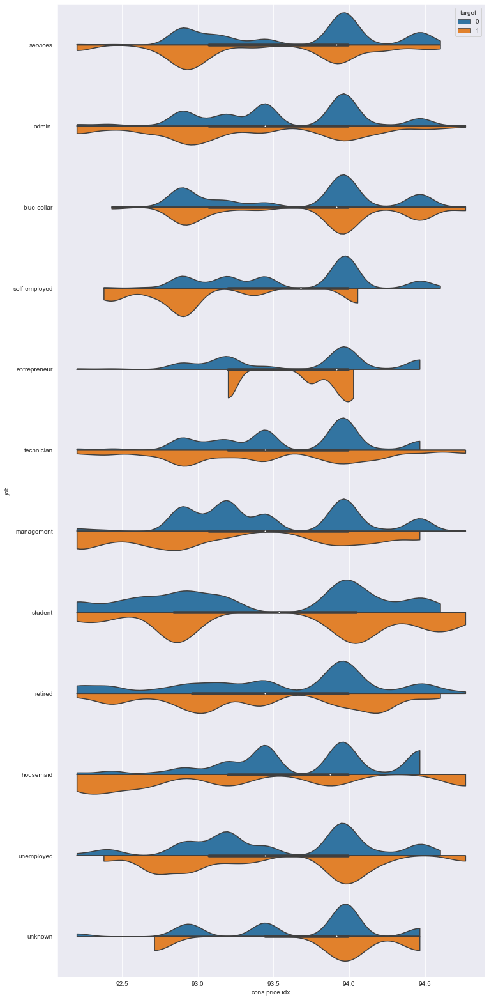

cons.conf.idx


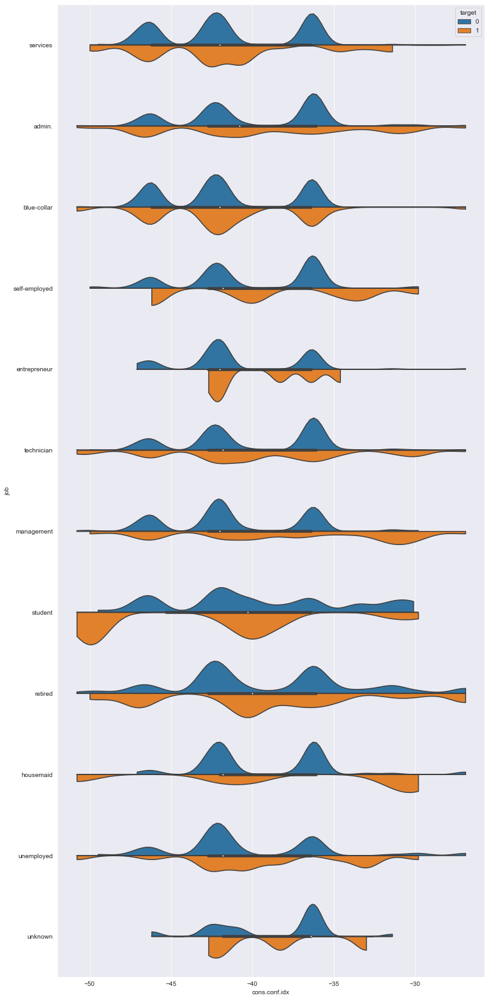

euribor3m


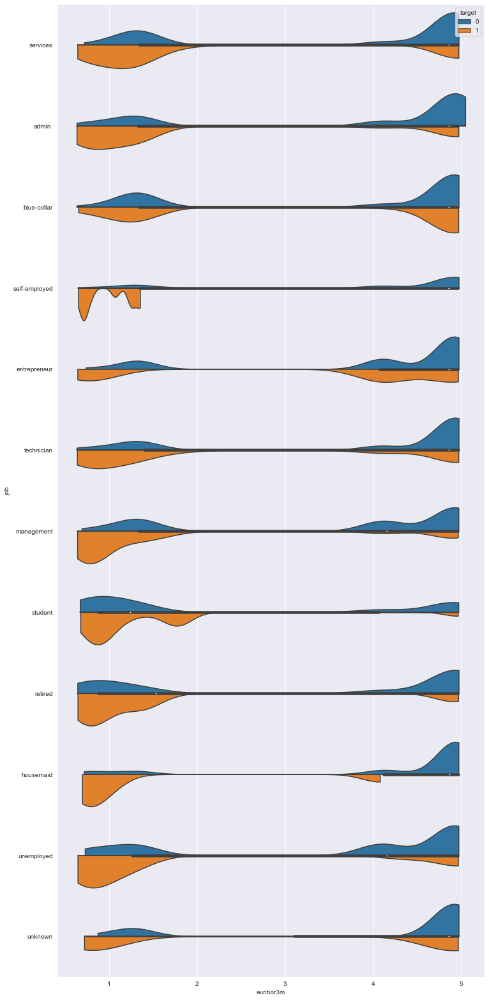

In [103]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,28))
    sns.violinplot(data=train_df, x=col, y="job", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('job')
    plt.show()

age


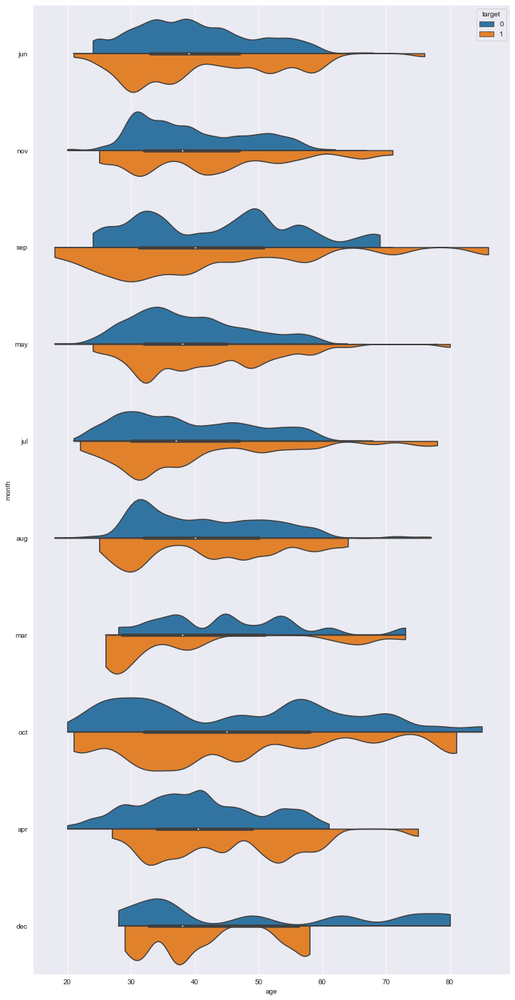

duration


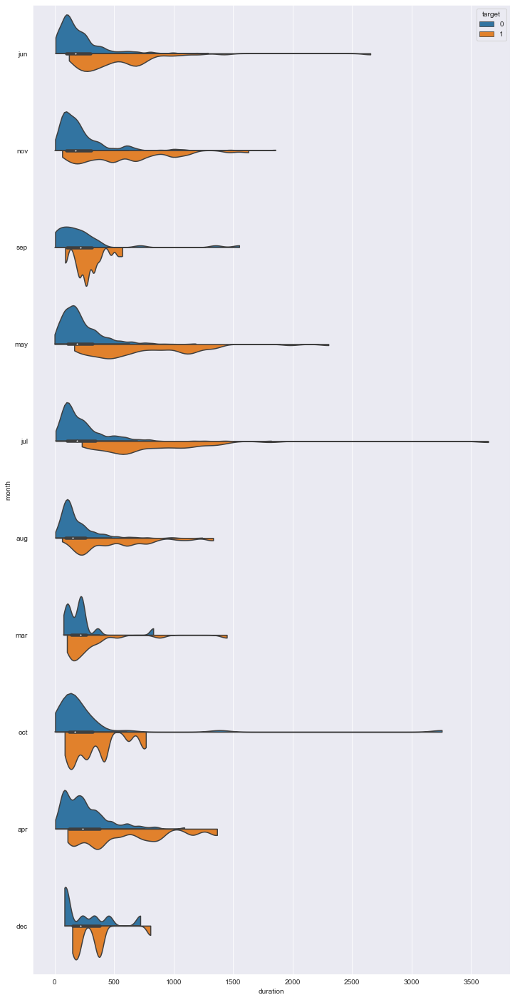

cons.price.idx


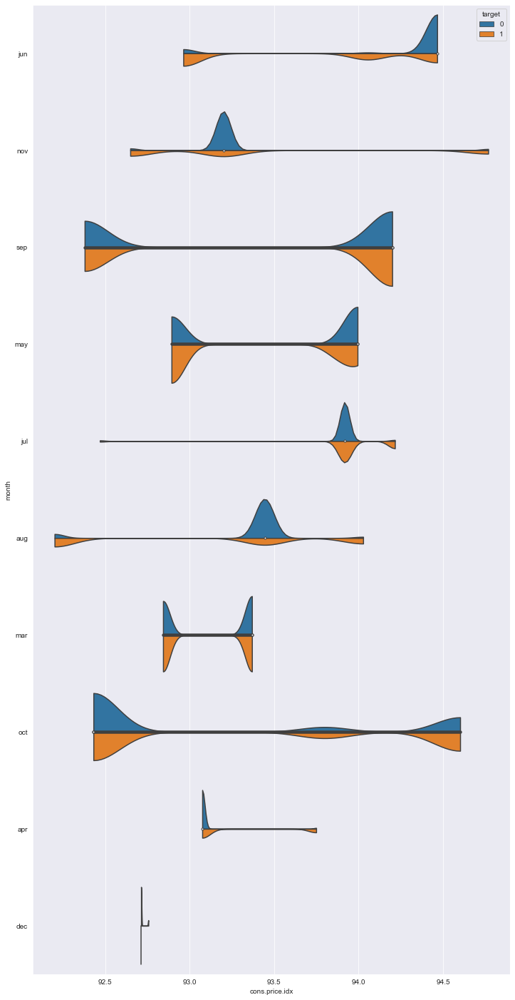

cons.conf.idx


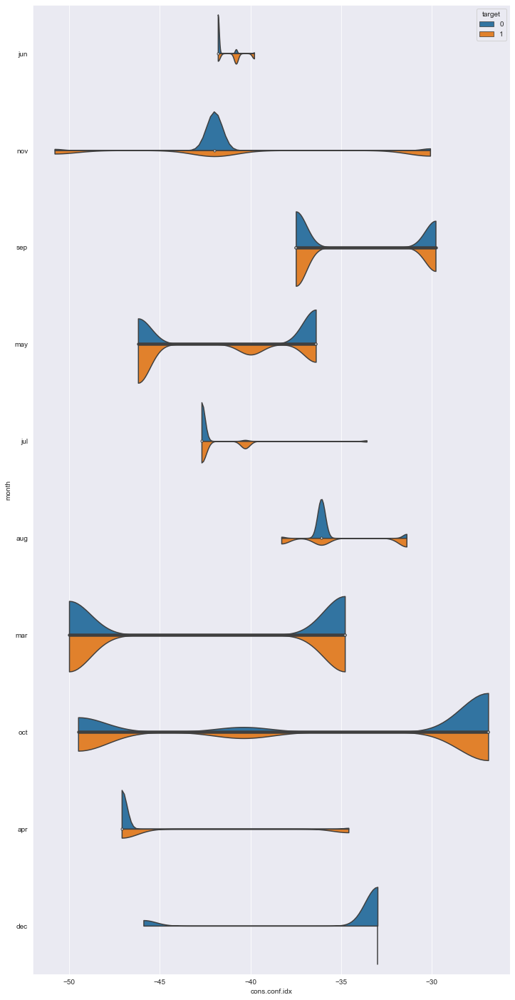

euribor3m


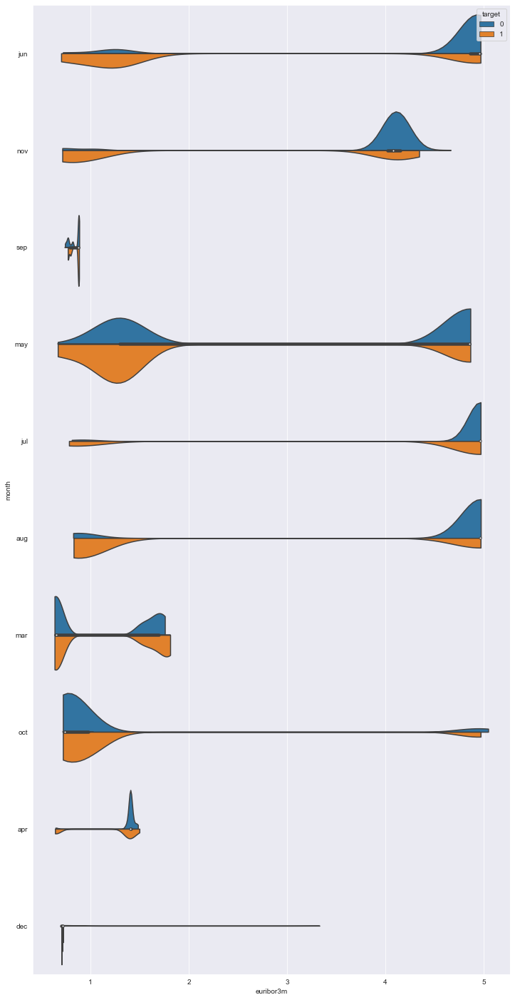

In [104]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,25))
    sns.violinplot(data=train_df, x=col, y="month", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('month')
    plt.show()

age


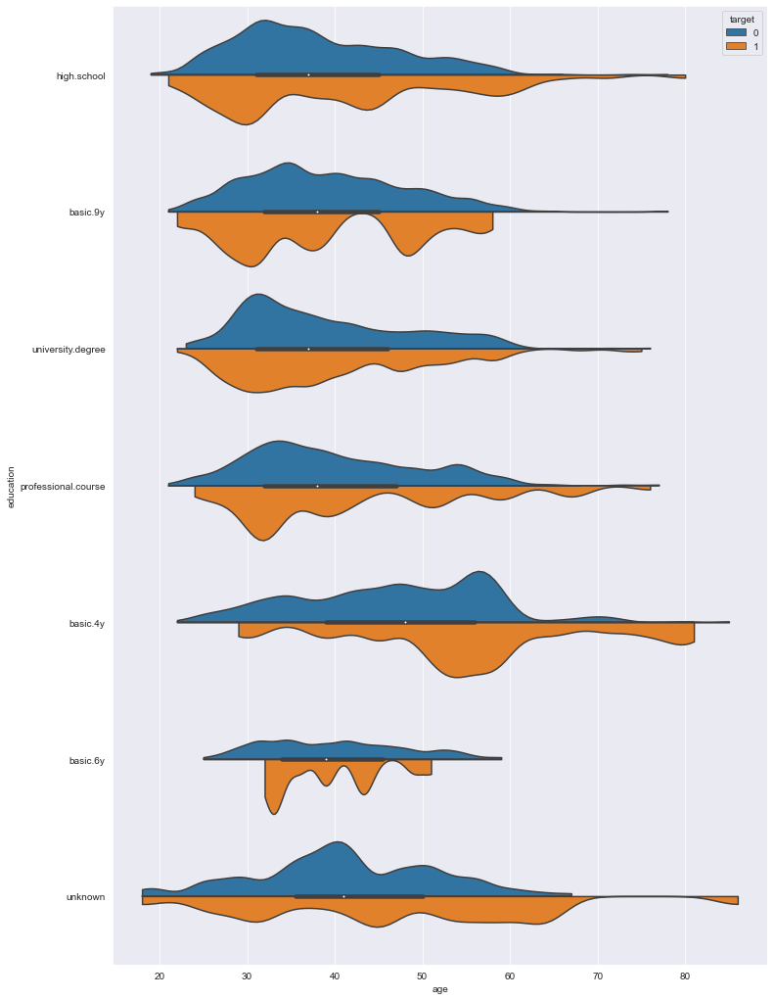

duration


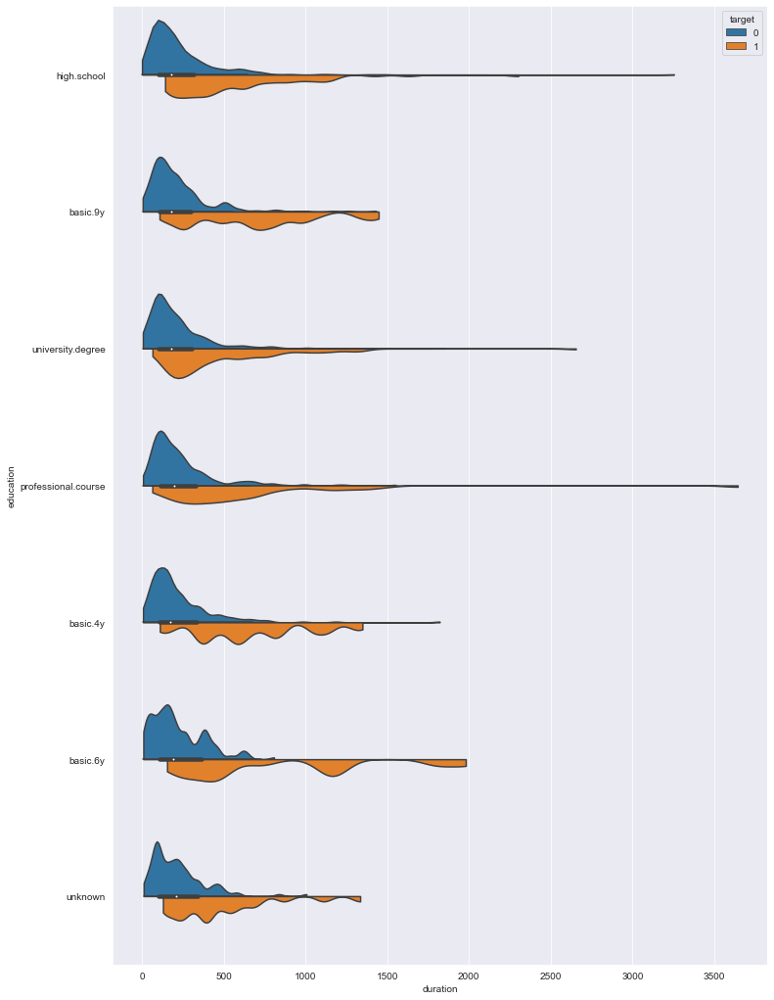

cons.price.idx


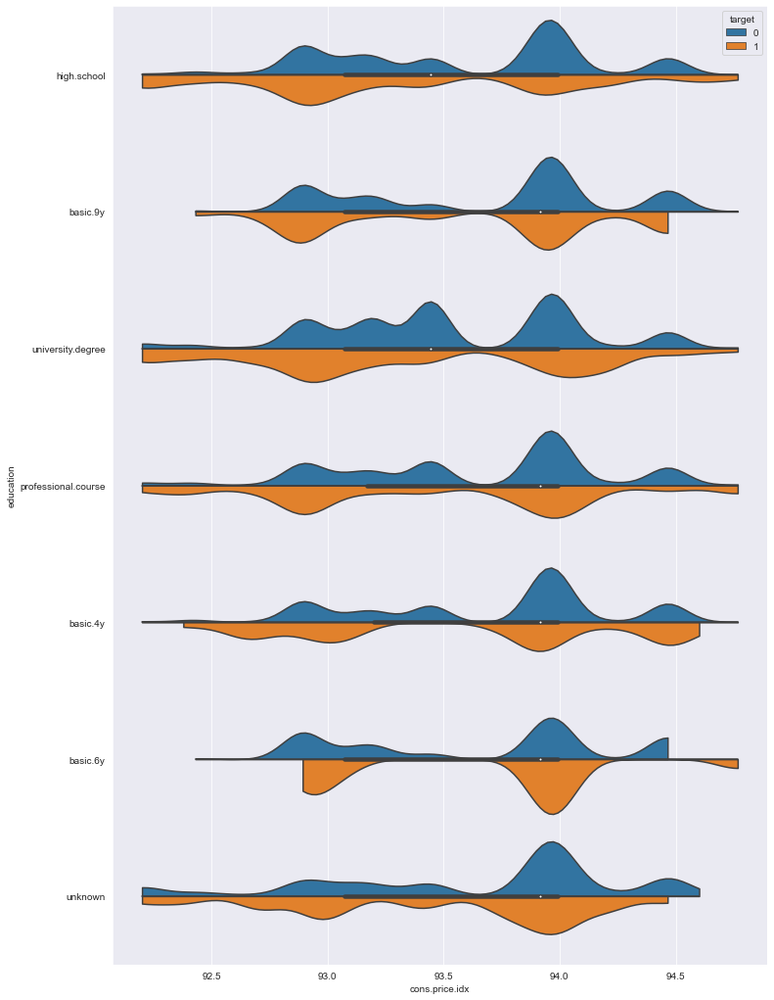

cons.conf.idx


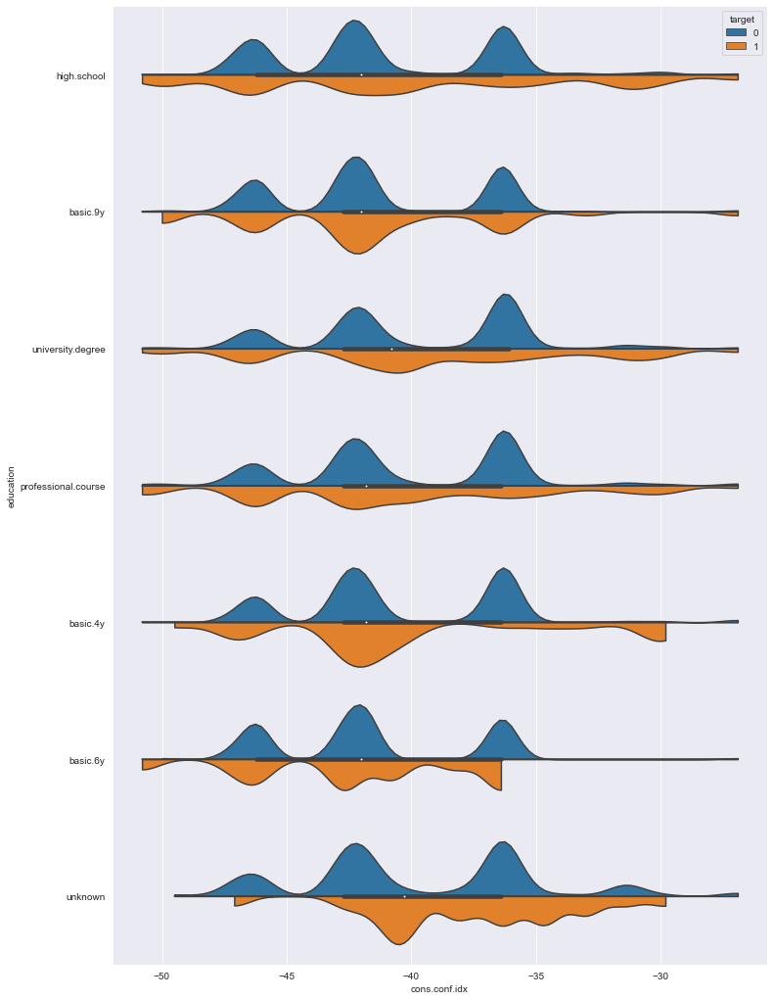

euribor3m


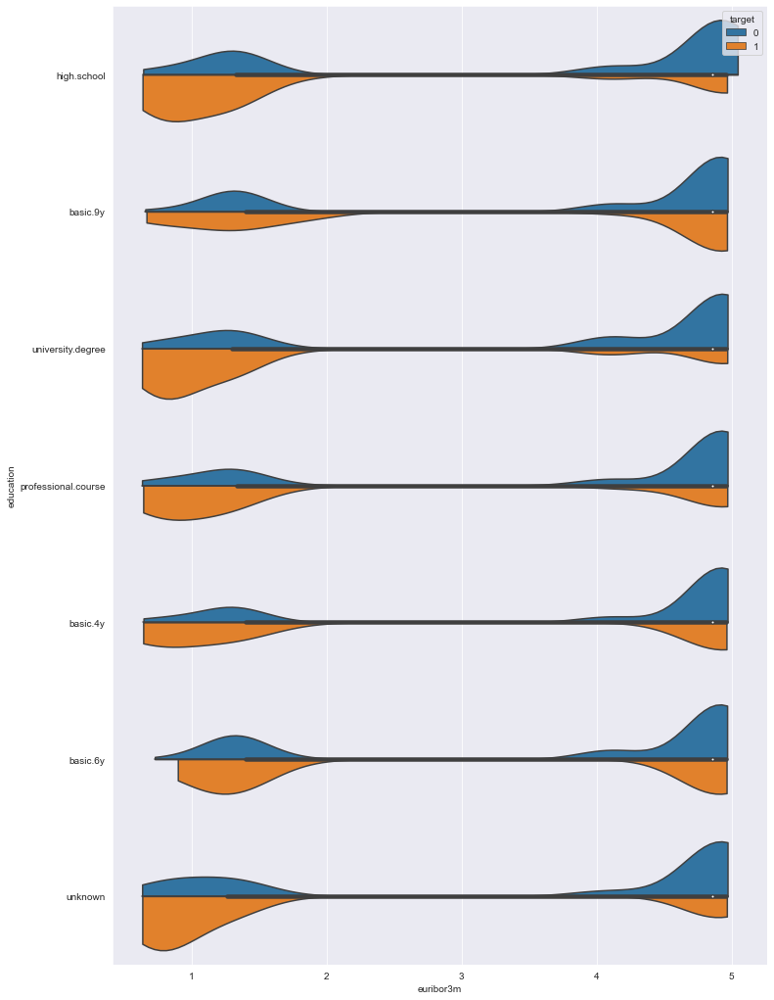

In [105]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,18))
    sns.violinplot(data=train_df, x=col, y="education", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('education')
    plt.show()

age


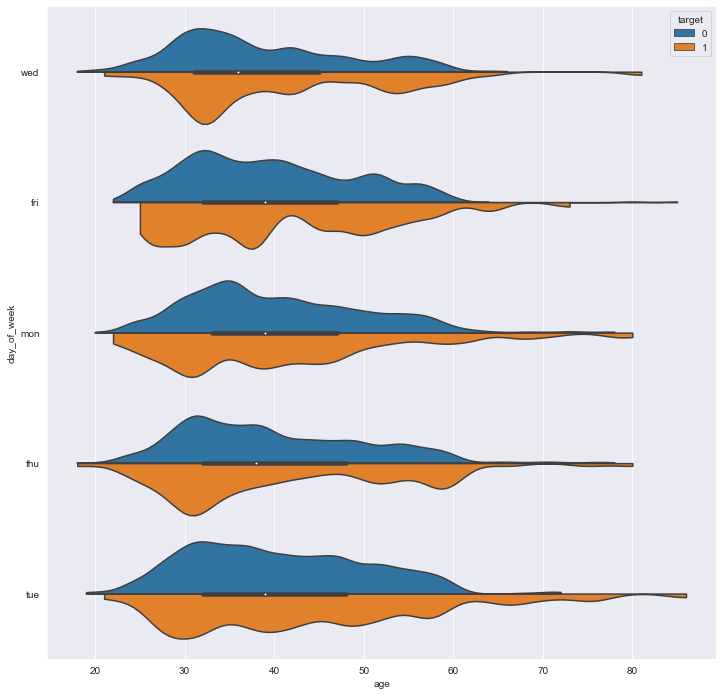

duration


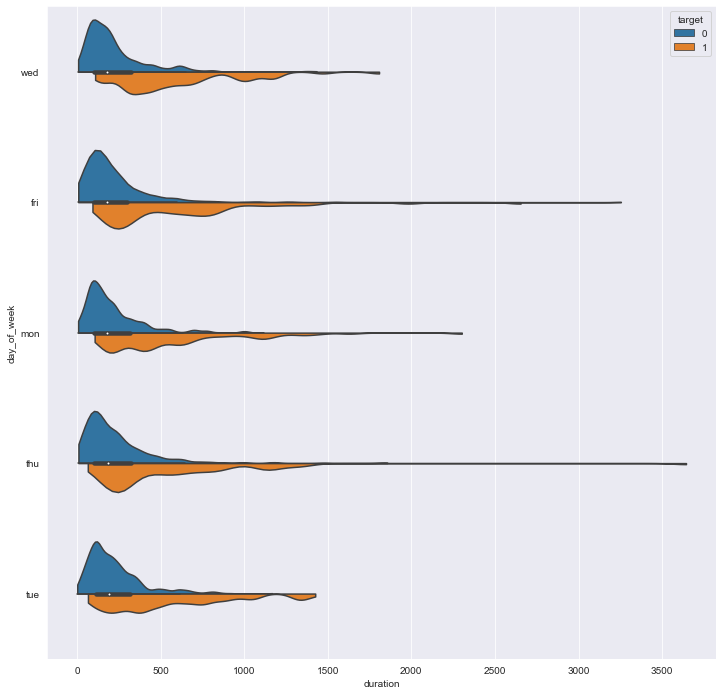

cons.price.idx


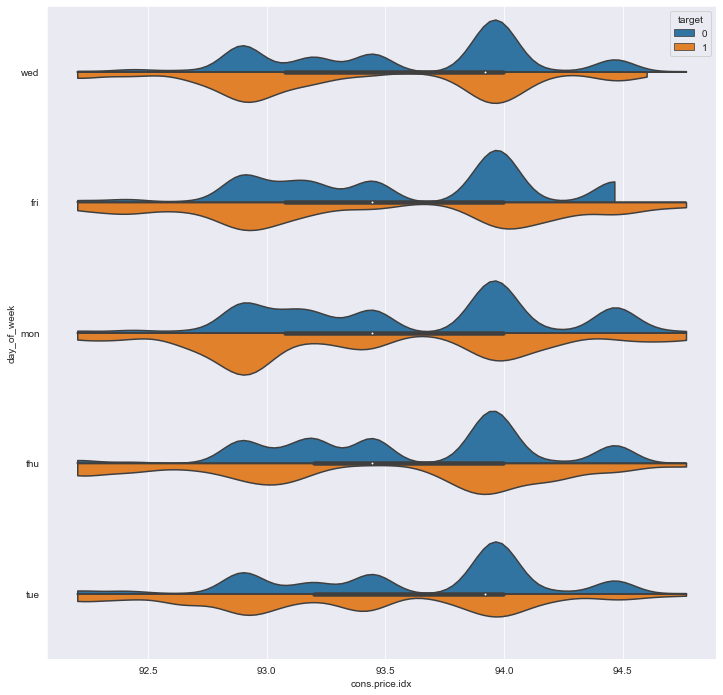

cons.conf.idx


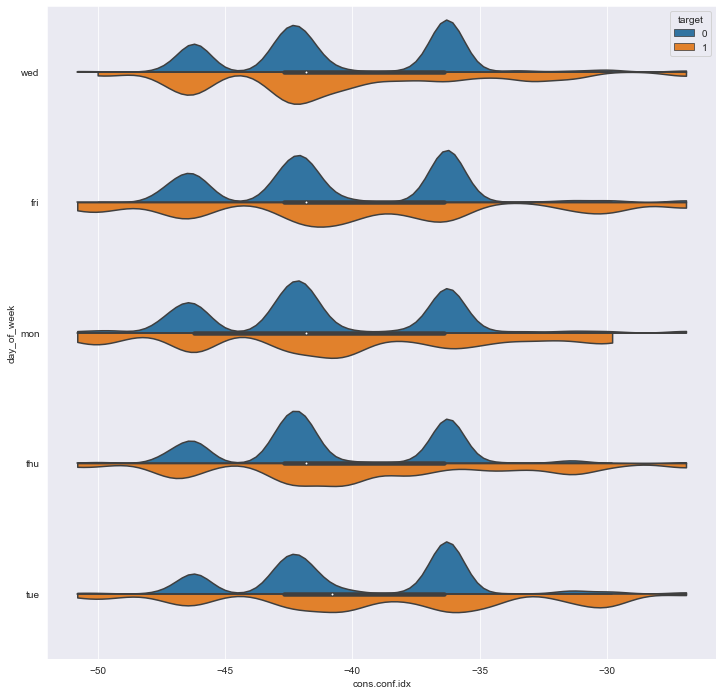

euribor3m


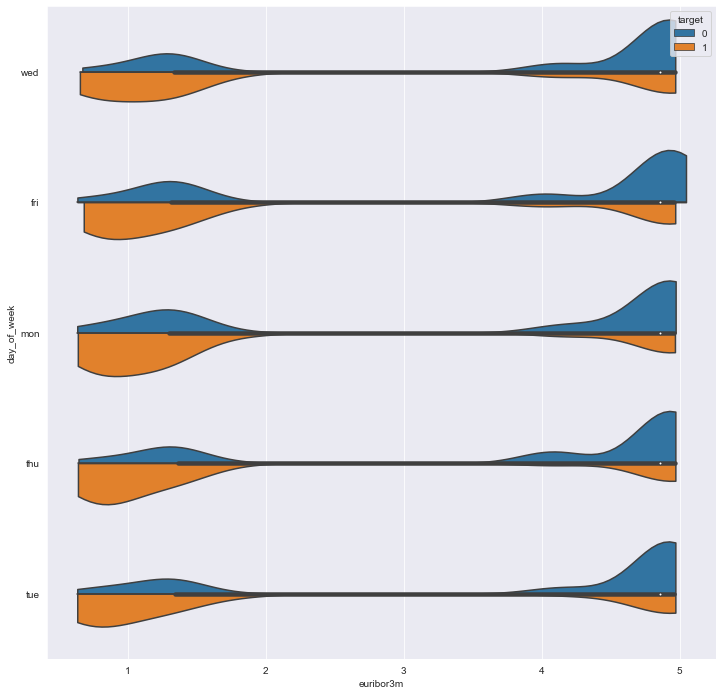

In [106]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,12))
    sns.violinplot(data=train_df, x=col, y="day_of_week", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('day_of_week')
    plt.show()

age


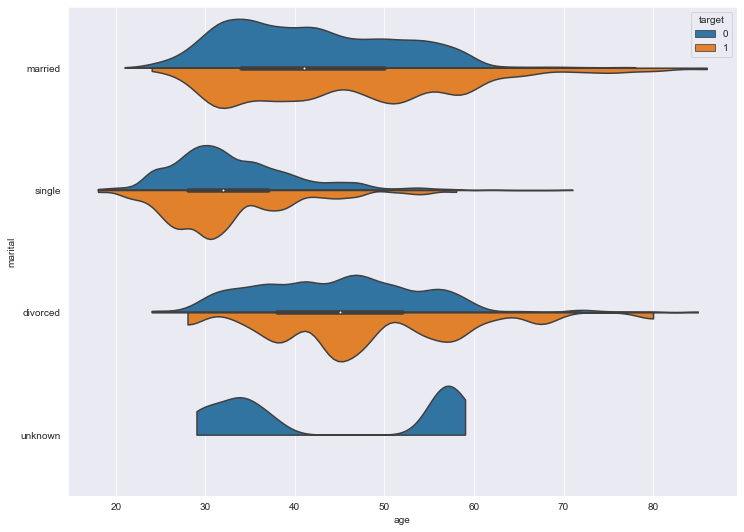

duration


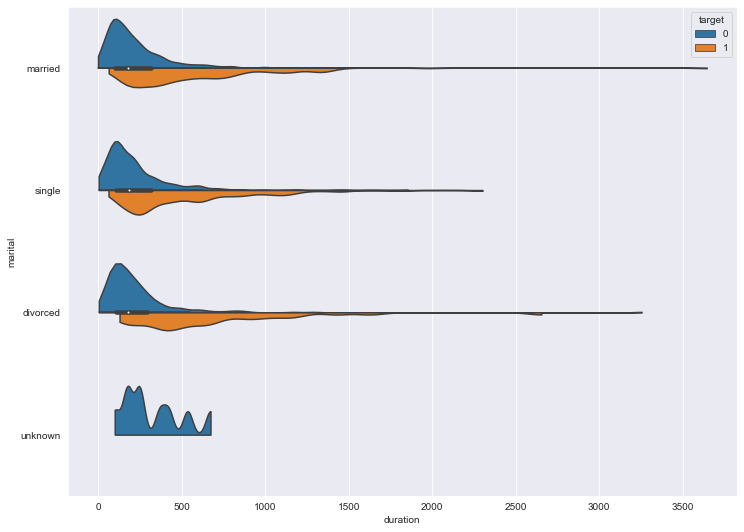

cons.price.idx


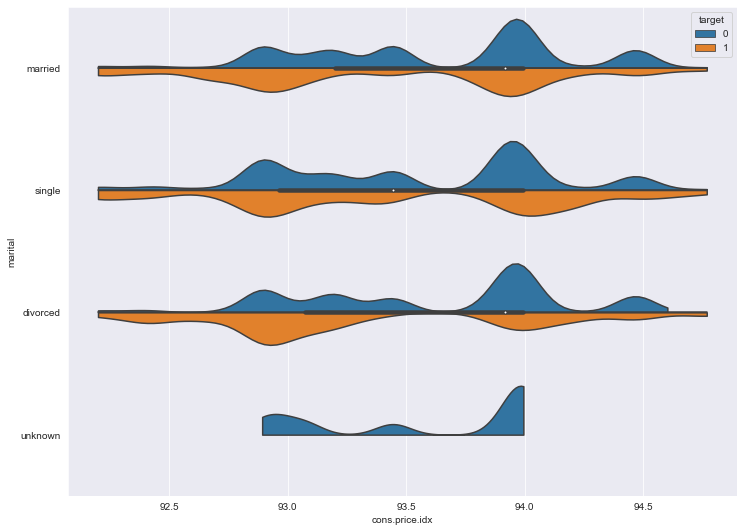

cons.conf.idx


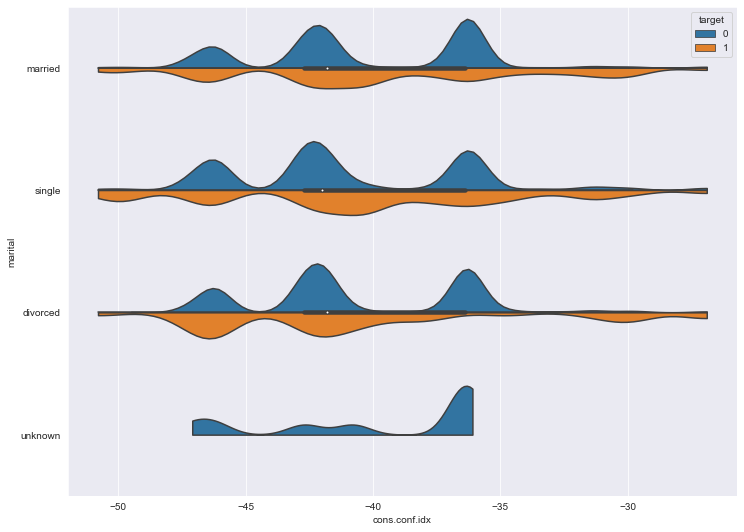

euribor3m


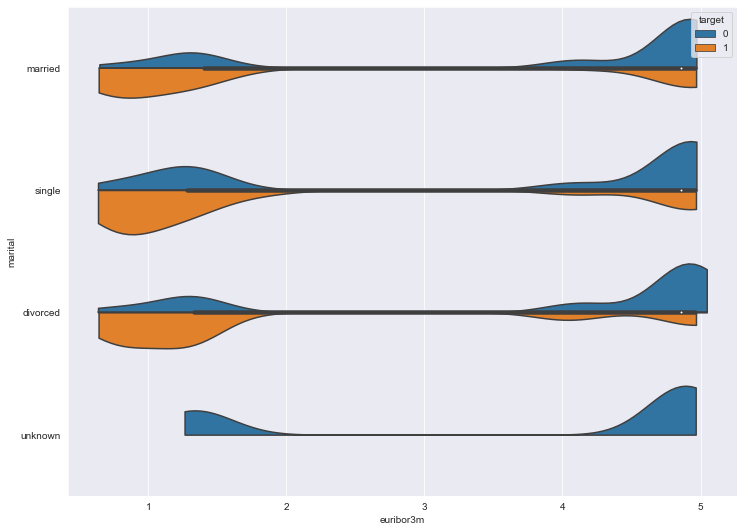

In [107]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="marital", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('marital')
    plt.show()

age


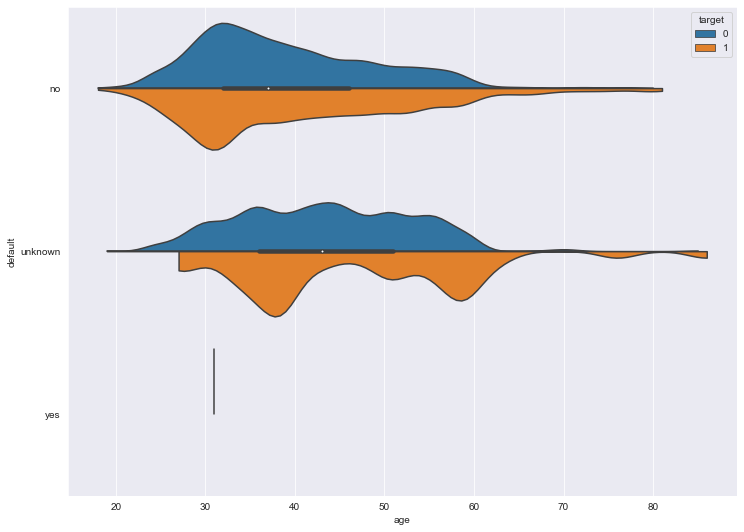

duration


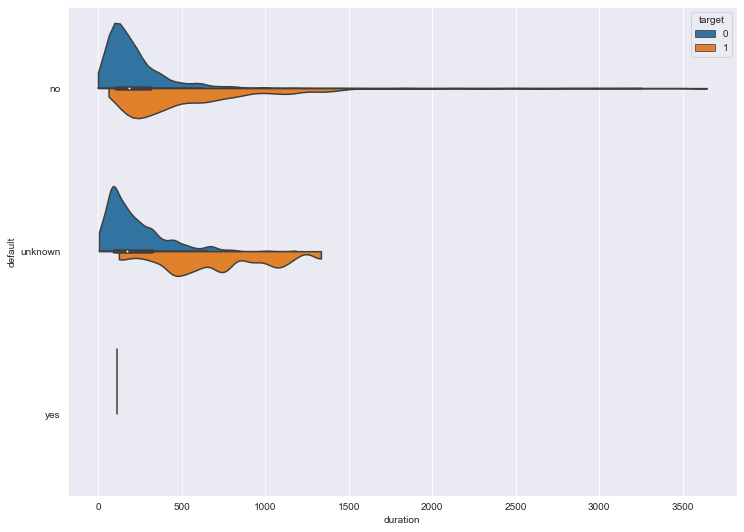

cons.price.idx


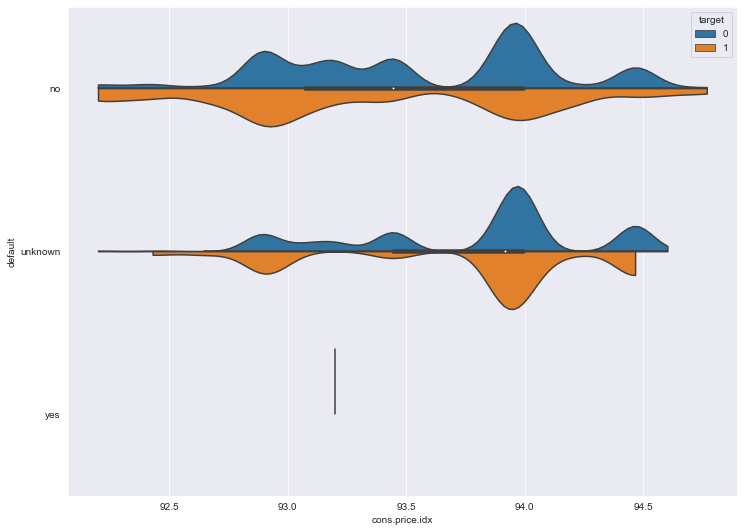

cons.conf.idx


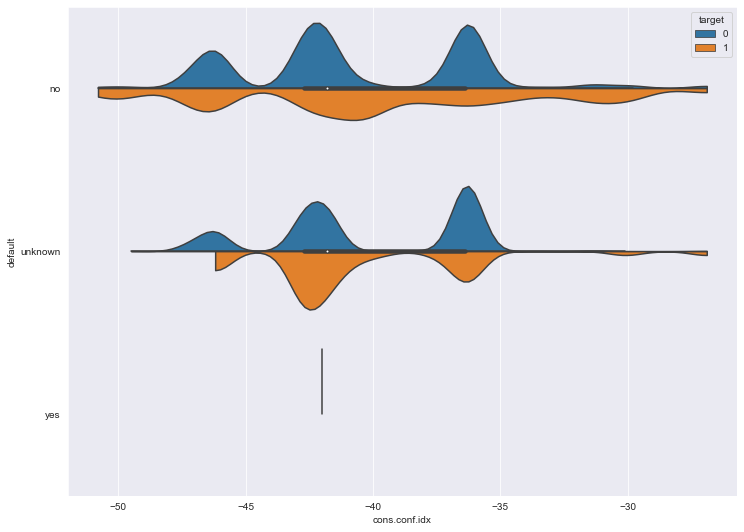

euribor3m


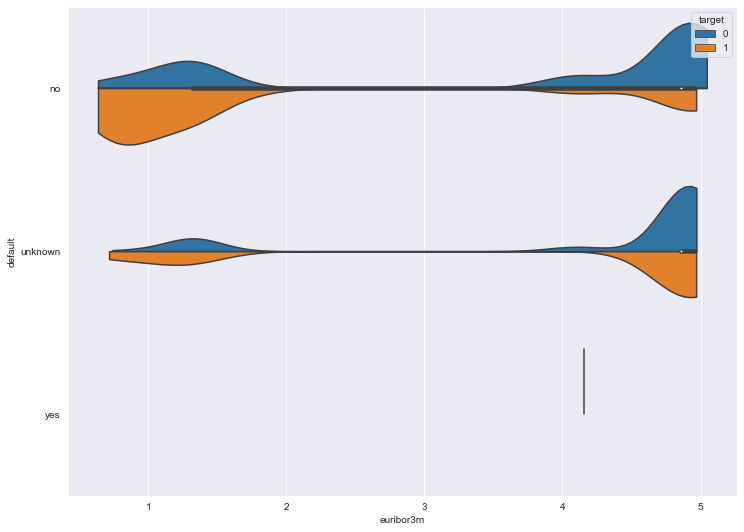

In [108]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="default", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('default')
    plt.show()

age


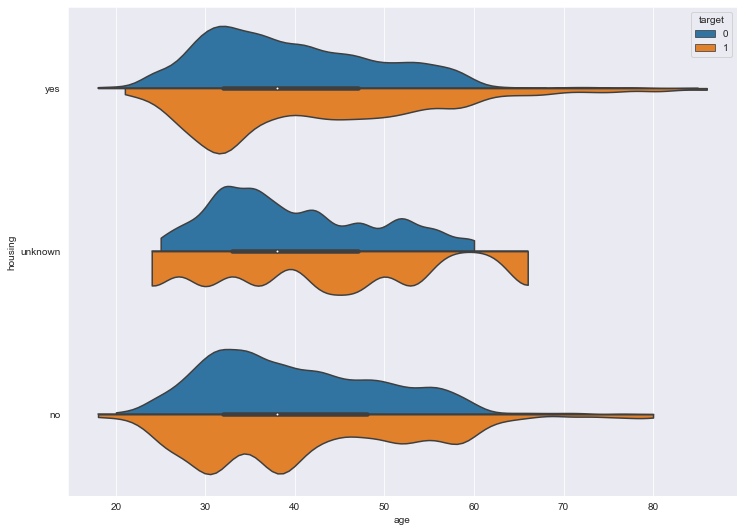

duration


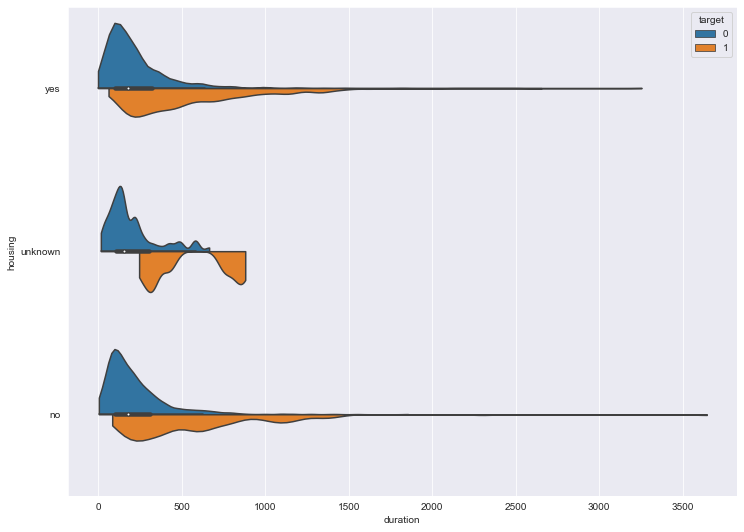

cons.price.idx


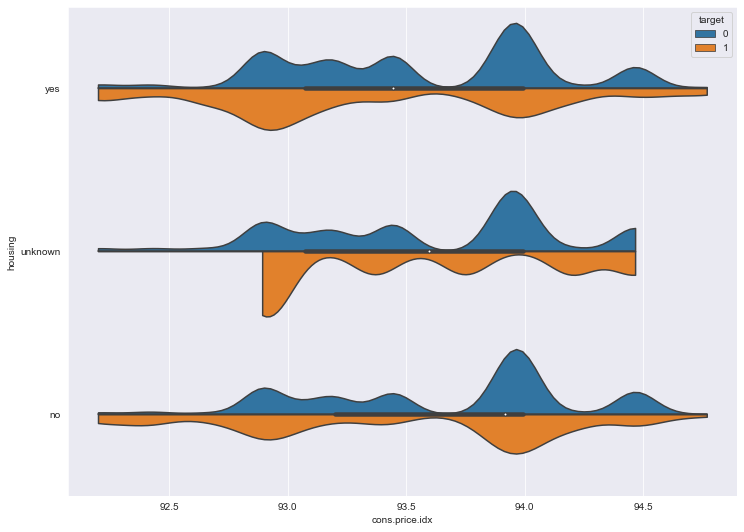

cons.conf.idx


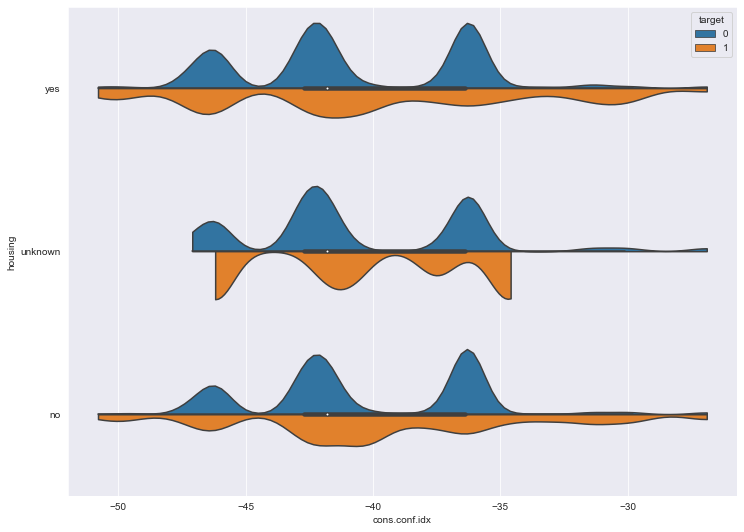

euribor3m


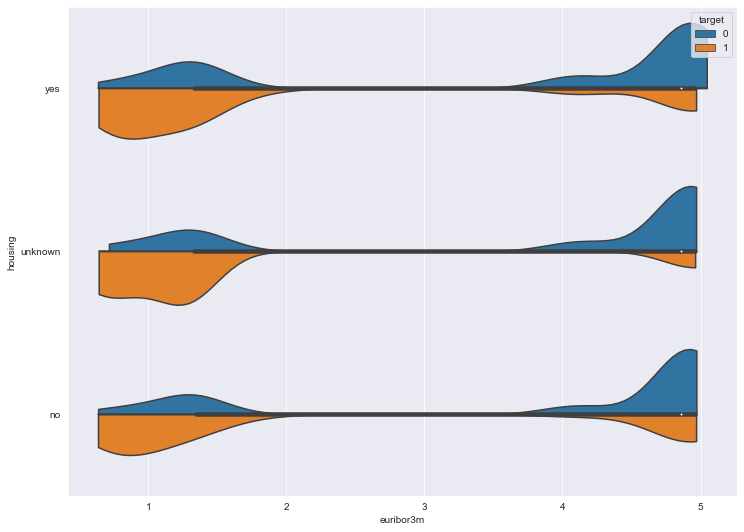

In [109]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="housing", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('housing')
    plt.show()

age


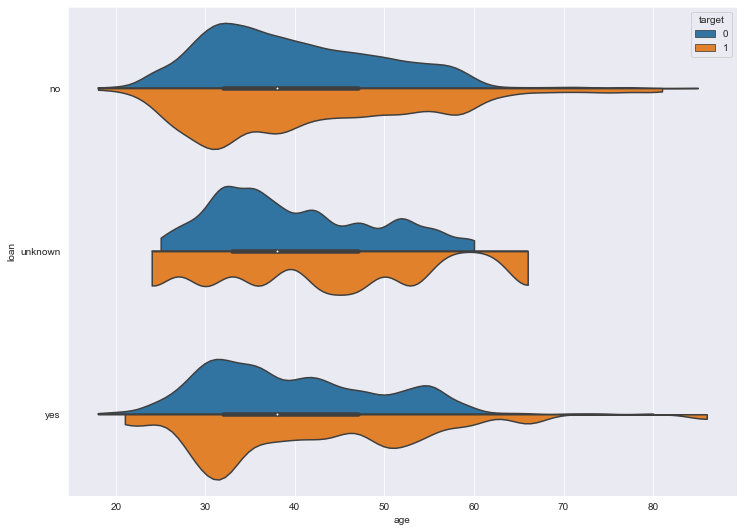

duration


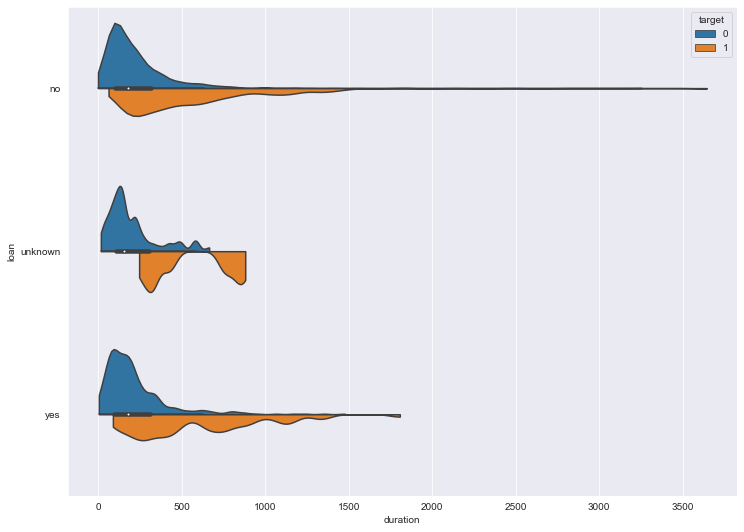

cons.price.idx


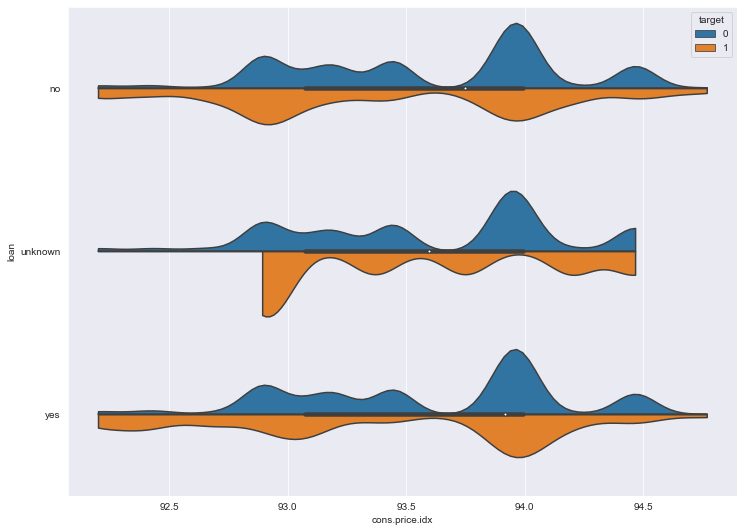

cons.conf.idx


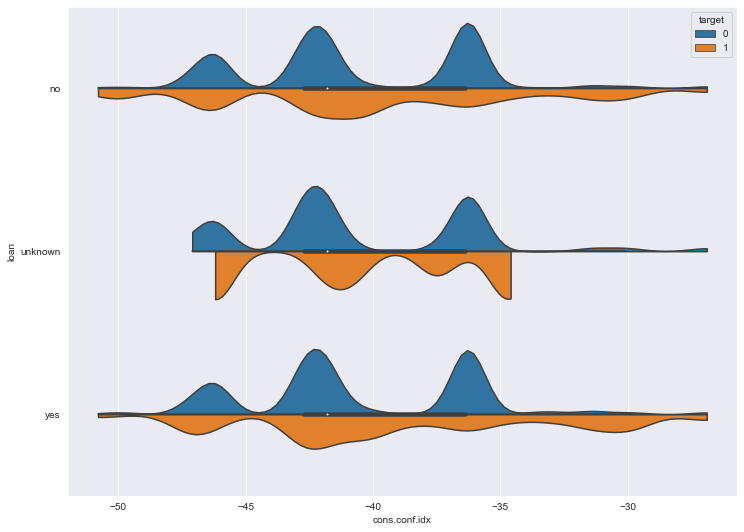

euribor3m


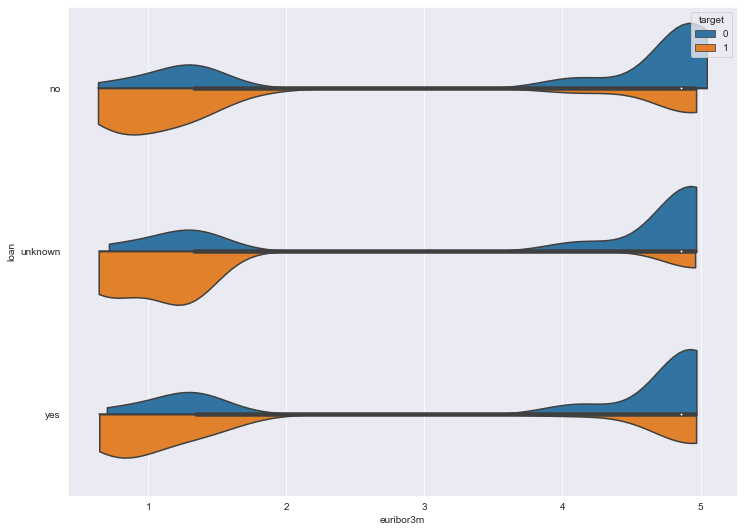

In [110]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="loan", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('loan')
    plt.show()

age


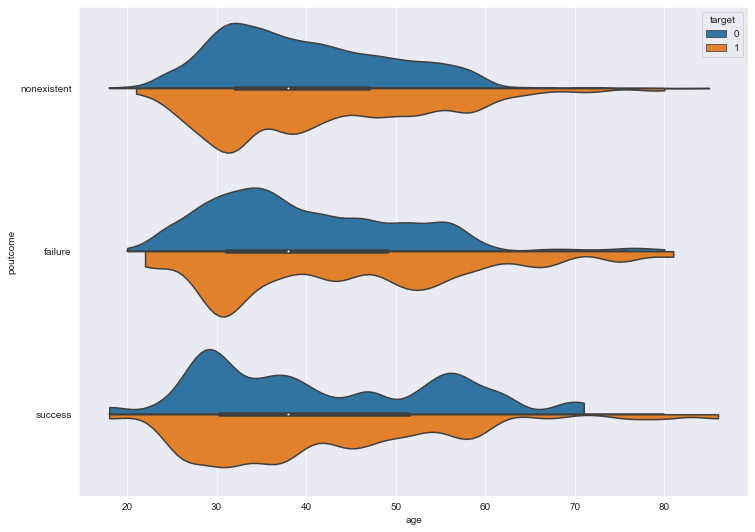

duration


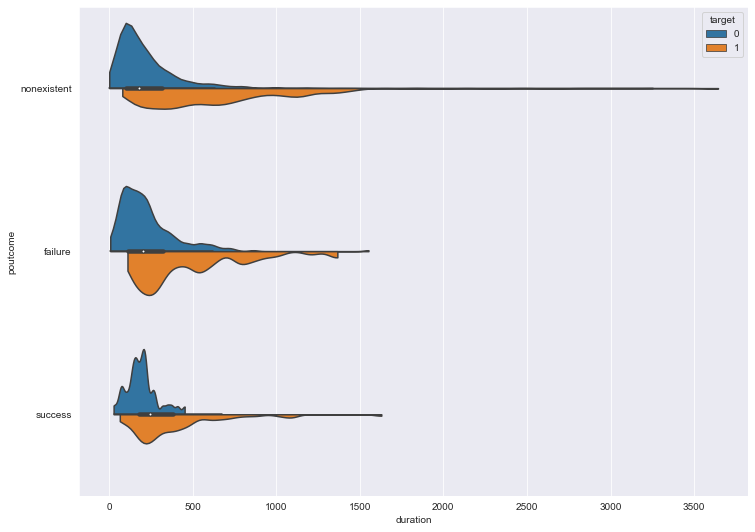

cons.price.idx


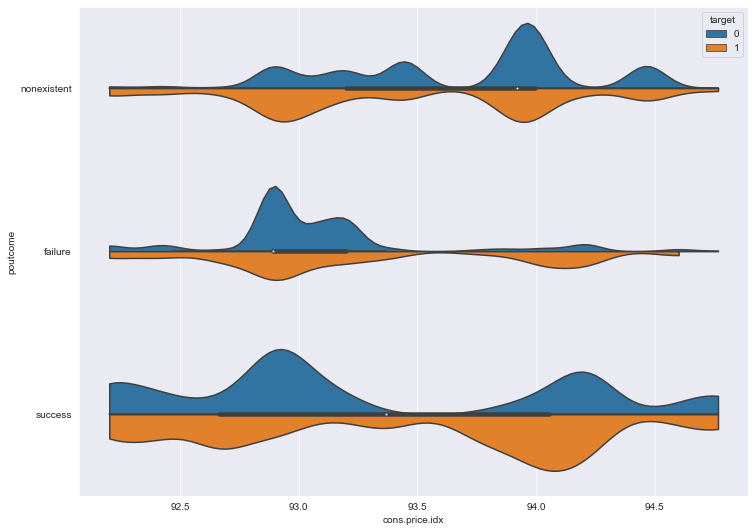

cons.conf.idx


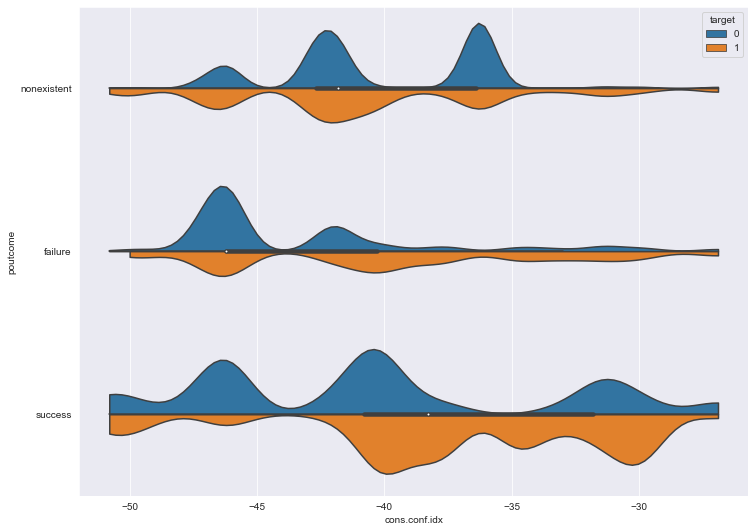

euribor3m


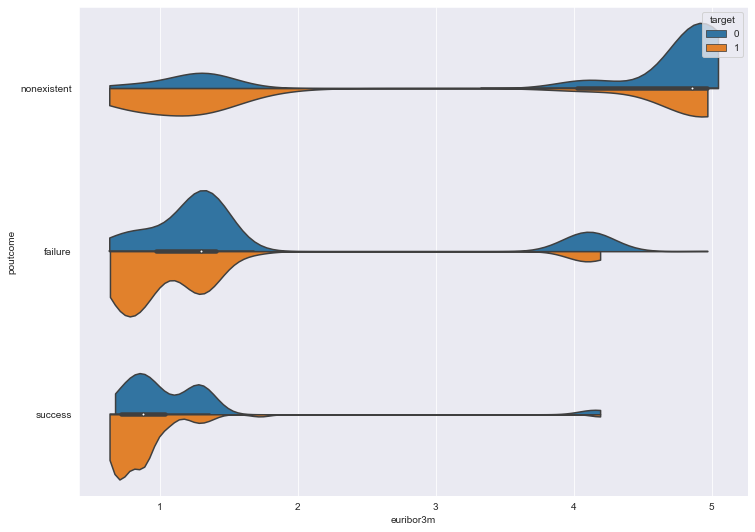

In [111]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="poutcome", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('poutcome')
    plt.show()

age


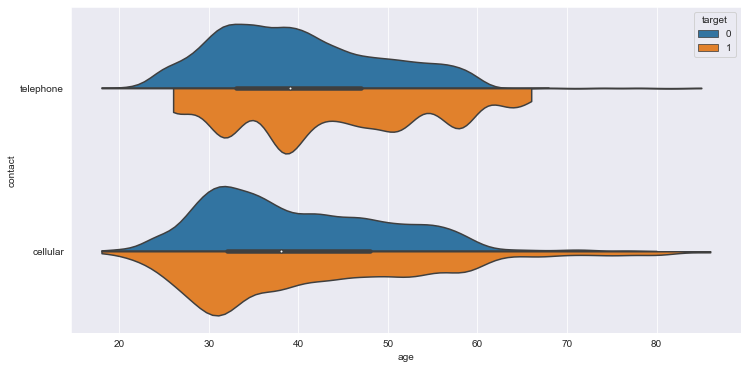

duration


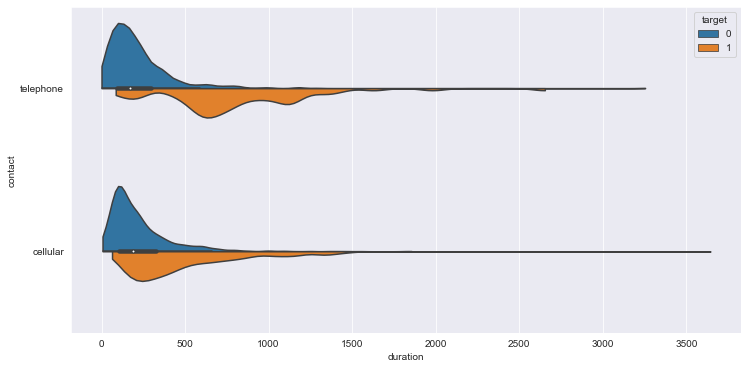

cons.price.idx


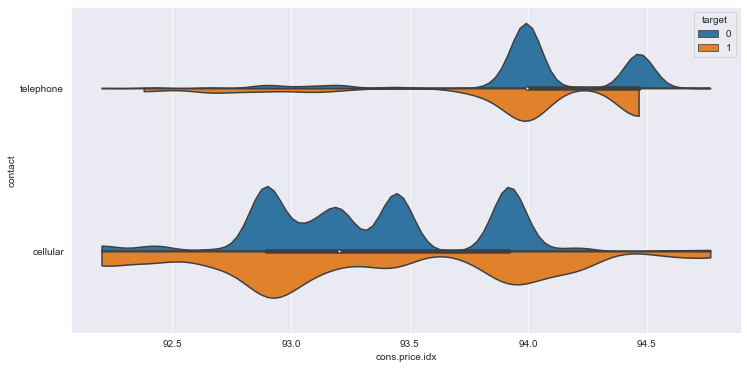

cons.conf.idx


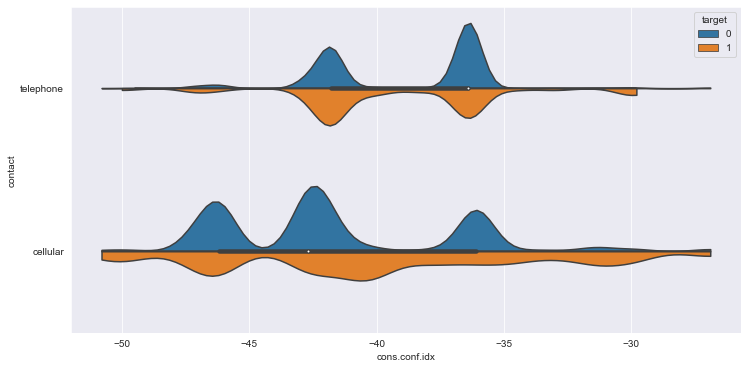

euribor3m


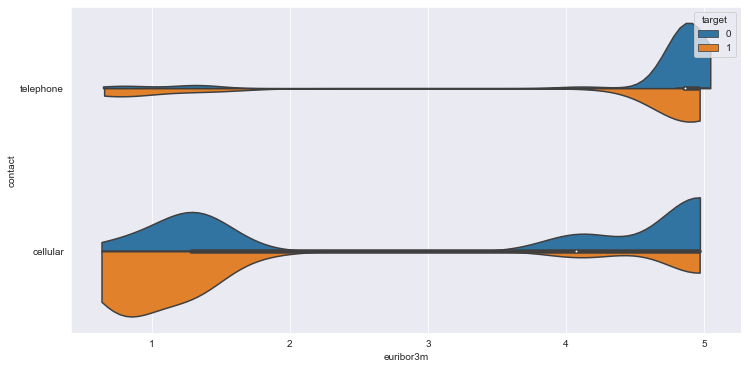

In [112]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,6))
    sns.violinplot(data=train_df, x=col, y="contact", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('contact')
    plt.show()

In [113]:
train_df.nfiufiug()

AttributeError: 'DataFrame' object has no attribute 'nfiufiug'

In [114]:
train_df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,25,services,married,high.school,no,yes,no,telephone,jun,wed,227,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,0
1,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,17,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,0
2,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,58,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,0
3,32,services,single,university.degree,no,no,no,cellular,sep,thu,128,3,999,2,failure,-1.1,94.199,-37.5,0.884,4963.6,0
4,32,admin.,single,university.degree,no,yes,no,cellular,sep,mon,290,4,999,0,nonexistent,-1.1,94.199,-37.5,0.879,4963.6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3114,31,technician,single,professional.course,no,yes,no,cellular,nov,thu,155,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
3115,30,admin.,married,basic.6y,no,yes,yes,cellular,jul,thu,53,1,999,0,nonexistent,1.4,93.918,-42.7,4.958,5228.1,0
3116,39,admin.,married,high.school,no,yes,no,telephone,jul,fri,219,1,999,0,nonexistent,1.4,93.918,-42.7,4.959,5228.1,0
3117,27,student,single,high.school,no,no,no,cellular,may,mon,64,2,999,1,failure,-1.8,92.893,-46.2,1.354,5099.1,0


In [115]:
val_df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,55,unemployed,married,university.degree,no,yes,no,cellular,nov,thu,303,2,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
1,50,blue-collar,single,basic.9y,unknown,yes,yes,telephone,may,thu,184,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,0
2,42,admin.,married,university.degree,no,no,no,cellular,nov,mon,226,2,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,0
3,41,blue-collar,married,basic.4y,no,yes,yes,cellular,may,wed,389,2,999,0,nonexistent,-1.8,92.893,-46.2,1.334,5099.1,0
4,50,blue-collar,married,basic.6y,no,yes,no,cellular,may,mon,293,3,3,1,success,-1.8,92.893,-46.2,1.354,5099.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,35,self-employed,unknown,university.degree,no,no,no,cellular,nov,thu,221,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
496,51,blue-collar,married,basic.6y,no,no,no,cellular,aug,fri,393,1,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,0
497,44,management,married,basic.9y,no,yes,no,cellular,aug,wed,260,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,0
498,52,self-employed,single,professional.course,no,no,yes,cellular,nov,thu,139,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0


In [116]:
test_df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,38,admin.,married,high.school,no,unknown,unknown,cellular,nov,thu,309,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
1,34,management,single,high.school,no,yes,no,cellular,nov,wed,175,1,999,0,nonexistent,-0.1,93.200,-42.0,4.120,5195.8,0
2,53,admin.,single,unknown,unknown,no,no,cellular,jul,tue,183,1,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,0
3,44,admin.,married,university.degree,no,no,no,cellular,aug,wed,96,2,4,1,success,-2.9,92.201,-31.4,0.879,5076.2,0
4,42,blue-collar,married,basic.4y,no,no,no,telephone,jun,tue,110,4,999,0,nonexistent,1.4,94.465,-41.8,4.864,5228.1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,33,admin.,divorced,university.degree,no,no,no,cellular,aug,thu,49,1,999,0,nonexistent,1.4,93.444,-36.1,4.962,5228.1,0
496,31,technician,married,professional.course,no,yes,no,cellular,jul,wed,225,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,0
497,25,admin.,single,university.degree,no,no,no,cellular,jul,fri,835,1,999,0,nonexistent,1.4,93.918,-42.7,4.957,5228.1,0
498,39,blue-collar,married,basic.6y,unknown,no,yes,cellular,jul,thu,122,1,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,0


In [117]:
# writing the train_df to a file

train_df.to_csv('../Data/Bank_Marketing_Data_Set/train_df.csv',index=False)

In [118]:
# writing the val_df to a file

val_df.to_csv('../Data/Bank_Marketing_Data_Set/val_df.csv',index=False)

In [119]:
# writing the test_df to a file

test_df.to_csv('../Data/Bank_Marketing_Data_Set/test_df.csv',index=False)

## Feature Engineering

In [120]:
# Preprocessing imports
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer,QuantileTransformer,PowerTransformer
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,LabelEncoder
from sklearn.preprocessing import StandardScaler,RobustScaler,MinMaxScaler

# Models
from sklearn.linear_model import LogisticRegression,SGDClassifier,RidgeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB,BernoulliNB,CategoricalNB,MultinomialNB
from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,IsolationForest,ExtraTreesClassifier,AdaBoostClassifier
from xgboost import XGBClassifier,XGBRFClassifier

# Cross-validation
from sklearn.model_selection import cross_val_score

# Hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Pipeline
from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.compose import ColumnTransformer,TransformedTargetRegressor

# Metrics
from sklearn.metrics import accuracy_score,classification_report,precision_score,recall_score,f1_score,precision_recall_curve

from imblearn.over_sampling import SMOTE

# Visualize Pipeline
from sklearn import set_config

# PCA - for dimensionality reduction
from sklearn.decomposition import PCA

# to calculate VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# To calculate the Verinces of each feature
from sklearn.feature_selection import VarianceThreshold

# Mutual Information for classification - For Feature Selection
from sklearn.feature_selection import mutual_info_classif

In [121]:
train_df = pd.read_csv('../Data/Bank_Marketing_Data_Set/train_df.csv')
X_train = train_df.drop('target',axis=1)
y_train = train_df['target']

In [122]:
val_df = pd.read_csv('../Data/Bank_Marketing_Data_Set/val_df.csv')
X_val = val_df.drop('target',axis=1)
y_val = val_df['target']

In [123]:
test_df = pd.read_csv('../Data/Bank_Marketing_Data_Set/test_df.csv')
X_test = test_df.drop('target',axis=1)
y_test = test_df['target']

In [124]:
train_df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,25,services,married,high.school,no,yes,no,telephone,jun,wed,227,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,0
1,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,17,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,0
2,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,58,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,0
3,32,services,single,university.degree,no,no,no,cellular,sep,thu,128,3,999,2,failure,-1.1,94.199,-37.5,0.884,4963.6,0
4,32,admin.,single,university.degree,no,yes,no,cellular,sep,mon,290,4,999,0,nonexistent,-1.1,94.199,-37.5,0.879,4963.6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3114,31,technician,single,professional.course,no,yes,no,cellular,nov,thu,155,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
3115,30,admin.,married,basic.6y,no,yes,yes,cellular,jul,thu,53,1,999,0,nonexistent,1.4,93.918,-42.7,4.958,5228.1,0
3116,39,admin.,married,high.school,no,yes,no,telephone,jul,fri,219,1,999,0,nonexistent,1.4,93.918,-42.7,4.959,5228.1,0
3117,27,student,single,high.school,no,no,no,cellular,may,mon,64,2,999,1,failure,-1.8,92.893,-46.2,1.354,5099.1,0


In [125]:
val_df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,55,unemployed,married,university.degree,no,yes,no,cellular,nov,thu,303,2,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
1,50,blue-collar,single,basic.9y,unknown,yes,yes,telephone,may,thu,184,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,0
2,42,admin.,married,university.degree,no,no,no,cellular,nov,mon,226,2,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,0
3,41,blue-collar,married,basic.4y,no,yes,yes,cellular,may,wed,389,2,999,0,nonexistent,-1.8,92.893,-46.2,1.334,5099.1,0
4,50,blue-collar,married,basic.6y,no,yes,no,cellular,may,mon,293,3,3,1,success,-1.8,92.893,-46.2,1.354,5099.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,35,self-employed,unknown,university.degree,no,no,no,cellular,nov,thu,221,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
496,51,blue-collar,married,basic.6y,no,no,no,cellular,aug,fri,393,1,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,0
497,44,management,married,basic.9y,no,yes,no,cellular,aug,wed,260,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,0
498,52,self-employed,single,professional.course,no,no,yes,cellular,nov,thu,139,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0


In [126]:
test_df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,38,admin.,married,high.school,no,unknown,unknown,cellular,nov,thu,309,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
1,34,management,single,high.school,no,yes,no,cellular,nov,wed,175,1,999,0,nonexistent,-0.1,93.200,-42.0,4.120,5195.8,0
2,53,admin.,single,unknown,unknown,no,no,cellular,jul,tue,183,1,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,0
3,44,admin.,married,university.degree,no,no,no,cellular,aug,wed,96,2,4,1,success,-2.9,92.201,-31.4,0.879,5076.2,0
4,42,blue-collar,married,basic.4y,no,no,no,telephone,jun,tue,110,4,999,0,nonexistent,1.4,94.465,-41.8,4.864,5228.1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,33,admin.,divorced,university.degree,no,no,no,cellular,aug,thu,49,1,999,0,nonexistent,1.4,93.444,-36.1,4.962,5228.1,0
496,31,technician,married,professional.course,no,yes,no,cellular,jul,wed,225,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,0
497,25,admin.,single,university.degree,no,no,no,cellular,jul,fri,835,1,999,0,nonexistent,1.4,93.918,-42.7,4.957,5228.1,0
498,39,blue-collar,married,basic.6y,unknown,no,yes,cellular,jul,thu,122,1,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,0


In [127]:
train_df['target'].value_counts(normalize=True)

0    0.889067
1    0.110933
Name: target, dtype: float64

In [128]:
numerical_features = ['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']

numerical_features

['age',
 'duration',
 'campaign',
 'pdays',
 'previous',
 'emp.var.rate',
 'cons.price.idx',
 'cons.conf.idx',
 'euribor3m',
 'nr.employed']

In [129]:
categorical_features

Index(['job', 'month', 'education', 'day_of_week', 'marital', 'default',
       'housing', 'loan', 'poutcome', 'contact'],
      dtype='object')

In [130]:
len(numerical_features)

10

In [131]:
len(categorical_features)

10

In [132]:
train_df[categorical_features].nunique()

job            12
month          10
education       7
day_of_week     5
marital         4
default         3
housing         3
loan            3
poutcome        3
contact         2
dtype: int64

In [133]:
numeric_processor=Pipeline([("imputation_mean",SimpleImputer(strategy='median',add_indicator=True)),
                           ("quantiletransformer",QuantileTransformer(output_distribution='normal'))])

categorical_processor=Pipeline([("imputation_consatnt",SimpleImputer(fill_value="missing",strategy="constant")),
                                ("onehotencoder",OneHotEncoder(handle_unknown='ignore',sparse_output=False))])

preprocessor=ColumnTransformer([("numeric_processor",numeric_processor,numerical_features),
                               ("categorical_processor",categorical_processor,categorical_features)])

final_pipe=Pipeline([("preprocessor",preprocessor),
                     ("scaler",RobustScaler())])

In [134]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['age', 'duration',
                                                   'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euri...
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index(['job', 'month', 'education', 'day_of_week', 'marital', 'default',
       'housing', 'loan', 'poutcome', 'contact'],
      dtype='object'))])),
                ('scaler', RobustScaler())])

In [135]:
X_train

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,25,services,married,high.school,no,yes,no,telephone,jun,wed,227,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1
1,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,17,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1
2,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,58,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8
3,32,services,single,university.degree,no,no,no,cellular,sep,thu,128,3,999,2,failure,-1.1,94.199,-37.5,0.884,4963.6
4,32,admin.,single,university.degree,no,yes,no,cellular,sep,mon,290,4,999,0,nonexistent,-1.1,94.199,-37.5,0.879,4963.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3114,31,technician,single,professional.course,no,yes,no,cellular,nov,thu,155,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8
3115,30,admin.,married,basic.6y,no,yes,yes,cellular,jul,thu,53,1,999,0,nonexistent,1.4,93.918,-42.7,4.958,5228.1
3116,39,admin.,married,high.school,no,yes,no,telephone,jul,fri,219,1,999,0,nonexistent,1.4,93.918,-42.7,4.959,5228.1
3117,27,student,single,high.school,no,no,no,cellular,may,mon,64,2,999,1,failure,-1.8,92.893,-46.2,1.354,5099.1


In [136]:
y_train

0       0
1       0
2       0
3       0
4       0
       ..
3114    0
3115    0
3116    0
3117    0
3118    0
Name: target, Length: 3119, dtype: int64

In [137]:
X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

In [138]:
X_train_FE

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,-1.388699,0.209892,-0.910699,0.0,0.000000,0.843243,1.099979,0.000000,0.617135,0.908500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0
1,0.000000,-1.490065,0.089301,0.0,0.000000,0.843243,1.099979,0.000000,0.343057,0.908500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0
2,0.510679,-0.980117,-0.910699,0.0,0.000000,-0.057831,-0.337082,-0.221888,-0.178967,0.058995,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.489321,-0.310877,0.089301,0.0,7.263113,-0.083780,0.814150,0.238370,-1.054705,-0.840931,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0
4,-0.489321,0.431869,0.153191,0.0,0.000000,-0.083780,0.814150,0.238370,-1.117100,-0.840931,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [139]:
X_val

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,55,unemployed,married,university.degree,no,yes,no,cellular,nov,thu,303,2,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8
1,50,blue-collar,single,basic.9y,unknown,yes,yes,telephone,may,thu,184,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0
2,42,admin.,married,university.degree,no,no,no,cellular,nov,mon,226,2,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8
3,41,blue-collar,married,basic.4y,no,yes,yes,cellular,may,wed,389,2,999,0,nonexistent,-1.8,92.893,-46.2,1.334,5099.1
4,50,blue-collar,married,basic.6y,no,yes,no,cellular,may,mon,293,3,3,1,success,-1.8,92.893,-46.2,1.354,5099.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,35,self-employed,unknown,university.degree,no,no,no,cellular,nov,thu,221,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8
496,51,blue-collar,married,basic.6y,no,no,no,cellular,aug,fri,393,1,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1
497,44,management,married,basic.9y,no,yes,no,cellular,aug,wed,260,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1
498,52,self-employed,single,professional.course,no,no,yes,cellular,nov,thu,139,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8


In [140]:
y_val

0      0
1      0
2      0
3      0
4      1
      ..
495    0
496    0
497    0
498    0
499    0
Name: target, Length: 500, dtype: int64

In [141]:
X_val_FE = pd.DataFrame(final_pipe.transform(X_val),columns=final_pipe.get_feature_names_out(X_val.columns))

In [142]:
X_val_FE

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,0.998369,0.466459,0.000000,0.000000,0.00000,-0.057831,-0.337082,-0.221888,-0.286095,0.058995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.673778,0.014864,-0.910699,0.000000,0.00000,0.000000,0.510176,0.474544,-0.142165,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,-1.0,1.0
2,0.243686,0.205063,0.000000,0.000000,0.00000,-0.057831,-0.337082,-0.221888,-0.178967,0.058995,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.182039,0.686703,0.000000,0.000000,0.00000,-0.156757,-0.805335,-0.998816,-0.522620,-0.091500,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.673778,0.440703,0.089301,-7.564585,6.55196,-0.156757,-0.805335,-0.998816,-0.472423,-0.091500,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [143]:
X_test

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,38,admin.,married,high.school,no,unknown,unknown,cellular,nov,thu,309,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8
1,34,management,single,high.school,no,yes,no,cellular,nov,wed,175,1,999,0,nonexistent,-0.1,93.200,-42.0,4.120,5195.8
2,53,admin.,single,unknown,unknown,no,no,cellular,jul,tue,183,1,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1
3,44,admin.,married,university.degree,no,no,no,cellular,aug,wed,96,2,4,1,success,-2.9,92.201,-31.4,0.879,5076.2
4,42,blue-collar,married,basic.4y,no,no,no,telephone,jun,tue,110,4,999,0,nonexistent,1.4,94.465,-41.8,4.864,5228.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,33,admin.,divorced,university.degree,no,no,no,cellular,aug,thu,49,1,999,0,nonexistent,1.4,93.444,-36.1,4.962,5228.1
496,31,technician,married,professional.course,no,yes,no,cellular,jul,wed,225,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1
497,25,admin.,single,university.degree,no,no,no,cellular,jul,fri,835,1,999,0,nonexistent,1.4,93.918,-42.7,4.957,5228.1
498,39,blue-collar,married,basic.6y,unknown,no,yes,cellular,jul,thu,122,1,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1


In [144]:
y_test

0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    0
497    0
498    0
499    0
Name: target, Length: 500, dtype: int64

In [145]:
X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

In [146]:
X_test_FE

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,0.000000,0.478977,-0.910699,0.000000,0.00000,-0.057831,-0.337082,-0.221888,-0.286095,0.058995,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.297728,-0.029734,-0.910699,0.000000,0.00000,-0.057831,-0.337082,-0.221888,-0.241907,0.058995,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.854116,0.010218,-0.910699,0.000000,0.00000,0.843243,0.161914,-0.525456,0.477380,0.908500,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.0,1.0,0.0,-1.0,1.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.353251,-0.557851,0.000000,-7.295858,6.55196,-0.272706,-3.737035,1.552743,-1.117100,-0.173812,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0
4,0.243686,-0.447742,0.153191,0.000000,0.00000,0.843243,1.099979,0.000000,0.193375,0.908500,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [147]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [148]:
results = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results = results.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      2773
           1       0.71      0.48      0.57       346

    accuracy                           0.92      3119
   macro avg       0.82      0.73      0.76      3119
weighted avg       0.91      0.92      0.91      3119

              precision    recall  f1-score   support

           0       0.92      0.98      0.95       447
           1       0.59      0.30      0.40        53

    accuracy                           0.90       500
   macro avg       0.76      0.64      0.67       500
weighted avg       0.89      0.90      0.89       500

train_score :  0.9198461045206797
val_score :  0.904
RidgeClassifier
              precision    recall  f1-score   support

           0       0.92      0.98      0.95      2773
           1       0.68      0.28      0.39       346

    accuracy                           0.91      3119
   macro avg       0.80      0.63      0

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2773
           1       1.00      1.00      1.00       346

    accuracy                           1.00      3119
   macro avg       1.00      1.00      1.00      3119
weighted avg       1.00      1.00      1.00      3119

              precision    recall  f1-score   support

           0       0.94      0.96      0.95       447
           1       0.59      0.51      0.55        53

    accuracy                           0.91       500
   macro avg       0.76      0.73      0.75       500
weighted avg       0.91      0.91      0.91       500

train_score :  0.9996793844180827
val_score :  0.91


In [149]:
results.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.745055,0.919846,0.821195,0.725998,0.762390,0.904000
1,RidgeClassifier,0.668947,0.905418,0.798451,0.630614,0.671478,0.900000
2,SGDClassifier,0.656259,0.901571,0.792791,0.601890,0.637561,0.900000
3,SVC,0.640857,0.921449,0.888939,0.672514,0.728181,0.896000
4,GaussianNB,0.580387,0.654697,0.591336,0.724860,0.554705,0.654000
5,KNeighborsClassifier,0.630132,0.920487,0.858173,0.687150,0.738019,0.890000
6,DecisionTreeClassifier,0.723019,1.000000,1.000000,1.000000,1.000000,0.878000
7,RandomForestClassifier,0.695127,1.000000,1.000000,1.000000,1.000000,0.898000
8,AdaBoostClassifier,0.734878,0.920808,0.828210,0.722745,0.761920,0.920000
9,ExtraTreesClassifier,0.665504,1.000000,1.000000,1.000000,1.000000,0.890000


In [150]:
results.sort_values(by=['cv_results'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.745055,0.919846,0.821195,0.725998,0.76239,0.904
11,XGBClassifier,0.744842,0.999679,0.99982,0.998555,0.999186,0.91
10,GradientBoostingClassifier,0.741269,0.950625,0.909946,0.824253,0.860497,0.91
8,AdaBoostClassifier,0.734878,0.920808,0.82821,0.722745,0.76192,0.92
6,DecisionTreeClassifier,0.723019,1.0,1.0,1.0,1.0,0.878
7,RandomForestClassifier,0.695127,1.0,1.0,1.0,1.0,0.898
1,RidgeClassifier,0.668947,0.905418,0.798451,0.630614,0.671478,0.9
9,ExtraTreesClassifier,0.665504,1.0,1.0,1.0,1.0,0.89
2,SGDClassifier,0.656259,0.901571,0.792791,0.60189,0.637561,0.9
3,SVC,0.640857,0.921449,0.888939,0.672514,0.728181,0.896


In [151]:
results.sort_values(by=['Val_Accuracy'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
8,AdaBoostClassifier,0.734878,0.920808,0.82821,0.722745,0.76192,0.92
10,GradientBoostingClassifier,0.741269,0.950625,0.909946,0.824253,0.860497,0.91
11,XGBClassifier,0.744842,0.999679,0.99982,0.998555,0.999186,0.91
0,LogisticRegression,0.745055,0.919846,0.821195,0.725998,0.76239,0.904
1,RidgeClassifier,0.668947,0.905418,0.798451,0.630614,0.671478,0.9
2,SGDClassifier,0.656259,0.901571,0.792791,0.60189,0.637561,0.9
7,RandomForestClassifier,0.695127,1.0,1.0,1.0,1.0,0.898
3,SVC,0.640857,0.921449,0.888939,0.672514,0.728181,0.896
5,KNeighborsClassifier,0.630132,0.920487,0.858173,0.68715,0.738019,0.89
9,ExtraTreesClassifier,0.665504,1.0,1.0,1.0,1.0,0.89


In [152]:
# writing results to a file

results.to_csv('../Data/Bank_Marketing_Data_Set/results.csv',index=False)

## Handling Imbalanced dataset

In [153]:
X_train_FE

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,-1.388699,0.209892,-0.910699,0.0,0.000000,0.843243,1.099979,0.000000,0.617135,0.908500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0
1,0.000000,-1.490065,0.089301,0.0,0.000000,0.843243,1.099979,0.000000,0.343057,0.908500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0
2,0.510679,-0.980117,-0.910699,0.0,0.000000,-0.057831,-0.337082,-0.221888,-0.178967,0.058995,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.489321,-0.310877,0.089301,0.0,7.263113,-0.083780,0.814150,0.238370,-1.054705,-0.840931,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0
4,-0.489321,0.431869,0.153191,0.0,0.000000,-0.083780,0.814150,0.238370,-1.117100,-0.840931,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [154]:
y_train

0       0
1       0
2       0
3       0
4       0
       ..
3114    0
3115    0
3116    0
3117    0
3118    0
Name: target, Length: 3119, dtype: int64

In [155]:
y_train.value_counts()

0    2773
1     346
Name: target, dtype: int64

In [156]:
y_train.value_counts(normalize=True)

0    0.889067
1    0.110933
Name: target, dtype: float64

In [157]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_FE, y_train)

In [158]:
X_train_balanced

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,-1.388699,0.209892,-0.910699,0.0,0.000000,0.843243,1.099979,0.000000,0.617135,0.908500,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.00000,1.00000
1,0.000000,-1.490065,0.089301,0.0,0.000000,0.843243,1.099979,0.000000,0.343057,0.908500,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,1.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.00000,1.00000
2,0.510679,-0.980117,-0.910699,0.0,0.000000,-0.057831,-0.337082,-0.221888,-0.178967,0.058995,1.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000
3,-0.489321,-0.310877,0.089301,0.0,7.263113,-0.083780,0.814150,0.238370,-1.054705,-0.840931,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,0.000000,0.0,1.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,-1.000000,1.000000,0.0,0.00000,0.00000,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.00000,0.00000
4,-0.489321,0.431869,0.153191,0.0,0.000000,-0.083780,0.814150,0.238370,-1.117100,-0.840931,1.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0

In [159]:
y_train_balanced

0       0
1       0
2       0
3       0
4       0
       ..
5541    1
5542    1
5543    1
5544    1
5545    1
Name: target, Length: 5546, dtype: int64

In [160]:
y_train_balanced.value_counts()

0    2773
1    2773
Name: target, dtype: int64

In [161]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [162]:
results2 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_balanced, y_train_balanced, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_balanced,y_train_balanced)
    y_train_pred = model.predict(X_train_balanced)
    train_score = accuracy_score(y_train_balanced,y_train_pred)
    
    precision = precision_score(y_train_balanced,y_train_pred,average='macro')
    recall = recall_score(y_train_balanced,y_train_pred,average='macro')
    f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train_balanced,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results2 = results2.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.92      0.87      0.89      2773
           1       0.87      0.92      0.90      2773

    accuracy                           0.90      5546
   macro avg       0.90      0.90      0.90      5546
weighted avg       0.90      0.90      0.90      5546

              precision    recall  f1-score   support

           0       0.97      0.86      0.91       447
           1       0.40      0.81      0.54        53

    accuracy                           0.85       500
   macro avg       0.69      0.83      0.72       500
weighted avg       0.91      0.85      0.87       500

train_score :  0.8954201226108908
val_score :  0.852
RidgeClassifier
              precision    recall  f1-score   support

           0       0.93      0.84      0.89      2773
           1       0.86      0.94      0.90      2773

    accuracy                           0.89      5546
   macro avg       0.90      0.89      0

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2773
           1       1.00      1.00      1.00      2773

    accuracy                           1.00      5546
   macro avg       1.00      1.00      1.00      5546
weighted avg       1.00      1.00      1.00      5546

              precision    recall  f1-score   support

           0       0.94      0.96      0.95       447
           1       0.56      0.47      0.51        53

    accuracy                           0.90       500
   macro avg       0.75      0.71      0.73       500
weighted avg       0.90      0.90      0.90       500

train_score :  1.0
val_score :  0.904


In [163]:
results2.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.888486,0.895420,0.896676,0.895420,0.895337,0.852000
1,RidgeClassifier,0.889922,0.891634,0.895354,0.891634,0.891378,0.826000
2,SGDClassifier,0.869907,0.885503,0.891493,0.885503,0.885063,0.820000
3,SVC,0.913023,0.933285,0.936951,0.933285,0.933145,0.866000
4,GaussianNB,0.694521,0.681392,0.723274,0.681392,0.665716,0.498000
5,KNeighborsClassifier,0.884176,0.926974,0.936281,0.926974,0.926583,0.802000
6,DecisionTreeClassifier,0.916045,1.000000,1.000000,1.000000,1.000000,0.872000
7,RandomForestClassifier,0.956835,1.000000,1.000000,1.000000,1.000000,0.886000
8,AdaBoostClassifier,0.919682,0.933466,0.933501,0.933466,0.933464,0.914000
9,ExtraTreesClassifier,0.970060,1.000000,1.000000,1.000000,1.000000,0.888000


In [164]:
results2.sort_values(by='cv_results',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
9,ExtraTreesClassifier,0.97006,1.0,1.0,1.0,1.0,0.888
7,RandomForestClassifier,0.956835,1.0,1.0,1.0,1.0,0.886
11,XGBClassifier,0.926084,1.0,1.0,1.0,1.0,0.904
10,GradientBoostingClassifier,0.925137,0.962856,0.963045,0.962856,0.962852,0.892
8,AdaBoostClassifier,0.919682,0.933466,0.933501,0.933466,0.933464,0.914
6,DecisionTreeClassifier,0.916045,1.0,1.0,1.0,1.0,0.872
3,SVC,0.913023,0.933285,0.936951,0.933285,0.933145,0.866
1,RidgeClassifier,0.889922,0.891634,0.895354,0.891634,0.891378,0.826
0,LogisticRegression,0.888486,0.89542,0.896676,0.89542,0.895337,0.852
5,KNeighborsClassifier,0.884176,0.926974,0.936281,0.926974,0.926583,0.802


In [165]:
results2.sort_values(by='Val_Accuracy',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
8,AdaBoostClassifier,0.919682,0.933466,0.933501,0.933466,0.933464,0.914
11,XGBClassifier,0.926084,1.0,1.0,1.0,1.0,0.904
10,GradientBoostingClassifier,0.925137,0.962856,0.963045,0.962856,0.962852,0.892
9,ExtraTreesClassifier,0.97006,1.0,1.0,1.0,1.0,0.888
7,RandomForestClassifier,0.956835,1.0,1.0,1.0,1.0,0.886
6,DecisionTreeClassifier,0.916045,1.0,1.0,1.0,1.0,0.872
3,SVC,0.913023,0.933285,0.936951,0.933285,0.933145,0.866
0,LogisticRegression,0.888486,0.89542,0.896676,0.89542,0.895337,0.852
1,RidgeClassifier,0.889922,0.891634,0.895354,0.891634,0.891378,0.826
2,SGDClassifier,0.869907,0.885503,0.891493,0.885503,0.885063,0.82


In [166]:
# writing results to a file

results2.to_csv('../Data/Bank_Marketing_Data_Set/results2.csv',index=False)

## Hyperparameter Tuning

In [167]:
model_params = {
    'logistic_reg': {
        'model': LogisticRegression(),
        'params' : {
            'C': [100, 10, 1.0, 0.1, 0.01],
            'solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
            'penalty':['l2',None]
        }  
    },
    'svc': {
        'model': SVC(),
        'params' : {
            'C': [1,5,10,15,20,25],
            'kernel': ['rbf','linear','poly','sigmoid'],
            'gamma':['scale','auto']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'AdaBoost_clf': {
        'model': AdaBoostClassifier(),
        'params' : {
            'n_estimators': [300,350,400,500,600],
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
        }  
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

In [168]:
model_params = {
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'AdaBoost_clf': {
        'model': AdaBoostClassifier(),
        'params' : {
            'n_estimators': [300,350,400,500,600],
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
        }  
    }
}

In [169]:
# We are not doing hyperparameter tuning here becoz of the size of the dataset and the system resource constraints.
# but if you wanna do it check out my other repo's and notebooks where you will find the code for that 

In [170]:
results3 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for model_name, mp in model_params.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=3,scoring='f1_macro',n_jobs=-1)
    clf.fit(X_train_balanced, y_train_balanced)
    
    print(model_name+' - '+str(np.round(clf.best_score_,6)))
    print(clf.best_params_)
    
    y_train_pred = clf.predict(X_train_balanced)
    train_score = accuracy_score(y_train_balanced,y_train_pred)
    
    precision = precision_score(y_train_balanced,y_train_pred,average='macro')
    recall = recall_score(y_train_balanced,y_train_pred,average='macro')
    f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    print(classification_report(y_train_balanced,y_train_pred))

    y_val_pred = clf.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print('train_score - ',train_score)
    print('val_score - ',val_score)
    
    print(classification_report(y_val,y_val_pred))
    
    print("============================================")
    
    results3 = results3.append(pd.Series({'Model':model_name,'cv_results':clf.best_score_,'Train_Accuracy':train_score,'Precision':precision,
                                        'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

ExtraTrees_clf - 0.959765
{'max_depth': 15, 'n_estimators': 800}
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      2773
           1       0.99      1.00      1.00      2773

    accuracy                           1.00      5546
   macro avg       1.00      1.00      1.00      5546
weighted avg       1.00      1.00      1.00      5546

train_score -  0.995311936530833
val_score -  0.876
              precision    recall  f1-score   support

           0       0.92      0.94      0.93       447
           1       0.40      0.32      0.35        53

    accuracy                           0.88       500
   macro avg       0.66      0.63      0.64       500
weighted avg       0.87      0.88      0.87       500

AdaBoost_clf - 0.927529
{'learning_rate': 0.14500000000000002, 'n_estimators': 500}
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      2773
           1       0.95      0.95   

In [171]:
results3.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,ExtraTrees_clf,0.959765,0.995312,0.995314,0.995312,0.995312,0.876000
1,AdaBoost_clf,0.927529,0.946268,0.946270,0.946268,0.946268,0.908000


In [172]:
results3.sort_values(by='cv_results',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,ExtraTrees_clf,0.959765,0.995312,0.995314,0.995312,0.995312,0.876
1,AdaBoost_clf,0.927529,0.946268,0.94627,0.946268,0.946268,0.908


In [173]:
results3.sort_values(by='Val_Accuracy',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
1,AdaBoost_clf,0.927529,0.946268,0.94627,0.946268,0.946268,0.908
0,ExtraTrees_clf,0.959765,0.995312,0.995314,0.995312,0.995312,0.876


In [174]:
# writing results to a file

results3.to_csv('../Data/Bank_Marketing_Data_Set/results3.csv',index=False)

#### After observing all the results we will go with 'AdaBoostClassifier' with default parameters

## Feature Importance

In [175]:
X_train_balanced

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,-1.388699,0.209892,-0.910699,0.0,0.000000,0.843243,1.099979,0.000000,0.617135,0.908500,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.00000,1.00000
1,0.000000,-1.490065,0.089301,0.0,0.000000,0.843243,1.099979,0.000000,0.343057,0.908500,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,1.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.00000,1.00000
2,0.510679,-0.980117,-0.910699,0.0,0.000000,-0.057831,-0.337082,-0.221888,-0.178967,0.058995,1.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000
3,-0.489321,-0.310877,0.089301,0.0,7.263113,-0.083780,0.814150,0.238370,-1.054705,-0.840931,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,0.000000,0.0,1.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,-1.000000,1.000000,0.0,0.00000,0.00000,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.00000,0.00000
4,-0.489321,0.431869,0.153191,0.0,0.000000,-0.083780,0.814150,0.238370,-1.117100,-0.840931,1.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0

In [176]:
y_train_balanced

0       0
1       0
2       0
3       0
4       0
       ..
5541    1
5542    1
5543    1
5544    1
5545    1
Name: target, Length: 5546, dtype: int64

In [177]:
y_train_balanced.value_counts()

0    2773
1    2773
Name: target, dtype: int64

#### Here we are using RandomForestClassifier to get the feature importance values we can use models which have the feature_importance_ attribute. All model more or less gives the similar results.

In [178]:
model = RandomForestClassifier()
model.fit(X_train_balanced,y_train_balanced)

RandomForestClassifier()

In [179]:
model.feature_importances_

array([2.87667217e-02, 2.52889081e-01, 2.83980301e-02, 1.76790976e-02,
       7.59620916e-03, 4.89495882e-02, 2.48117410e-02, 2.59829288e-02,
       8.85334822e-02, 5.35074815e-02, 1.62002928e-02, 1.43957836e-02,
       2.07343332e-03, 7.97267526e-04, 6.72067856e-03, 5.39002074e-03,
       2.31062418e-03, 4.19206941e-03, 2.56755393e-03, 1.11002189e-02,
       4.28413797e-03, 1.39138077e-03, 4.09683784e-03, 3.74321513e-03,
       8.95772801e-04, 4.16940659e-03, 5.40335851e-03, 6.38184557e-03,
       1.67827696e-02, 4.31490575e-03, 4.09827953e-03, 2.74037495e-03,
       5.81964091e-03, 3.18544719e-03, 8.67143949e-03, 1.29526563e-02,
       1.16686185e-02, 2.59275571e-02, 3.51600851e-03, 1.45278316e-02,
       1.83371619e-02, 1.46895078e-02, 1.58024047e-02, 1.12533102e-02,
       4.81122443e-03, 1.02266572e-02, 1.07346539e-02, 1.23434281e-04,
       1.20062538e-02, 9.78551667e-03, 0.00000000e+00, 1.33738405e-02,
       1.28499441e-03, 1.15136129e-02, 1.01717406e-02, 1.01768427e-03,
      

In [180]:
importances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'Importance': model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=True)

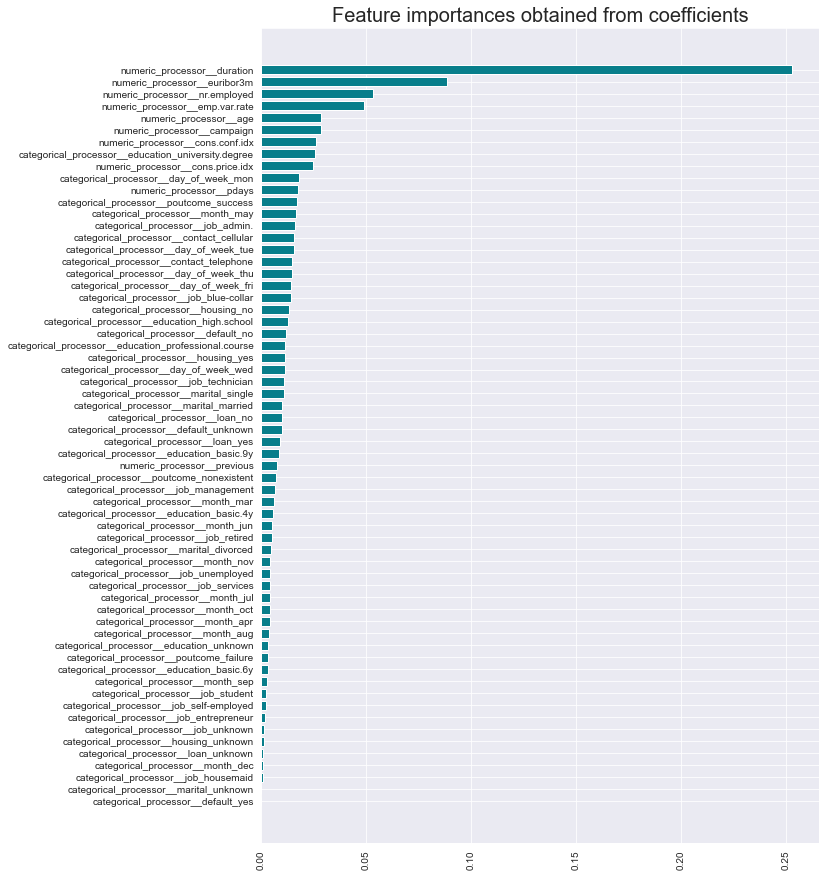

In [181]:
plt.figure(figsize = (10,15))
plt.barh(y=importances['Feature'], width=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [182]:
X_train_FE.nunique().sort_values(ascending=False)

numeric_processor__duration                  754
numeric_processor__euribor3m                 218
numeric_processor__age                        65
numeric_processor__cons.price.idx             26
numeric_processor__cons.conf.idx              26
                                            ... 
categorical_processor__month_nov               2
categorical_processor__month_oct               2
categorical_processor__education_basic.4y      2
categorical_processor__education_basic.6y      2
categorical_processor__contact_telephone       2
Length: 62, dtype: int64

## Feature Selection

### Techniques for feature selection
1. Mutual Information - to get the feature importance 
2. Multicollinearity - to check and remove any highly correlated independent features
3. VarianceThreshold - To check and remove any low varinace continuous features

## Multicollinearity

### Correlation

In [183]:
train_df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,25,services,married,high.school,no,yes,no,telephone,jun,wed,227,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,0
1,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,17,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,0
2,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,58,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,0
3,32,services,single,university.degree,no,no,no,cellular,sep,thu,128,3,999,2,failure,-1.1,94.199,-37.5,0.884,4963.6,0
4,32,admin.,single,university.degree,no,yes,no,cellular,sep,mon,290,4,999,0,nonexistent,-1.1,94.199,-37.5,0.879,4963.6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3114,31,technician,single,professional.course,no,yes,no,cellular,nov,thu,155,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,0
3115,30,admin.,married,basic.6y,no,yes,yes,cellular,jul,thu,53,1,999,0,nonexistent,1.4,93.918,-42.7,4.958,5228.1,0
3116,39,admin.,married,high.school,no,yes,no,telephone,jul,fri,219,1,999,0,nonexistent,1.4,93.918,-42.7,4.959,5228.1,0
3117,27,student,single,high.school,no,no,no,cellular,may,mon,64,2,999,1,failure,-1.8,92.893,-46.2,1.354,5099.1,0


In [184]:
train_df.corr()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
age,1.000000,0.036289,-0.008577,-0.027440,0.041299,-0.014679,-0.004980,0.099062,-0.010172,-0.031581,0.046829
duration,0.036289,1.000000,-0.087545,-0.046607,0.031381,-0.044284,0.007876,-0.039998,-0.046025,-0.055340,0.418287
campaign,-0.008577,-0.087545,1.000000,0.059283,-0.091984,0.176258,0.140919,0.019372,0.159744,0.156900,-0.068604
pdays,-0.027440,-0.046607,0.059283,1.000000,-0.570055,0.271917,0.056795,-0.089393,0.303103,0.383934,-0.336262
previous,0.041299,0.031381,-0.091984,-0.570055,1.000000,-0.414908,-0.167816,-0.061608,-0.460128,-0.513536,0.245653
emp.var.rate,-0.014679,-0.044284,0.176258,0.271917,-0.414908,1.000000,0.756390,0.184163,0.969895,0.896574,-0.290999
cons.price.idx,-0.004980,0.007876,0.140919,0.056795,-0.167816,0.756390,1.000000,0.041014,0.657255,0.473394,-0.098100
cons.conf.idx,0.099062,-0.039998,0.019372,-0.089393,-0.061608,0.184163,0.041014,1.000000,0.265811,0.093830,0.052272
euribor3m,-0.010172,-0.046025,0.159744,0.303103,-0.460128,0.969895,0.657255,0.265811,1.000000,0.942604,-0.304909
nr.employed,-0.031581,-0.055340,0.156900,0.383934,-0.513536,0.896574,0.473394,0.093830,0.942604,1.000000,-0.355969


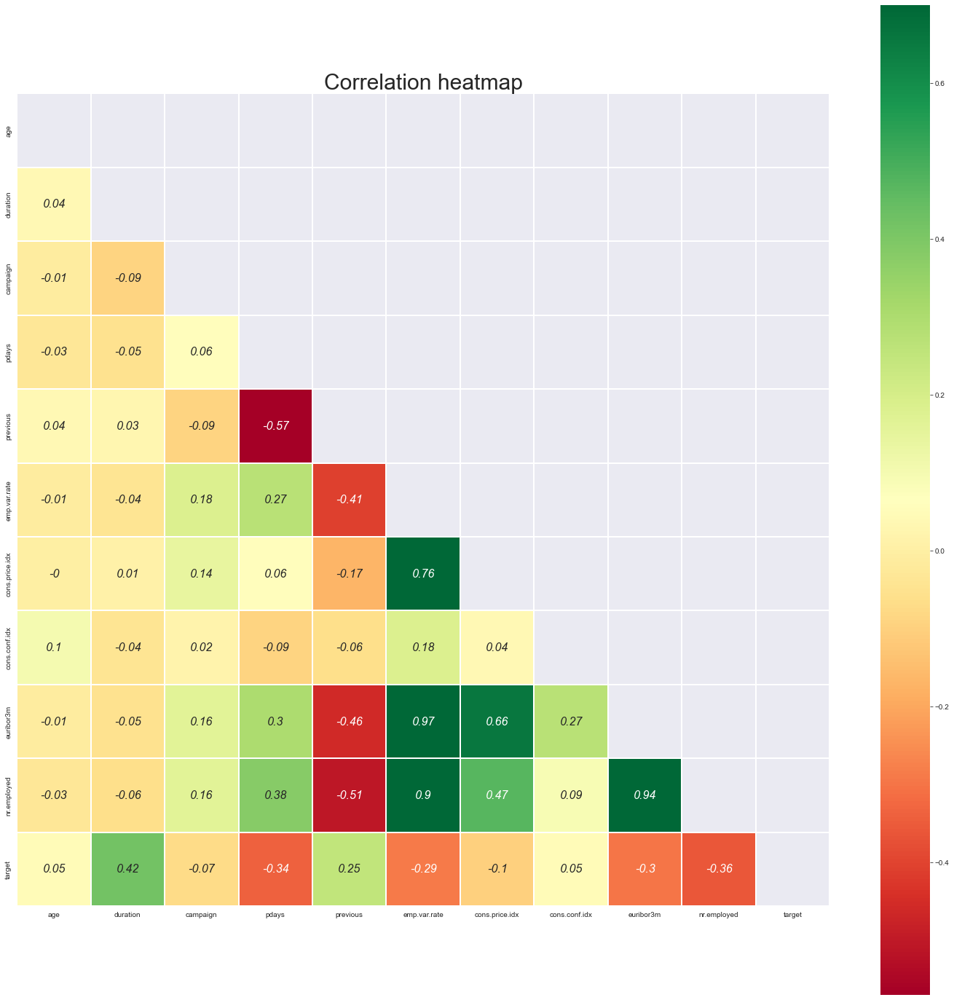

In [185]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df.corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df.corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

In [186]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [187]:
corr_features = correlation(X_train_balanced, 0.8)
print(len(set(corr_features)))
print(corr_features)

10
{'numeric_processor__nr.employed', 'categorical_processor__default_unknown', 'categorical_processor__marital_single', 'categorical_processor__poutcome_nonexistent', 'categorical_processor__poutcome_success', 'categorical_processor__loan_yes', 'categorical_processor__housing_yes', 'categorical_processor__contact_telephone', 'numeric_processor__euribor3m', 'categorical_processor__loan_unknown'}


In [188]:
# See there are 10 features with correlataion more than 0.8

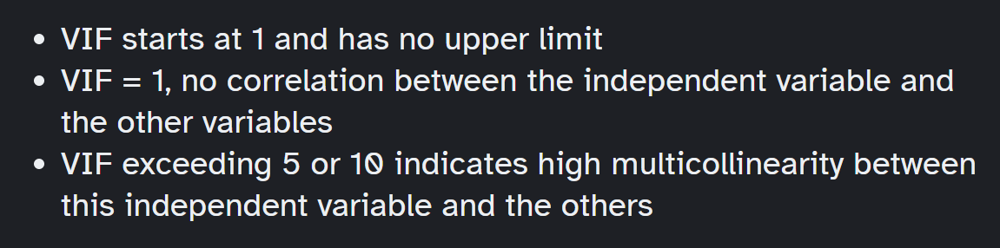

### Variance Inflation Factor (VIF)

https://www.analyticsvidhya.com/blog/2020/03/what-is-multicollinearity/

In [189]:
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.values, i) for i in range(len(X_train_balanced.columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
31,categorical_processor__month_sep,inf
32,categorical_processor__education_basic.4y,inf
34,categorical_processor__education_basic.9y,inf
35,categorical_processor__education_high.school,inf
36,categorical_processor__education_professional....,inf
...,...,...
6,numeric_processor__cons.price.idx,3.762210
7,numeric_processor__cons.conf.idx,3.488349
0,numeric_processor__age,1.994160
2,numeric_processor__campaign,1.126343


In [190]:
VIF_features = ['categorical_processor__month_sep','categorical_processor__contact_telephone','categorical_processor__loan_unknown',
                'categorical_processor__housing_unknown','categorical_processor__housing_no','categorical_processor__poutcome_nonexistent',
                'categorical_processor__default_no','categorical_processor__marital_single','categorical_processor__job_unknown',
                'categorical_processor__day_of_week_tue','numeric_processor__previous','categorical_processor__education_university.degree',
                'numeric_processor__emp.var.rate','numeric_processor__pdays','categorical_processor__month_may','categorical_processor__loan_no',
                'numeric_processor__nr.employed','categorical_processor__job_blue-collar']

In [191]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.drop(VIF_features, axis = 1).columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.drop(VIF_features, axis = 1).values, i) for i in range(len(X_train_balanced.drop(VIF_features, axis = 1).columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
5,numeric_processor__euribor3m,3.092540
35,categorical_processor__marital_married,2.968543
6,categorical_processor__job_admin.,2.806467
17,categorical_processor__month_aug,2.680174
43,categorical_processor__contact_cellular,2.628668
14,categorical_processor__job_technician,2.259696
19,categorical_processor__month_jul,2.134128
4,numeric_processor__cons.conf.idx,2.045289
32,categorical_processor__day_of_week_thu,2.023819
31,categorical_processor__day_of_week_mon,2.015171


In [192]:
vif_data.shape

(44, 2)

In [193]:
X_train_balanced

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,-1.388699,0.209892,-0.910699,0.0,0.000000,0.843243,1.099979,0.000000,0.617135,0.908500,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.00000,1.00000
1,0.000000,-1.490065,0.089301,0.0,0.000000,0.843243,1.099979,0.000000,0.343057,0.908500,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,1.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.00000,1.00000
2,0.510679,-0.980117,-0.910699,0.0,0.000000,-0.057831,-0.337082,-0.221888,-0.178967,0.058995,1.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000
3,-0.489321,-0.310877,0.089301,0.0,7.263113,-0.083780,0.814150,0.238370,-1.054705,-0.840931,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,0.000000,0.0,1.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,-1.000000,1.000000,0.0,0.00000,0.00000,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.00000,0.00000
4,-0.489321,0.431869,0.153191,0.0,0.000000,-0.083780,0.814150,0.238370,-1.117100,-0.840931,1.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0

In [194]:
X_train_multi = X_train_balanced.drop(VIF_features, axis = 1)

In [195]:
X_val_multi = X_val_FE.drop(VIF_features, axis = 1)

In [196]:
X_test_multi = X_test_FE.drop(VIF_features, axis = 1)

In [197]:
X_train_multi

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,categorical_processor__job_admin.,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_unknown,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_yes,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_success,categorical_processor__contact_cellular
0,-1.388699,0.209892,-0.910699,1.099979,0.000000,0.617135,0.000000,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.0,0.0,0.0,0.0,1.000000,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,-1.00000
1,0.000000,-1.490065,0.089301,1.099979,0.000000,0.343057,0.000000,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.0,0.0,0.0,1.0,0.000000,0.000000,0.0,1.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.00000,0.0,-1.0,0.0,0.0,0.0,-1.00000
2,0.510679,-0.980117,-0.910699,-0.337082,-0.221888,-0.178967,1.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,1.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1.0,0.000000,0.000000,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000
3,-0.489321,-0.310877,0.089301,0.814150,0.238370,-1.054705,0.000000,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,1.000000,0.000000,0.0,-1.000000,0.0,0.00000,0.0,-1.0,0.0,1.0,0.0,0.00000
4,-0.489321,0.431869,0.153191,0.814150,0.238370,-1.117100,1.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1.0,0.000000,0.000000,0.0,-1.000000,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5541,-0.526456,0.579818,0.000000,-3.737035,1.552743,-1.100761,1.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,1.0,0.0,0.00000,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.410108,0.589892,0.0,-0.589892,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000
5542,-0.806187,-0.033090,0.000000,-3.737035,1.552743,-1.148367,0.159268,0.000000,0.0,0.0,0.000000,0.0,0.840732,0.0,0.0,0.0,0.0,1.0,0.0,0.00000,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.840732,0.000000,0.0,0.0,0.0,0.840732,0.159268,0.0,-1.000000,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000
5543,0.724807,1.288736,-0.910699,1.000769,-0.055572,0.477380,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.10576,0.89424,0.0,0.000000,0.0,1.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.89424,0.0,-

In [198]:
X_val_multi

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,categorical_processor__job_admin.,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_unknown,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_yes,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_success,categorical_processor__contact_cellular
0,0.998369,0.466459,0.000000,-0.337082,-0.221888,-0.286095,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.673778,0.014864,-0.910699,0.510176,0.474544,-0.142165,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-1.0
2,0.243686,0.205063,0.000000,-0.337082,-0.221888,-0.178967,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0
3,0.182039,0.686703,0.000000,-0.805335,-0.998816,-0.522620,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.673778,0.440703,0.089301,-0.805335,-0.998816,-0.472423,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,-0.214744,0.185832,-0.910699,-0.337082,-0.221888,-0.286095,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.0,1.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0
496,0.730842,0.695308,-0.910699,-0.116956,0.971026,0.962706,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0
497,0.353251,0.338301,-0.910699,-0.116956,0.971026,1.088815,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
498,0.792301,-0.238181,-0.910699,-0.337082,-0.221888,-0.286095,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0


In [199]:
X_test_multi

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,categorical_processor__job_admin.,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_unknown,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_yes,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_success,categorical_processor__contact_cellular
0,0.000000,0.478977,-0.910699,-0.337082,-0.221888,-0.286095,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0
1,-0.297728,-0.029734,-0.910699,-0.337082,-0.221888,-0.241907,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.854116,0.010218,-0.910699,0.161914,-0.525456,0.477380,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0
3,0.353251,-0.557851,0.000000,-3.737035,1.552743,-1.117100,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0
4,0.243686,-0.447742,0.153191,1.099979,0.000000,0.193375,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,-0.383653,-1.080500,-0.910699,-0.116956,0.971026,0.617135,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,-1.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0
496,-0.614116,0.200243,0.000000,0.161914,-0.525456,0.617135,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
497,-1.388699,1.349915,-0.910699,0.161914,-0.525456,0.275509,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0
498,0.068183,-0.357189,-0.910699,0.161914,-0.525456,0.795853,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,1.0,0.0,0.0,0.0


In [200]:
model = AdaBoostClassifier()
model.fit(X_train_multi,y_train_balanced)

AdaBoostClassifier()

In [201]:
model.feature_names_in_

array(['numeric_processor__age', 'numeric_processor__duration',
       'numeric_processor__campaign', 'numeric_processor__cons.price.idx',
       'numeric_processor__cons.conf.idx', 'numeric_processor__euribor3m',
       'categorical_processor__job_admin.',
       'categorical_processor__job_entrepreneur',
       'categorical_processor__job_housemaid',
       'categorical_processor__job_management',
       'categorical_processor__job_retired',
       'categorical_processor__job_self-employed',
       'categorical_processor__job_services',
       'categorical_processor__job_student',
       'categorical_processor__job_technician',
       'categorical_processor__job_unemployed',
       'categorical_processor__month_apr',
       'categorical_processor__month_aug',
       'categorical_processor__month_dec',
       'categorical_processor__month_jul',
       'categorical_processor__month_jun',
       'categorical_processor__month_mar',
       'categorical_processor__month_nov',
       'categ

In [202]:
y_train_pred = model.predict(X_train_multi)
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       0.93      0.92      0.93      2773
           1       0.92      0.93      0.93      2773

    accuracy                           0.93      5546
   macro avg       0.93      0.93      0.93      5546
weighted avg       0.93      0.93      0.93      5546



In [203]:
y_val_pred = model.predict(X_val_multi)
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.95      0.93      0.94       447
           1       0.51      0.60      0.55        53

    accuracy                           0.90       500
   macro avg       0.73      0.77      0.75       500
weighted avg       0.90      0.90      0.90       500



#### See even if we remove 18 features we are able to get 90% of validation accuracy

### VarianceThreshold

In [204]:
X_train_balanced

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,-1.388699,0.209892,-0.910699,0.0,0.000000,0.843243,1.099979,0.000000,0.617135,0.908500,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.00000,1.00000
1,0.000000,-1.490065,0.089301,0.0,0.000000,0.843243,1.099979,0.000000,0.343057,0.908500,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,1.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.00000,1.00000
2,0.510679,-0.980117,-0.910699,0.0,0.000000,-0.057831,-0.337082,-0.221888,-0.178967,0.058995,1.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000
3,-0.489321,-0.310877,0.089301,0.0,7.263113,-0.083780,0.814150,0.238370,-1.054705,-0.840931,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,0.000000,0.0,1.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,-1.000000,1.000000,0.0,0.00000,0.00000,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.00000,0.00000
4,-0.489321,0.431869,0.153191,0.0,0.000000,-0.083780,0.814150,0.238370,-1.117100,-0.840931,1.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0

In [205]:
# In this technique we will find the varince of all the features and we can remove the features which have low variance 
# by setting the threshold parameter

var_thres=VarianceThreshold()
var_thres.fit(X_train_balanced)

VarianceThreshold()

In [206]:
variances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'variance': var_thres.variances_
})
variances = variances.sort_values(by='variance', ascending=True)

In [207]:
variances

,Feature,variance
50,categorical_processor__default_yes,0.000180
47,categorical_processor__marital_unknown,0.001620
21,categorical_processor__job_unknown,0.008302
24,categorical_processor__month_dec,0.013050
55,categorical_processor__loan_unknown,0.015857
...,...,...
8,numeric_processor__euribor3m,0.712208
6,numeric_processor__cons.price.idx,1.065139
7,numeric_processor__cons.conf.idx,1.312595
3,numeric_processor__pdays,5.687069


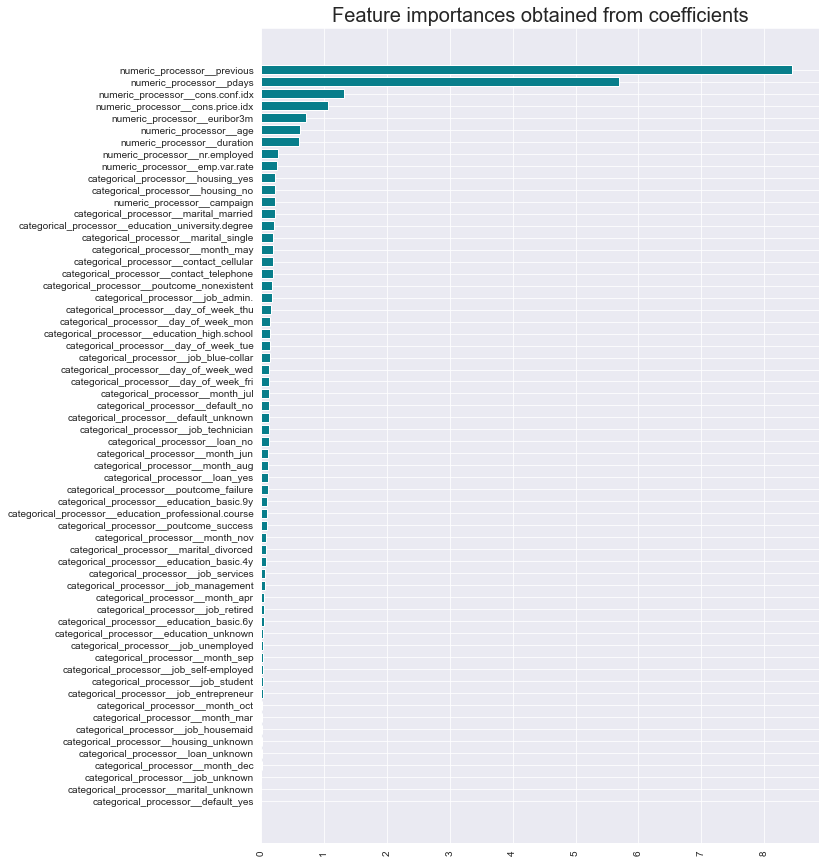

In [208]:
plt.figure(figsize = (10,15))
plt.barh(y=variances['Feature'], width=variances['variance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [209]:
variances['Feature'].values[-7:].tolist()

['numeric_processor__duration',
 'numeric_processor__age',
 'numeric_processor__euribor3m',
 'numeric_processor__cons.price.idx',
 'numeric_processor__cons.conf.idx',
 'numeric_processor__pdays',
 'numeric_processor__previous']

In [210]:
X_train_balanced[variances['Feature'].values[-7:].tolist()]

,numeric_processor__duration,numeric_processor__age,numeric_processor__euribor3m,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__pdays,numeric_processor__previous
0,0.209892,-1.388699,0.617135,1.099979,0.000000,0.0,0.000000
1,-1.490065,0.000000,0.343057,1.099979,0.000000,0.0,0.000000
2,-0.980117,0.510679,-0.178967,-0.337082,-0.221888,0.0,0.000000
3,-0.310877,-0.489321,-1.054705,0.814150,0.238370,0.0,7.263113
4,0.431869,-0.489321,-1.117100,0.814150,0.238370,0.0,0.000000
...,...,...,...,...,...,...,...
5541,0.579818,-0.526456,-1.100761,-3.737035,1.552743,0.0,0.000000
5542,-0.033090,-0.806187,-1.148367,-3.737035,1.552743,0.0,0.000000
5543,1.288736,0.724807,0.477380,1.000769,-0.055572,0.0,0.000000
5544,-0.043256,1.115434,-0.758816,-0.571826,0.139074,0.0,0.000000


In [211]:
y_train_balanced

0       0
1       0
2       0
3       0
4       0
       ..
5541    1
5542    1
5543    1
5544    1
5545    1
Name: target, Length: 5546, dtype: int64

In [212]:
model = AdaBoostClassifier()
model.fit(X_train_balanced[variances['Feature'].values[-7:].tolist()],y_train_balanced)

AdaBoostClassifier()

In [213]:
model.feature_names_in_

array(['numeric_processor__duration', 'numeric_processor__age',
       'numeric_processor__euribor3m',
       'numeric_processor__cons.price.idx',
       'numeric_processor__cons.conf.idx', 'numeric_processor__pdays',
       'numeric_processor__previous'], dtype=object)

In [214]:
y_train_pred = model.predict(X_train_balanced[variances['Feature'].values[-7:].tolist()])
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       0.90      0.89      0.90      2773
           1       0.89      0.91      0.90      2773

    accuracy                           0.90      5546
   macro avg       0.90      0.90      0.90      5546
weighted avg       0.90      0.90      0.90      5546



In [215]:
y_val_pred = model.predict(X_val_FE[variances['Feature'].values[-7:].tolist()])
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.97      0.88      0.92       447
           1       0.44      0.79      0.57        53

    accuracy                           0.87       500
   macro avg       0.71      0.84      0.75       500
weighted avg       0.92      0.87      0.89       500



#### See with just 7 features having high variance we are able to get the 87% validation accurcy. using the technique VarianceThreshold

### Mutual Information for Classification

In [216]:
mutual_info = mutual_info_classif(X_train_balanced, y_train_balanced)
mutual_info

array([0.41706323, 0.29292652, 0.24799413, 0.06543014, 0.06989363,
       0.16780168, 0.21471182, 0.2169386 , 0.37896097, 0.17539234,
       0.09625562, 0.05976976, 0.01354105, 0.01088014, 0.04181915,
       0.02028918, 0.02162056, 0.04645307, 0.01998672, 0.07836742,
       0.02350104, 0.00637136, 0.02319897, 0.01408527, 0.01704651,
       0.02690929, 0.02874965, 0.01849729, 0.07225999, 0.01987293,
       0.00811016, 0.02219512, 0.03748841, 0.02399465, 0.05900176,
       0.07922476, 0.06628461, 0.10747018, 0.03644326, 0.08848935,
       0.10828578, 0.08501356, 0.08869835, 0.07168365, 0.03683388,
       0.07696014, 0.06083932, 0.01925951, 0.0580091 , 0.04406853,
       0.        , 0.08133532, 0.01088435, 0.08798149, 0.07231852,
       0.01223343, 0.06539964, 0.00341407, 0.0368784 , 0.06431389,
       0.05196321, 0.05440222])

In [217]:
mutual_info_df = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'MI': mutual_info
})
mutual_info_df = mutual_info_df.sort_values(by='MI', ascending=True)

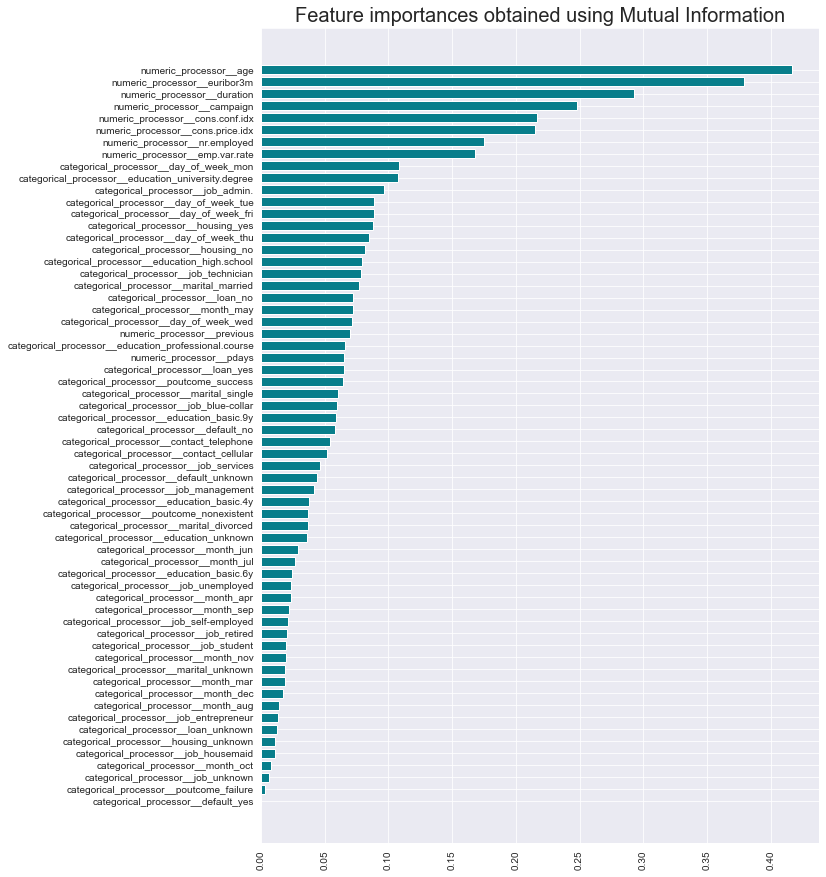

In [218]:
plt.figure(figsize = (10,15))
plt.barh(y=mutual_info_df['Feature'], width=mutual_info_df['MI'], color='#087E8B')
plt.title('Feature importances obtained using Mutual Information', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [219]:
mutual_info_df

,Feature,MI
50,categorical_processor__default_yes,0.000000
57,categorical_processor__poutcome_failure,0.003414
21,categorical_processor__job_unknown,0.006371
30,categorical_processor__month_oct,0.008110
13,categorical_processor__job_housemaid,0.010880
...,...,...
7,numeric_processor__cons.conf.idx,0.216939
2,numeric_processor__campaign,0.247994
1,numeric_processor__duration,0.292927
8,numeric_processor__euribor3m,0.378961


In [220]:
mutual_info_df['Feature'].values[-7:].tolist()

['numeric_processor__nr.employed',
 'numeric_processor__cons.price.idx',
 'numeric_processor__cons.conf.idx',
 'numeric_processor__campaign',
 'numeric_processor__duration',
 'numeric_processor__euribor3m',
 'numeric_processor__age']

In [221]:
model = AdaBoostClassifier()
model.fit(X_train_balanced[mutual_info_df['Feature'].values[-8:].tolist()],y_train_balanced)

AdaBoostClassifier()

In [222]:
model.feature_names_in_

array(['numeric_processor__emp.var.rate',
       'numeric_processor__nr.employed',
       'numeric_processor__cons.price.idx',
       'numeric_processor__cons.conf.idx', 'numeric_processor__campaign',
       'numeric_processor__duration', 'numeric_processor__euribor3m',
       'numeric_processor__age'], dtype=object)

In [223]:
y_train_pred = model.predict(X_train_balanced[mutual_info_df['Feature'].values[-8:].tolist()])
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       0.91      0.89      0.90      2773
           1       0.90      0.91      0.90      2773

    accuracy                           0.90      5546
   macro avg       0.90      0.90      0.90      5546
weighted avg       0.90      0.90      0.90      5546



In [224]:
y_val_pred = model.predict(X_val_FE[mutual_info_df['Feature'].values[-8:].tolist()])
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.97      0.88      0.92       447
           1       0.42      0.74      0.53        53

    accuracy                           0.86       500
   macro avg       0.69      0.81      0.73       500
weighted avg       0.91      0.86      0.88       500



#### See with just 8 features having high MI gain we are able to get the 86% validation accurcy.

## PCA

In [225]:
# we are not going to do PCA because we are having few features only.

## Building the final Model

In [226]:
X_train_balanced

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,-1.388699,0.209892,-0.910699,0.0,0.000000,0.843243,1.099979,0.000000,0.617135,0.908500,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.00000,1.00000
1,0.000000,-1.490065,0.089301,0.0,0.000000,0.843243,1.099979,0.000000,0.343057,0.908500,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,1.00000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,1.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.00000,1.00000
2,0.510679,-0.980117,-0.910699,0.0,0.000000,-0.057831,-0.337082,-0.221888,-0.178967,0.058995,1.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000
3,-0.489321,-0.310877,0.089301,0.0,7.263113,-0.083780,0.814150,0.238370,-1.054705,-0.840931,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.000000,0.000000,0.0,1.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,0.0,0.0,0.0,1.000000,0.000000,0.000000,0.0,-1.000000,1.000000,0.0,0.00000,0.00000,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.00000,0.00000
4,-0.489321,0.431869,0.153191,0.0,0.000000,-0.083780,0.814150,0.238370,-1.117100,-0.840931,1.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0

In [227]:
y_train_balanced

0       0
1       0
2       0
3       0
4       0
       ..
5541    1
5542    1
5543    1
5544    1
5545    1
Name: target, Length: 5546, dtype: int64

In [228]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['age', 'duration',
                                                   'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euri...
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index(['job', 'month', 'education', 'day_of_week', 'marital', 'default',
       'housing', 'loan', 'poutcome', 'contact'],
      dtype='object'))])),
                ('scaler', RobustScaler())])

In [229]:
model = AdaBoostClassifier()

In [230]:
model.fit(X_train_balanced,y_train_balanced)

AdaBoostClassifier()

In [231]:
X_val_FE

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,0.998369,0.466459,0.000000,0.000000,0.00000,-0.057831,-0.337082,-0.221888,-0.286095,0.058995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.673778,0.014864,-0.910699,0.000000,0.00000,0.000000,0.510176,0.474544,-0.142165,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,-1.0,1.0
2,0.243686,0.205063,0.000000,0.000000,0.00000,-0.057831,-0.337082,-0.221888,-0.178967,0.058995,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.182039,0.686703,0.000000,0.000000,0.00000,-0.156757,-0.805335,-0.998816,-0.522620,-0.091500,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.673778,0.440703,0.089301,-7.564585,6.55196,-0.156757,-0.805335,-0.998816,-0.472423,-0.091500,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [232]:
y_val

0      0
1      0
2      0
3      0
4      1
      ..
495    0
496    0
497    0
498    0
499    0
Name: target, Length: 500, dtype: int64

In [233]:
y_train_pred = model.predict(X_train_balanced)
train_score = accuracy_score(y_train_balanced,y_train_pred)
    
precision = precision_score(y_train_balanced,y_train_pred,average='macro')
recall = recall_score(y_train_balanced,y_train_pred,average='macro')
f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
print(classification_report(y_train_balanced,y_train_pred))
    
y_val_pred = model.predict(X_val_FE)

print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.93      0.94      0.93      2773
           1       0.94      0.93      0.93      2773

    accuracy                           0.93      5546
   macro avg       0.93      0.93      0.93      5546
weighted avg       0.93      0.93      0.93      5546

              precision    recall  f1-score   support

           0       0.96      0.95      0.95       447
           1       0.59      0.64      0.61        53

    accuracy                           0.91       500
   macro avg       0.77      0.79      0.78       500
weighted avg       0.92      0.91      0.92       500



In [234]:
X_test_FE

,numeric_processor__age,numeric_processor__duration,numeric_processor__campaign,numeric_processor__pdays,numeric_processor__previous,numeric_processor__emp.var.rate,numeric_processor__cons.price.idx,numeric_processor__cons.conf.idx,numeric_processor__euribor3m,numeric_processor__nr.employed,categorical_processor__job_admin.,categorical_processor__job_blue-collar,categorical_processor__job_entrepreneur,categorical_processor__job_housemaid,categorical_processor__job_management,categorical_processor__job_retired,categorical_processor__job_self-employed,categorical_processor__job_services,categorical_processor__job_student,categorical_processor__job_technician,categorical_processor__job_unemployed,categorical_processor__job_unknown,categorical_processor__month_apr,categorical_processor__month_aug,categorical_processor__month_dec,categorical_processor__month_jul,categorical_processor__month_jun,categorical_processor__month_mar,categorical_processor__month_may,categorical_processor__month_nov,categorical_processor__month_oct,categorical_processor__month_sep,categorical_processor__education_basic.4y,categorical_processor__education_basic.6y,categorical_processor__education_basic.9y,categorical_processor__education_high.school,categorical_processor__education_professional.course,categorical_processor__education_university.degree,categorical_processor__education_unknown,categorical_processor__day_of_week_fri,categorical_processor__day_of_week_mon,categorical_processor__day_of_week_thu,categorical_processor__day_of_week_tue,categorical_processor__day_of_week_wed,categorical_processor__marital_divorced,categorical_processor__marital_married,categorical_processor__marital_single,categorical_processor__marital_unknown,categorical_processor__default_no,categorical_processor__default_unknown,categorical_processor__default_yes,categorical_processor__housing_no,categorical_processor__housing_unknown,categorical_processor__housing_yes,categorical_processor__loan_no,categorical_processor__loan_unknown,categorical_processor__loan_yes,categorical_processor__poutcome_failure,categorical_processor__poutcome_nonexistent,categorical_processor__poutcome_success,categorical_processor__contact_cellular,categorical_processor__contact_telephone
0,0.000000,0.478977,-0.910699,0.000000,0.00000,-0.057831,-0.337082,-0.221888,-0.286095,0.058995,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.297728,-0.029734,-0.910699,0.000000,0.00000,-0.057831,-0.337082,-0.221888,-0.241907,0.058995,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.854116,0.010218,-0.910699,0.000000,0.00000,0.843243,0.161914,-0.525456,0.477380,0.908500,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.0,1.0,0.0,-1.0,1.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.353251,-0.557851,0.000000,-7.295858,6.55196,-0.272706,-3.737035,1.552743,-1.117100,-0.173812,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0
4,0.243686,-0.447742,0.153191,0.000000,0.00000,0.843243,1.099979,0.000000,0.193375,0.908500,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [235]:
y_test

0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    0
497    0
498    0
499    0
Name: target, Length: 500, dtype: int64

In [236]:
y_test_pred = model.predict(X_test_FE)

print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95       448
           1       0.57      0.62      0.59        52

    accuracy                           0.91       500
   macro avg       0.76      0.78      0.77       500
weighted avg       0.92      0.91      0.91       500



#### We got 91% test accuracy our final 'AdaBoostClassifier' model

### Save Trained Model Using joblib

In [237]:
import joblib

In [238]:
joblib.dump(model, '../Models/bank_marketing_model')

['../Models/bank_marketing_model']

In [239]:
joblib.dump(final_pipe, '../Pipelines/bank_marketing_pipeline')

['../Pipelines/bank_marketing_pipeline']

### Load Saved Model

In [240]:
model = joblib.load('../Models/bank_marketing_model')

In [241]:
final_pipe = joblib.load('../Pipelines/bank_marketing_pipeline')

In [242]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['age', 'duration',
                                                   'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euri...
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index(['job', 'month', 'education', 'day_of_week', 'marital', 'default',
       'housing', 'loan', 'poutcome', 'contact'],
      dtype='object'))])),
                ('scaler', RobustScaler())])

In [262]:
X_test.iloc[58:65]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
58,40,technician,married,university.degree,no,yes,yes,cellular,may,fri,133,2,999,0,nonexistent,-1.8,92.893,-46.2,1.250,5099.1
59,61,blue-collar,married,basic.6y,no,yes,yes,cellular,may,fri,403,1,3,2,success,-1.8,93.876,-40.0,0.695,5008.7
60,41,admin.,married,university.degree,no,no,no,cellular,apr,tue,463,1,999,0,nonexistent,-1.8,93.075,-47.1,1.453,5099.1
61,34,technician,divorced,professional.course,no,no,no,telephone,may,wed,91,1,999,0,nonexistent,1.1,93.994,-36.4,4.859,5191.0
62,37,unemployed,married,basic.9y,no,yes,yes,cellular,may,fri,129,4,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1
63,29,blue-collar,single,basic.4y,no,yes,yes,cellular,nov,thu,104,5,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8
64,33,admin.,single,university.degree,no,yes,yes,cellular,aug,tue,275,6,999,0,nonexistent,1.4,93.444,-36.1,4.963,5228.1


In [263]:
final_pipe.transform(X_test.iloc[58:65])

array([[ 0.12528701, -0.27569102,  0.        ,  0.        ,  0.        ,
        -0.15675701, -0.80533482, -0.99881642, -0.86726149, -0.09149957,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  1.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  1.        ,  0.        ,  1.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        , -1.        ,
         0.        ,  1.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ],
       [ 1.60058223,  0.71674791, -0.91069902, -7.56458523,  7.26311275,
        -0.15675

In [264]:
model.predict(final_pipe.transform(X_test.iloc[58:65]))

array([0, 1, 1, 0, 0, 0, 0], dtype=int64)

In [265]:
y_test[58:65]

58    0
59    1
60    1
61    0
62    0
63    0
64    0
Name: target, dtype: int64

In [266]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             500 non-null    int64  
 1   job             500 non-null    object 
 2   marital         500 non-null    object 
 3   education       500 non-null    object 
 4   default         500 non-null    object 
 5   housing         500 non-null    object 
 6   loan            500 non-null    object 
 7   contact         500 non-null    object 
 8   month           500 non-null    object 
 9   day_of_week     500 non-null    object 
 10  duration        500 non-null    int64  
 11  campaign        500 non-null    int64  
 12  pdays           500 non-null    int64  
 13  previous        500 non-null    int64  
 14  poutcome        500 non-null    object 
 15  emp.var.rate    500 non-null    float64
 16  cons.price.idx  500 non-null    float64
 17  cons.conf.idx   500 non-null    flo

In [267]:
X_test

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,38,admin.,married,high.school,no,unknown,unknown,cellular,nov,thu,309,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8
1,34,management,single,high.school,no,yes,no,cellular,nov,wed,175,1,999,0,nonexistent,-0.1,93.200,-42.0,4.120,5195.8
2,53,admin.,single,unknown,unknown,no,no,cellular,jul,tue,183,1,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1
3,44,admin.,married,university.degree,no,no,no,cellular,aug,wed,96,2,4,1,success,-2.9,92.201,-31.4,0.879,5076.2
4,42,blue-collar,married,basic.4y,no,no,no,telephone,jun,tue,110,4,999,0,nonexistent,1.4,94.465,-41.8,4.864,5228.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,33,admin.,divorced,university.degree,no,no,no,cellular,aug,thu,49,1,999,0,nonexistent,1.4,93.444,-36.1,4.962,5228.1
496,31,technician,married,professional.course,no,yes,no,cellular,jul,wed,225,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1
497,25,admin.,single,university.degree,no,no,no,cellular,jul,fri,835,1,999,0,nonexistent,1.4,93.918,-42.7,4.957,5228.1
498,39,blue-collar,married,basic.6y,unknown,no,yes,cellular,jul,thu,122,1,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1


In [280]:
X_test['poutcome'].unique()

array(['nonexistent', 'success', 'failure'], dtype=object)

### ANN

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
model_ANN = keras.Sequential([
    keras.layers.Dense(100, input_shape=(43,),activation='relu'),
    keras.layers.Dense(50,activation='relu'),
    keras.layers.Dense(25,activation='relu'),
    keras.layers.Dense(10,activation='relu'),
    keras.layers.Dense(1,activation='sigmoid')
])

model_ANN.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model_ANN.fit(X_res,y_res,validation_data=(X_test_FE,y_test),epochs=100,batch_size=1000)

In [ ]:
model_ANN.evaluate(X_test_FE,y_test)

In [ ]:
y_test_pred = model_ANN.predict(X_test_FE)
y_test_pred[:5]

In [ ]:
y_pred = []
for element in y_test_pred:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [ ]:
y_pred[:5]

In [ ]:
y_test[:5]

In [ ]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

In [ ]:
## Building the final Model

X_train_balanced

y_train_balanced

final_pipe

model = RandomForestClassifier()

model.fit(X_train_balanced,y_train_balanced)

X_val_FE

y_val

y_train_pred = model.predict(X_train_balanced)
train_score = accuracy_score(y_train_balanced,y_train_pred)
    
precision = precision_score(y_train_balanced,y_train_pred,average='macro')
recall = recall_score(y_train_balanced,y_train_pred,average='macro')
f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
print(classification_report(y_train_balanced,y_train_pred))
    
y_val_pred = model.predict(X_val_FE)

print(classification_report(y_val,y_val_pred))

X_test_FE

y_test

y_test_pred = model.predict(X_test_FE)

print(classification_report(y_test,y_test_pred))

#### We got 88% accuracy on test data with our final 'RandomForestClassifier' model





### Save Trained Model Using joblib

import joblib

joblib.dump(model, '../Models/indian_loan_default_prediction_model')

### Load Saved Model

model = joblib.load('../Models/indian_loan_default_prediction_model')

test = pd.DataFrame(columns=X_train.columns)
test.loc[0] = [1800000,25,4,'single','rented','no','Software_Developer','Hyderabad','Telangana',1,15]
test

final_pipe

final_pipe.transform(test)

model.predict(final_pipe.transform(test))

X_test.head()

final_pipe.transform(X_test.head())

model.predict(final_pipe.transform(X_test.head()))

y_test[:5]







### ANN

import tensorflow as tf
from tensorflow import keras

model_ANN = keras.Sequential([
    keras.layers.Dense(100, input_shape=(43,),activation='relu'),
    keras.layers.Dense(50,activation='relu'),
    keras.layers.Dense(25,activation='relu'),
    keras.layers.Dense(10,activation='relu'),
    keras.layers.Dense(1,activation='sigmoid')
])

model_ANN.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model_ANN.fit(X_res,y_res,validation_data=(X_test_FE,y_test),epochs=100,batch_size=1000)

model_ANN.evaluate(X_test_FE,y_test)

y_test_pred = model_ANN.predict(X_test_FE)
y_test_pred[:5]

y_pred = []
for element in y_test_pred:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

y_pred[:5]

y_test[:5]

from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))



## Building the final Model

#### Considering all the results 'ExtraTreesClassifier' gives us the overall best model

In [ ]:
model = RandomForestClassifier(n_estimators=600,max_depth=30)

In [ ]:
model.fit(X_res, y_res)

In [ ]:
y_train_pred = model.predict(X_res)
train_score = accuracy_score(y_res,y_train_pred)
    
precision = precision_score(y_res,y_train_pred,average='macro')
recall = recall_score(y_res,y_train_pred,average='macro')
f1 = f1_score(y_res,y_train_pred,average='macro')
    
print(classification_report(y_res,y_train_pred))
    
y_test_pred = model.predict(X_test_FE)
test_score = accuracy_score(y_test,y_test_pred)
print("test accuracy : ",test_score)

### Save Trained Model Using joblib

In [ ]:
import joblib

In [ ]:
joblib.dump(model, 'model_RF')

### Load Saved Model

In [ ]:
model = joblib.load('model_RF')

In [ ]:
final_pipe

In [ ]:
test = pd.DataFrame(columns=X_test.columns)
test.loc[0] = [33,'blue-collar','married','basic.9y','no','no','no','cellular','may','fri',728,1,999,0,'nonexistent',-1.8,92.893,-46.2,1.313,5099.1]
test

In [ ]:
final_pipe.transform(test)

In [ ]:
model.predict(final_pipe.transform(test))

In [ ]:
X_test.iloc[80:90]

In [ ]:
final_pipe.transform(X_test.iloc[80:90])

In [ ]:
model.predict(final_pipe.transform(X_test.iloc[80:90]))

In [ ]:
y_test.iloc[15:25]

In [ ]:
# The below is the sample code to deploy this model using Gradio. you can tweek the below code for this project needs and deploy it.

In [ ]:
X_train.columns

In [ ]:
1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function
8. age - Age (years)
9. skin - 
10. target - class

In [ ]:
train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

## Gradio deployment

In [ ]:
import gradio as gr
import random
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datasets import load_dataset


matplotlib.use("Agg")
df = pd.read_csv('train_df.csv')
X_train = df.drop('target',axis=1)
y_train = df['target']



def predict(*args):
    df = pd.DataFrame([args], columns=X_train.columns)
    result = pipe_xgb.predict(final_pipe.transform(df))
    output = 'diabetic' if result[0]==1 else 'no diabetic' 
    return output



with gr.Blocks() as demo:
    gr.Markdown("""
    **Indian Loan Default Prediction **:  This demo uses an Random Forest classifier predicts loan default based on demographic factors.
    """)
    with gr.Row():
        with gr.Column():
            Pregnancies = gr.Slider(label="No.of Pregnensis", minimum=0, maximum=20, step=1, randomize=True)
            Glucose = gr.Slider(label="Glucose", minimum=0, maximum=400, step=1, randomize=True)
            BloodPressure = gr.Slider(label="blood pressure (mm Hg)", minimum=0, maximum=200, step=1, randomize=True)
            SkinThickness = gr.Slider(label="Triceps skin fold thickness (mm)", minimum=0, maximum=100, step=1, randomize=True)
            Insulin = gr.Slider(label="2-Hour serum insulin (mu U/ml)", minimum=0, maximum=1000, step=1, randomize=True)
            BMI = gr.Slider(label="Body mass index", minimum=0, maximum=100, step=0.5, randomize=True)
            DiabetesPedigreeFunction = gr.Slider(label="Diabetes pedigree function", minimum=0, maximum=10, step=0.5, randomize=True)
            Age = gr.Slider(label="Age", minimum=0, maximum=150, step=1, randomize=True)
            
            
        with gr.Column():
            label = gr.Label()
            with gr.Row():
                predict_btn = gr.Button(value="Predict")
            predict_btn.click(
                predict,
                inputs=[
                    Pregnancies,
                    Glucose,
                    BloodPressure,
                    SkinThickness,
                    Insulin,
                    BMI,
                    DiabetesPedigreeFunction,
                    Age,
                ],
                outputs=[label],
            )

demo.launch()

In [ ]:
demo.close()

In [ ]:
final_pipe

X_train

y_train

X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

X_train_FE

y_train.value_counts()

X_test

y_test

X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

X_test_FE

models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

results = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Test_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_test_pred = model.predict(X_test_FE)
    test_score = accuracy_score(y_test,y_test_pred)
            
    results = results.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Test_Accuracy':test_score}),ignore_index=True )

results

results.style.highlight_max(color = 'lightgreen', axis = 0)

results.sort_values(by='Test_Accuracy',ascending=False)

# writing results to a file

results.to_csv('results.csv',index=False)







## Handling Imbalanced dataset

X_train_FE

y_train

y_train.value_counts()

y_train.value_counts(normalize=True)

smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_res, y_res = smote.fit_resample(X_train_FE, y_train)

X_res

y_res

y_res.value_counts()

results2 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Test_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_res, y_res, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_res, y_res)
    y_train_pred = model.predict(X_res)
    train_score = accuracy_score(y_res,y_train_pred)
    
    precision = precision_score(y_res,y_train_pred,average='macro')
    recall = recall_score(y_res,y_train_pred,average='macro')
    f1 = f1_score(y_res,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_res,y_train_pred))
    
    y_test_pred = model.predict(X_test_FE)
    test_score = accuracy_score(y_test,y_test_pred)
            
    results2 = results2.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Test_Accuracy':test_score}),ignore_index=True )

results2

results2.style.highlight_max(color = 'lightgreen', axis = 0)

results2.sort_values(by='Test_Accuracy',ascending=False)

results2.sort_values(by='cv_results',ascending=False)

# writing results to a file

results2.to_csv('results2.csv',index=False)







## Hyperparameter Tuning

model_params = {
    'svc': {
        'model': SVC(),
        'params' : {
            'C': [1,5,10,15,20,25],
            'kernel': ['rbf','linear','poly','sigmoid'],
            'gamma':['scale','auto']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'AdaBoost_clf': {
        'model': AdaBoostClassifier(),
        'params' : {
            'n_estimators': [300,350,400,500,600],
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
        }  
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

model_params = {
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

results3 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score',
                                            'Test_Accuracy'])

for model_name, mp in model_params.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=3,scoring='f1_macro',n_jobs=-1)
    clf.fit(X_res, y_res)
    
    print(model_name+' - '+str(np.round(clf.best_score_,6)))
    print(clf.best_params_)
    
    y_train_pred = clf.predict(X_res)
    train_score = accuracy_score(y_res,y_train_pred)
    
    precision = precision_score(y_res,y_train_pred,average='macro')
    recall = recall_score(y_res,y_train_pred,average='macro')
    f1 = f1_score(y_res,y_train_pred,average='macro')
    print(classification_report(y_res,y_train_pred))

    y_test_pred = clf.predict(X_test_FE)
    test_score = accuracy_score(y_test,y_test_pred)
    
    print('train_score - ',train_score)
    print('test_score - ',test_score)
    
    results3 = results3.append(pd.Series({'Model':model_name,'cv_results':clf.best_score_,'Train_Accuracy':train_score,'Precision':precision,
                                        'Recall':recall,'F1_score':f1,'Test_Accuracy':test_score}),ignore_index=True )

results3

results3.style.highlight_max(color = 'lightgreen', axis = 0)

results3.sort_values(by='Test_Accuracy',ascending=False)

results3.sort_values(by='cv_results',ascending=False)

# writing results to a file

results3.to_csv('results3.csv',index=False)











## Building the final Model

#### Condidering all the results 'GradientBoostingClassifier' gives us the overall best model

model = GradientBoostingClassifier(n_estimators=400,max_depth=8,learning_rate=0.01)

model.fit(X_res, y_res)

y_train_pred = model.predict(X_res)
train_score = accuracy_score(y_res,y_train_pred)
    
precision = precision_score(y_res,y_train_pred,average='macro')
recall = recall_score(y_res,y_train_pred,average='macro')
f1 = f1_score(y_res,y_train_pred,average='macro')
    
print(classification_report(y_res,y_train_pred))
    
y_test_pred = model.predict(X_test_FE)
test_score = accuracy_score(y_test,y_test_pred)
print("test accuracy : ",test_score)



### Save Trained Model Using joblib

import joblib

joblib.dump(model, 'model_GB')

### Load Saved Model

model = joblib.load('model_GB')

final_pipe

test = pd.DataFrame(columns=X_test.columns)
test.loc[0] = [1,1,'0',0,0,3814,1483,124,300,1,'Semiurban']
test

final_pipe.transform(test)

model.predict(final_pipe.transform(test))

X_test.head()

final_pipe.transform(X_test.head())

model.predict(final_pipe.transform(X_test.head()))

y_test[:5]







# The below is the sample code to deploy this model using Gradio. you can tweek the below code for this project needs and deploy it.

X_train.columns

1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function
8. age - Age (years)
9. skin - 
10. target - class

train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

## Gradio deployment

import gradio as gr
import random
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datasets import load_dataset


matplotlib.use("Agg")
df = pd.read_csv('train_df.csv')
X_train = df.drop('target',axis=1)
y_train = df['target']



def predict(*args):
    df = pd.DataFrame([args], columns=X_train.columns)
    result = pipe_xgb.predict(final_pipe.transform(df))
    output = 'diabetic' if result[0]==1 else 'no diabetic' 
    return output



with gr.Blocks() as demo:
    gr.Markdown("""
    **Indian Loan Default Prediction **:  This demo uses an Random Forest classifier predicts loan default based on demographic factors.
    """)
    with gr.Row():
        with gr.Column():
            Pregnancies = gr.Slider(label="No.of Pregnensis", minimum=0, maximum=20, step=1, randomize=True)
            Glucose = gr.Slider(label="Glucose", minimum=0, maximum=400, step=1, randomize=True)
            BloodPressure = gr.Slider(label="blood pressure (mm Hg)", minimum=0, maximum=200, step=1, randomize=True)
            SkinThickness = gr.Slider(label="Triceps skin fold thickness (mm)", minimum=0, maximum=100, step=1, randomize=True)
            Insulin = gr.Slider(label="2-Hour serum insulin (mu U/ml)", minimum=0, maximum=1000, step=1, randomize=True)
            BMI = gr.Slider(label="Body mass index", minimum=0, maximum=100, step=0.5, randomize=True)
            DiabetesPedigreeFunction = gr.Slider(label="Diabetes pedigree function", minimum=0, maximum=10, step=0.5, randomize=True)
            Age = gr.Slider(label="Age", minimum=0, maximum=150, step=1, randomize=True)
            
            
        with gr.Column():
            label = gr.Label()
            with gr.Row():
                predict_btn = gr.Button(value="Predict")
            predict_btn.click(
                predict,
                inputs=[
                    Pregnancies,
                    Glucose,
                    BloodPressure,
                    SkinThickness,
                    Insulin,
                    BMI,
                    DiabetesPedigreeFunction,
                    Age,
                ],
                outputs=[label],
            )

demo.launch()

demo.close()



# Feature Engineering

### 1.Handling Missing values

### All the techniques of handling Missing values

### For Numerical Features
1. Mean, Median,Mode replacement
2. Random Sample Imputation
3. Capturing NAN values with a new feature
4. End of Distribution imputation
5. Arbitrary imputation

### For Categorical Features
6. Frequent categories imputation
7. If too many are missing, Impute with new category 'Missing'
8. Capturing NAN values with a new feature

In [ ]:
print(train_df[categorical_features].columns)
print(len(train_df[categorical_features].columns))

In [ ]:
print(train_df[numerical_features].columns)
print(len(train_df[numerical_features].columns))

In [ ]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

df_cat = train_df[categorical_features]

total = df_cat.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_cat.isnull().sum()/df_cat.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

#### We dont have any null values in categorical_features (less work)

In [ ]:
df_num = train_df[numerical_features]

total = df_num.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_num.isnull().sum()/df_num.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

In [ ]:
# Drop only if NaN in 'Engine' column you know the reason

train_df = train_df.dropna(subset = ['Engine'])

In [ ]:
df_cat = train_df[categorical_features]

total = df_cat.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_cat.isnull().sum()/df_cat.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

In [ ]:
num_features_nan=[feature for feature in train_df.columns if train_df[feature].isnull().sum()>0 and train_df[feature].dtypes!='O']
print(num_features_nan)
print(len(num_features_nan))

In [ ]:
## Replacing the numerical Missing Values

for feature in num_features_nan:
    
    ## We will replace by using median since there are outliers
    median_value=train_df[feature].median()
    
    print(feature,train_df[feature].median())
    
    ## create a new feature to capture nan values
    train_df[feature+'_nan']=np.where(train_df[feature].isnull(),1,0)
    train_df[feature].fillna(median_value,inplace=True)
    
train_df[num_features_nan].isnull().sum()

In [ ]:
train_df.head(20)

### 2.Handling Rare Categorical Feature

We will remove categorical variables that are present less than 1% of the observations

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
# We want to perform this operation only on 'Model' because there are too many models. we gonna keep the brands as they are.

In [ ]:
temp=train_df.groupby('Model')['Price'].count()/len(train_df)
temp_df=temp[temp>0.01].index
print(temp_df)
train_df['Model']=np.where(train_df['Model'].isin(temp_df),train_df['Model'],'Rare_var')

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
for col in categorical_features:
    print(col,(train_df[col] == 'Rare_var').sum())

In [ ]:
train_df[categorical_features]

### 3.Handling Ouliers 

In [ ]:
continuous_features

In [ ]:
for col in continuous_features:
    print(col)
    #plt.figure(figsize = (35,8))
    #plt.subplot(1, 2, 1)
    sns.scatterplot(data=train_df, x=col,y='Price')
    plt.xlabel(col)
    plt.ylabel('Price')
    #plt.subplot(1, 2, 2)
    #sns.lineplot(data=train_df, x=train_df[col], y="Price",estimator=np.median)
    plt.show()

In [ ]:
for col in continuous_features:
    print(col)
    #plt.figure(figsize = (35,8))
    #plt.subplot(1, 2, 1)
    sns.boxplot(x=train_df[col])
    plt.xlabel(col)
    plt.ylabel('Price')
    #plt.subplot(1, 2, 2)
    #sns.lineplot(data=train_df, x=train_df[col], y="Price",estimator=np.median)
    plt.show()

In [ ]:
discrete_features

In [ ]:
for col in discrete_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.scatterplot(data=train_df, x=col,y='Price')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=train_df[col])
    plt.show()

#### Its not always a good idea to remove outliers because we lose the training data and our model wont be robust (thumb rule always our model should be generalized) to the test data when there are outliers in train data..
#### The best way is to handle them
#### Ofcourse Linear Models will be sensitive to outliers like Linear Regression,L1,L2,Polynomial ,SVM regressors but the non-linear models like DT,ensemble models are not sensitive to the outliers

#### We gonna remove very few oulier data point based on some conditions because we gonna try Linear models initially 

#### Out of all continuous features 'Mileage' is the one close to Normal distribution. the rest are skewed(['Kilometers_Driven','Engine','Power','Price'])

In [ ]:
uppper_boundary=train_df['Mileage'].mean() + 3* train_df['Mileage'].std()
lower_boundary=train_df['Mileage'].mean() - 3* train_df['Mileage'].std()
print(lower_boundary), print(uppper_boundary),print(train_df['Mileage'].mean())

In [ ]:
train_df.loc[train_df['Mileage']>=30.8]

In [ ]:
train_df.loc[train_df['Mileage']>=30.8].shape

In [ ]:
# From above we can see that there 13 instances falling out of 3rd standard deviation. 
# And these 13 also not so deviated all are under 34 so we gonna leave those. 

In [ ]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    print('no.of zeros :',(train_df[col]==0).sum())
    print('% of zeros :',np.round_((train_df[col]==0).sum()/len(train_df)*100,decimals=2))
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_comparison(train_df, train_df[col], col)

In [ ]:
continuous_features

In [ ]:
#### Lets compute the Interquantile range to calculate the boundaries

for col in ['Kilometers_Driven', 'Engine', 'Power']:
    IQR=train_df[col].quantile(0.75)-train_df[col].quantile(0.25)
    lower_bridge=train_df[col].quantile(0.25)-(IQR*1.5)
    upper_bridge=train_df[col].quantile(0.75)+(IQR*1.5)
    print(col), print(train_df[col].median(), lower_bridge, upper_bridge)

In [ ]:
train_df['Power'].median()

In [ ]:
#### Extreme outliers

for col in ['Kilometers_Driven', 'Engine', 'Power', 'Price']:
    IQR=train_df[col].quantile(0.75)-train_df[col].quantile(0.25)
    lower_bridge=train_df[col].quantile(0.25)-(IQR*3)
    upper_bridge=train_df[col].quantile(0.75)+(IQR*3)
    print(col), print(train_df[col].median(), lower_bridge, upper_bridge)

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=131551.75)].shape

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5)].shape

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5)].sort_values(by=['Kilometers_Driven'],ascending=False)

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5), 'Kilometers_Driven'] = 190103.5

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>190103.5)].shape

In [ ]:
train_df['Engine'].hist()

In [ ]:
train_df.loc[(train_df['Engine']>=3163.0)].shape

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0)].shape

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0)].sort_values(by=['Engine'],ascending=False)

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0),'Engine'] = 4342.0

In [ ]:
train_df.loc[(train_df['Engine']>4342.0)].shape

In [ ]:
train_df.loc[(train_df['Power']>=229.75)].shape

In [ ]:
train_df.loc[(train_df['Power']>=321.4)].shape

In [ ]:
train_df.loc[(train_df['Power']>=321.4)].sort_values(by=['Power'],ascending=False)

In [ ]:
train_df.loc[(train_df['Power']>=321.4),'Power'] = 321.4

In [ ]:
train_df.loc[(train_df['Power']>321.4)].shape

### 4.Feature transformation

#### Linear models assumes that the data is normally disrtibutes
#### The Goal of Feature transformation is to convert non-normal distributed features into normal distribution

In [ ]:
train_df[continuous_features].columns

In [ ]:
transform_features = ['Kilometers_Driven', 'Mileage', 'Engine', 'Power', 'Price']

In [ ]:
skew = []
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    skew.append(train_df[col].skew())
print('avg_skew : ',round(sum(skew)/len(skew), 2))

In [ ]:
train_df

In [ ]:
def get_avg_skew(df,features):
    skew = []
    for col in features:
        skew.append(np.absolute(df[col].skew()))   
    return round(sum(skew)/len(skew), 2)

In [ ]:
get_avg_skew(train_df,transform_features)

In [ ]:
def plot_data(train_df,feature):
    plt.figure(figsize=(18,6))
    plt.subplot(1,2,1)
    train_df[feature].hist()
    plt.subplot(1,2,2)
    stat.probplot(train_df[feature],dist='norm',plot=pylab)
    plt.show()

In [ ]:
#log transformation 
#log1p Calculates log(1 + x).

log_df = train_df.copy()
for col in transform_features:
    log_df[col]=np.log1p(log_df[col])
get_avg_skew(log_df,transform_features)

In [ ]:
#boxcox transformation

bc_df = train_df.copy()
for col in transform_features:
    bc_df[col],parameters=stat.boxcox(bc_df[col]+1)
get_avg_skew(bc_df,transform_features)

In [ ]:
#reciprocal transformation

rp_df = train_df.copy()
for col in transform_features:
    rp_df[col]=1/(rp_df[col]+1)
get_avg_skew(rp_df,transform_features)

In [ ]:
#square root transformation

sq_df = train_df.copy()
for col in transform_features:
    sq_df[col]=(sq_df[col]+1)**(1/2)
get_avg_skew(sq_df,transform_features)

In [ ]:
#exponential transformation

ex_df = train_df.copy()
for col in transform_features:
    ex_df[col]=(ex_df[col]+1)**(1/1.2)
get_avg_skew(ex_df,transform_features)

In [ ]:
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plot_data(train_df,col)

In [ ]:
#From above boxcox seems giving the least avg skew of features.I am not sure is this a good practice to follow but it's working for now.

In [ ]:
for col in transform_features:
    print(col)
    print('Skew :', round(bc_df[col].skew(), 2))
    plot_data(bc_df,col)

In [ ]:
## seems boxcox is giving us the best transformation so will go with that
## boxcox only takes positive values and the +1 is to handle the zero's in the data

for col in transform_features:
    if col == 'Price':
        train_df[col],parameters=stat.boxcox(train_df[col]+1)
        Price_Lambda = parameters
        print('Price Lambda : ',Price_Lambda)
    else:
        train_df[col],parameters=stat.boxcox(train_df[col]+1)
    
train_df.head(20)

In [ ]:
skew = []
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    skew.append(train_df[col].skew())
print('avg_skew : ',round(sum(skew)/len(skew), 2))

### 5.Categorical Feature Encoding

1. One Hot Encoding
2. Frequent labels one hot encoding (10 or 15)
3. Label encoding
4. count or frequency encoding
5. Target Guided Ordinal Encoding
6. Target Mean Encoding

In [ ]:
print(categorical_features)
print(len(categorical_features))

In [ ]:
print(discrete_features)
print(len(discrete_features))

In [ ]:
## we gonna leave all the discrete variables as they are becoz all are ordinal variables means if the value is more it has a more effect on target variable
## here take ['Car_Age', 'Seats'] if these variable values are more there is a definite positive effect on Price. there is exception for Seats becoz high price 
## cars have 2 seats but thats ok the info will be there in other features like brand

## any way in feature scaling they all come under on scale

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
train_df['Model'].value_counts().plot.bar()

In [ ]:
# We will not go with one hot encoding here becoz too many feature will get generated and its a curse of dimentionality

# i think its a good idea to go with Target Encoding becoz the individual categories will get the respective wieghts according to their predictive power
# initially i wanted to go with Mean encoding but it will become too spesific for train data rather Target encoding and model will overfit

### Target Guided Ordinal Encoding

In [ ]:
categorical_features

In [ ]:
for col in categorical_features:  
    ordinal_labels=train_df.groupby([col])['Price'].mean().sort_values().index
    ordinal_labels2={k:i for i,k in enumerate(ordinal_labels,1)}
    train_df[col]=train_df[col].map(ordinal_labels2)
train_df.head(20)

In [ ]:
train_df.shape

### 6.Feature scaling

In [ ]:
from sklearn.preprocessing import RobustScaler

In [ ]:
features_to_scale = [feature for feature in train_df.columns if feature not in ['Price']]
print(features_to_scale)

In [ ]:
scaler=RobustScaler()
train_df_robust_scaler=pd.DataFrame(scaler.fit_transform(train_df[features_to_scale]),columns=train_df[features_to_scale].columns)

In [ ]:
train_df_robust_scaler.head(20)

In [ ]:
train_df_robust_scaler.shape

In [ ]:
train_df = pd.concat([pd.DataFrame(scaler.transform(train_df[features_to_scale]), columns=features_to_scale),
                     train_df[['Price']].reset_index(drop=True)],
                     axis=1)

In [ ]:
train_df.head(20)

### 7.Imbalanced dataset

In [ ]:
## Its the one main issue in classification problems where target classes are imbalanced
## ex: heart attack classification dataset contains 5000 records/observation
## but in that 372 are positive(there is a Heart attack) class and the rest 4628 are negative class(there is no heart attack)
## in that case the model will more likely to predict the test record as false class means model is baised towards the majority class


## when it comes to regressin problems like price prediction we dont have that problem becoz we are predicting continuous value not a class label
## but we need to make sure that the Target variable here the Price must be close to Normal distribution becoz linear models assumes variables are Normally distributed

In [ ]:
from scipy.special import boxcox, inv_boxcox

df['SalePrice'].to_numpy()

In [ ]:
#y = boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda)
SalePrice_Lambda = -0.10000692036172426
inv_boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda)

In [ ]:
pd.DataFrame(inv_boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda), columns = ['SalePrice'])

In [ ]:
train_df.head()

In [ ]:
train_df.shape

In [ ]:
X_train = train_df.iloc[ : , :-1]
y_train = train_df.iloc[ : ,-1]

In [ ]:
X_train.head()

In [ ]:
X_train.shape

In [ ]:
y_train

In [ ]:
y_train.shape